In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory


# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/jupiter1024/frame0/frame0.png
/kaggle/input/datasets/jupiter1024/fit3d-submission/fit3d_submission.json


In [5]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("GDRIVE_CREDENTIALS")


In [3]:
import os
import shutil

# Path of Kaggle working directory
working_dir = "/kaggle/working"

# Delete everything inside /kaggle/working
for filename in os.listdir(working_dir):
    file_path = os.path.join(working_dir, filename)

    try:
        if os.path.isfile(file_path) or os.path.islink(file_path):
            os.unlink(file_path)  # remove file
        elif os.path.isdir(file_path):
            shutil.rmtree(file_path)  # remove folder
    except Exception as e:
        print(f"Failed to delete {file_path}: {e}")

print("Kaggle working directory cleaned.")

Kaggle working directory cleaned.


In [7]:
import os

TOKEN = " ya29.a0AT3oNZ-vrqnMj7Z3o8JQv0iJmLCMmeDhWzuK1k8j7L1wdzRWv9QfzD_WuyZtRNBIMxJ-PQJ-PqM5uz8jMoQMxVmmNmPZQnBG_xgxv14XtOfoZw4MMS2a5ewp6PW2qNqnpD2ztGq4AXBQ2IzyMo5LAjPI3j_WIB2rVUxGx8nZVhTzgEKSA777WsJMgHnjCeIAMyu8_FnvvEcZaCgYKAc4SARUSFQHGX2MivELpkCTpHQMgZ2qEE-CgJA0211"

# ── Install rclone ────────────────────────────────────────────────────────────
os.system('curl https://rclone.org/install.sh | sudo bash')

# ── Write rclone config ───────────────────────────────────────────────────────
os.makedirs(os.path.expanduser('~/.config/rclone'), exist_ok=True)
with open(os.path.expanduser('~/.config/rclone/rclone.conf'), 'w') as f:
    f.write(f"""[gdrive]
type = drive
scope = drive
token = {{"access_token":"{TOKEN}","token_type":"Bearer"}}
""")
print("✓ rclone configured")

# ── Test connection ───────────────────────────────────────────────────────────
print("\nTesting connection...")
os.system('rclone ls gdrive: --max-depth 1')

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4734  100  4734    0     0   8875      0 --:--:-- --:--:-- --:--:--  8865



The latest version of rclone rclone v1.74.3 is already installed.

✓ rclone configured

Testing connection...
  2200483 17168988109953938927088249055598.jpg
    10782 2022170114.cs
    43599 2022170114.pdf
   130592 2022170114.pdf
    12010 2022170114.png
     8041 2022170114.py
     4174 2022170114.py
    11718 2022170114.py
  2977288 2022170114.rar
  7933421 2026-04-30 21-24-21.rar
   617840 2026asuaten.pdf
   451596 87.zip
   259395 Attendance_Certificate.pdf
       -1 Biometrics and ECG Lecture Quiz.xlsx
       -1 Biometrics: ECG and Multimodal Systems.xlsx
  1982892 CH01_Solution.pdf
  1664563 CH02_Solution.pdf
 30635804 Computer_Organization_and_Design_5th_Edi.pdf
  1114719 Course_Certificate_En.pdf
   341143 Coursera 4TVPL62Q18KW_copy.pdf
    16641 Figure_11.pdf
       -1 Google Finance Investment Tracker.xlsx
       -1 ICMTC 2025 _ AIC.docx
       -1 ICMTC 2025 _ AIC.docx
   123891 Jupiter Moussa .pdf
   123891 Jupiter Moussa .pdf
   126306 Jupiter Moussa .pdf
  1797181 Jupite

0

In [9]:
os.system('rclone lsf gdrive:/Fitness_AI_Project/fit3d_data/train/s03/camera_parameters/50591643/')

band_pull_apart.json
barbell_dead_row.json
barbell_row.json
barbell_shrug.json
burpees.json
clean_and_press.json
deadlift.json
diamond_pushup.json
drag_curl.json
dumbbell_biceps_curls.json
dumbbell_curl_trifecta.json
dumbbell_hammer_curls.json
dumbbell_high_pulls.json
dumbbell_overhead_shoulder_press.json
dumbbell_reverse_lunge.json
dumbbell_scaptions.json
man_maker.json
mule_kick.json
neutral_overhead_shoulder_press.json
one_arm_row.json
overhead_extension_thruster.json
overhead_trap_raises.json
pushup.json
side_lateral_raise.json
squat.json
standing_ab_twists.json
w_raise.json
walk_the_box.json
warmup_1.json
warmup_10.json
warmup_11.json
warmup_12.json
warmup_13.json
warmup_14.json
warmup_15.json
warmup_16.json
warmup_17.json
warmup_18.json
warmup_19.json
warmup_2.json
warmup_3.json
warmup_4.json
warmup_5.json
warmup_6.json
warmup_7.json
warmup_8.json
warmup_9.json


0

In [9]:
import os

src = 'gdrive:/Fitness_AI_Project/fit3d_data/train'
output = '/kaggle/working/joints3d_25'

os.makedirs(output, exist_ok=True)

# Get subjects
subjects = os.popen(f'rclone lsd {src}').read().splitlines()
subjects = [s.split()[-1] for s in subjects if s.strip()]

print("Found subjects:", len(subjects))

for subject in subjects:
    source_path = f"{src}/{subject}/joints3d_25"
    dest_path = f"{output}/{subject}"

    print(f"Copying {subject}...")
    os.system(f'rclone copy "{source_path}" "{dest_path}"')

print("Done!")

Found subjects: 8
Copying s03...
Copying s04...
Copying s05...
Copying s07...
Copying s08...
Copying s09...
Copying s10...
Copying s11...
Done!


In [11]:
for s in subjects:
    base = f"{src}/train/{s}/videos"

    # list cameras inside this subject
    cams = os.popen(f'rclone lsd {base}').read().splitlines()
    cams = [c.split()[-1] for c in cams if c.strip()]

    if len(cams) == 0:
        continue

    first_cam = cams[0]   # <<< IMPORTANT: first camera only

    print(f"{s} -> {first_cam}")

    os.system(
        f'rclone copy "{base}/{first_cam}" '
        f'"{output}/train/{s}/videos/{first_cam}" '
        '--progress --transfers 4'
    )

s03 -> 50591643
Transferred:   	          0 B / 492.011 MiB, 0%, 0 B/s, ETA -
Checks:                 0 / 0, -, Listed 47
Transferred:            0 / 47, 0%
Elapsed time:         0.4s
Transferring:
 *                           band_pull_apart.mp4: transferring
 *                          barbell_dead_row.mp4: transferring
 *                             barbell_shrug.mp4: transferring
 *                               barbell_row.mp4: transferringTransferred:   	    6.385 MiB / 490.392 MiB, 1%, 0 B/s, ETA -
Checks:                 0 / 0, -, Listed 47
Transferred:            1 / 47, 2%
Elapsed time:         1.0s
Transferring:
 *                          barbell_dead_row.mp4: transferring
 *                             barbell_shrug.mp4: transferring
 *                               barbell_row.mp4: transferring
 *                                   burpees.mp4: transferringTransferred:   	   19.541 MiB / 503.196 MiB, 4%, 6.384 MiB/s, ETA 1m15s
Checks:                 0 / 0, -, Listed 47
Tr

In [ ]:
import os

download_path = "/kaggle/working/fit3d_first_camera"  # change if needed

for root, dirs, files in os.walk(download_path):
    level = root.replace(download_path, "").count(os.sep)
    indent = "  " * level

    print(f"{indent}{os.path.basename(root)}/")

    for f in files[:10]:   # show only first 10 files per folder
        print(f"{indent}  {f}")

In [ ]:
output = '/kaggle/working/joints3d_25_only'
src    = 'gdrive:/Fitness_AI_Project/fit3d_data'

os.makedirs(output, exist_ok=True)

print("Downloading train joints3d_25 ...")
os.system(f'rclone copy "{src}/train" "{output}/train" --include "/*/joints3d_25/**" --progress --transfers 4')

print("Downloading test joints3d_25 ...")
os.system(f'rclone copy "{src}/test" "{output}/test" --include "/*/joints3d_25/**" --progress --transfers 4')

# ── Verify ────────────────────────────────────────────────────────────────────
print("\n── Final Structure ──────────────────")
total = 0
for root, dirs, files in os.walk(output):
    level  = root.replace(output, '').count(os.sep)
    indent = '  ' * level
    if files:
        print(f"{indent}{os.path.basename(root)}/  ({len(files)} files)")
        total += len(files)
    elif level <= 3:
        print(f"{indent}{os.path.basename(root)}/")
print(f"\n✓ Total files: {total}")

In [ ]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("GDRIVE_CREDENTIALS")


In [12]:
"""
fit3d 3D Skeleton Feature Extractor
====================================
Input : /kaggle/working/joints3d_25/
          s03/*.json
          s04/*.json
          ...
        (flat structure produced by rclone-copying each subject's
         joints3d_25 folder directly — no train/test split, no extra
         "joints3d_25" subfolder per subject)
Output: /kaggle/working/joints3d_25/features.csv

Joint layout (25 joints, Human3.6m-compatible):
  0  Hips (root)         1  RHip        2  RKnee
  3  RAnkle              4  LHip        5  LKnee
  6  LAnkle              7  Spine       8  Spine1
  9  Neck/Nose           10 Head        11 LShoulder
  12 LElbow              13 LWrist      14 RShoulder
  15 RElbow              16 RWrist      17 LFoot(heel?)
  18 LToe                19 RFoot       20 RToe
  21 LThumb?             22 LHandTip    23 RThumb?
  24 RHandTip

Features per frame:
  - 17 joint angles (flexion/extension at major joints)
  - Torso-normalised joint positions (75 values: 25 joints × 3)

Then we aggregate over ALL frames in a clip with:
  mean, std, min, max  →  4 × (17 angles + 75 positions) = 368 values
plus the clip's frame count.

Output columns: subject, exercise, split, frame_count, feat_0 … feat_N
"""

import os
import json
import numpy as np
import pandas as pd

# ── Joint indices ──────────────────────────────────────────────────────────────
J = {
    "hips": 0, "r_hip": 1, "r_knee": 2, "r_ankle": 3,
    "l_hip": 4, "l_knee": 5, "l_ankle": 6,
    "spine": 7, "spine1": 8, "neck": 9, "head": 10,
    "l_shoulder": 11, "l_elbow": 12, "l_wrist": 13,
    "r_shoulder": 14, "r_elbow": 15, "r_wrist": 16,
    "l_foot": 17, "l_toe": 18, "r_foot": 19, "r_toe": 20,
    "l_thumb": 21, "l_tip": 22, "r_thumb": 23, "r_tip": 24,
}

# ── Angle definitions: (joint_a, vertex, joint_b) ────────────────────────────
# angle at vertex between vectors vertex→a and vertex→b
ANGLE_DEFS = [
    # Lower body
    ("r_hip",   "r_knee",   "r_ankle"),   # right knee flexion
    ("l_hip",   "l_knee",   "l_ankle"),   # left  knee flexion
    ("spine",   "r_hip",    "r_knee"),    # right hip flexion
    ("spine",   "l_hip",    "l_knee"),    # left  hip flexion
    ("r_knee",  "r_ankle",  "r_foot"),    # right ankle
    ("l_knee",  "l_ankle",  "l_foot"),    # left  ankle
    # Spine / torso
    ("hips",    "spine",    "spine1"),    # lumbar curve
    ("spine",   "spine1",   "neck"),      # thoracic curve
    ("spine1",  "neck",     "head"),      # neck
    # Upper body
    ("neck",    "r_shoulder","r_elbow"),  # right shoulder
    ("neck",    "l_shoulder","l_elbow"),  # left  shoulder
    ("r_shoulder","r_elbow","r_wrist"),   # right elbow
    ("l_shoulder","l_elbow","l_wrist"),   # left  elbow
    ("spine1",  "r_shoulder","r_elbow"),  # right shoulder abduction ref
    ("spine1",  "l_shoulder","l_elbow"),  # left  shoulder abduction ref
    # Hip-shoulder alignment (lateral lean)
    ("r_hip",   "hips",     "l_hip"),     # hip width angle
    ("r_shoulder","spine1", "l_shoulder"),# shoulder width angle
]

ANGLE_NAMES = [
    "r_knee_flex", "l_knee_flex",
    "r_hip_flex",  "l_hip_flex",
    "r_ankle",     "l_ankle",
    "lumbar",      "thoracic",    "neck",
    "r_shoulder",  "l_shoulder",
    "r_elbow",     "l_elbow",
    "r_sh_abduct", "l_sh_abduct",
    "hip_width",   "shoulder_width",
]

assert len(ANGLE_DEFS) == len(ANGLE_NAMES)


# ── Helper functions ──────────────────────────────────────────────────────────

def angle_between(v1: np.ndarray, v2: np.ndarray) -> float:
    """Angle (degrees) between two 3-D vectors."""
    n1 = np.linalg.norm(v1)
    n2 = np.linalg.norm(v2)
    if n1 < 1e-8 or n2 < 1e-8:
        return 0.0
    cos = np.clip(np.dot(v1, v2) / (n1 * n2), -1.0, 1.0)
    return float(np.degrees(np.arccos(cos)))


def compute_angles(joints: np.ndarray) -> np.ndarray:
    """
    joints: (25, 3)
    Returns: (17,) array of angles in degrees
    """
    angles = []
    for (a_name, v_name, b_name) in ANGLE_DEFS:
        a = joints[J[a_name]]
        v = joints[J[v_name]]
        b = joints[J[b_name]]
        angles.append(angle_between(a - v, b - v))
    return np.array(angles)


def torso_normalise(joints: np.ndarray) -> np.ndarray:
    """
    Translate so hips centroid = origin.
    Scale so torso height (hips→neck) = 1.
    Returns flattened (75,) array.
    """
    origin = joints[J["hips"]].copy()
    translated = joints - origin
    torso_len = np.linalg.norm(translated[J["neck"]] - translated[J["hips"]])
    if torso_len < 1e-6:
        torso_len = 1.0
    normalised = translated / torso_len
    return normalised.flatten()   # 75 values


def process_clip(frames: list) -> np.ndarray:
    """
    frames: list of (25, 3) arrays (one per frame)
    Returns: 1-D feature vector aggregated over time.
    """
    joints_seq = np.array(frames)          # (T, 25, 3)
    T = joints_seq.shape[0]

    all_angles = []
    all_positions = []

    for t in range(T):
        angles = compute_angles(joints_seq[t])          # (17,)
        positions = torso_normalise(joints_seq[t])       # (75,)
        all_angles.append(angles)
        all_positions.append(positions)

    all_angles    = np.array(all_angles)     # (T, 17)
    all_positions = np.array(all_positions)  # (T, 75)

    # Aggregate: mean, std, min, max over time
    def stats(arr):
        return np.concatenate([arr.mean(0), arr.std(0), arr.min(0), arr.max(0)])

    feats = np.concatenate([stats(all_angles), stats(all_positions)])
    return feats, T


# ── Feature names ─────────────────────────────────────────────────────────────

def build_feature_names():
    stats = ["mean", "std", "min", "max"]
    angle_feats = [f"ang_{n}_{s}" for s in stats for n in ANGLE_NAMES]
    pos_joints  = [f"j{i}_{ax}" for i in range(25) for ax in ["x","y","z"]]
    pos_feats   = [f"pos_{n}_{s}" for s in stats for n in pos_joints]
    return angle_feats + pos_feats


# ── Main pipeline ─────────────────────────────────────────────────────────────

def extract_dataset(root: str, output_csv: str, split_label: str = "train"):
    """
    root        : path to the flat folder containing one subdir per subject,
                  e.g. /kaggle/working/joints3d_25/s03/*.json
    output_csv  : where to save features.csv
    split_label : value to record in the 'split' column for every row,
                  since this folder structure no longer separates
                  train/test on disk (default "train", matching the
                  rclone source path you copied from).
    """
    records = []
    feature_names = build_feature_names()

    if not os.path.isdir(root):
        print(f"  [skip] {root} not found")
        return pd.DataFrame(records)

    subjects = sorted(
        d for d in os.listdir(root)
        if os.path.isdir(os.path.join(root, d))
    )

    for subject in subjects:
        subj_dir = os.path.join(root, subject)

        # Be flexible about layout: files may sit directly in subj_dir,
        # or still be nested one level deeper in a "joints3d_25" folder
        # (e.g. if rclone preserved that subfolder name).
        candidate_nested = os.path.join(subj_dir, "joints3d_25")
        jdir = candidate_nested if os.path.isdir(candidate_nested) else subj_dir

        json_files = sorted(f for f in os.listdir(jdir) if f.endswith(".json"))
        print(f"  {subject}: {len(json_files)} exercises")

        for jf in json_files:
            exercise = os.path.splitext(jf)[0]   # e.g. "warmup_19"
            path = os.path.join(jdir, jf)

            try:
                with open(path) as f:
                    data = json.load(f)
                frames_raw = data["joints3d_25"]  # list of 25×3 lists
                frames = [np.array(fr) for fr in frames_raw]  # list of (25,3)

                feats, n_frames = process_clip(frames)

                row = {
                    "subject":     subject,
                    "exercise":    exercise,
                    "split":       split_label,
                    "frame_count": n_frames,
                }
                for name, val in zip(feature_names, feats):
                    row[name] = round(float(val), 6)

                records.append(row)

            except Exception as e:
                print(f"    ERROR {jf}: {e}")

    df = pd.DataFrame(records)
    df.to_csv(output_csv, index=False)
    print(f"\n✓ Saved {len(df)} rows × {len(df.columns)} columns → {output_csv}")
    return df


# ── Entry point ───────────────────────────────────────────────────────────────
# Matches the rclone copy step:
#   src    = 'gdrive:/Fitness_AI_Project/fit3d_data/train'
#   output = '/kaggle/working/joints3d_25'
# Result is a FLAT folder: /kaggle/working/joints3d_25/{subject}/*.json
ROOT       = "/kaggle/working/joints3d_25"
OUTPUT_CSV = os.path.join(ROOT, "features.csv")
SPLIT      = "train"   # everything copied came from the train/ folder on gdrive

if __name__ == "__main__":
    print(f"Root  : {ROOT}")
    print(f"Output: {OUTPUT_CSV}")
    print()

    df = extract_dataset(ROOT, OUTPUT_CSV, split_label=SPLIT)

    if len(df) > 0:
        print("\nSample:")
        print(df[["subject","exercise","split","frame_count"]].head(10).to_string(index=False))
        print(f"\nExercise classes ({df['exercise'].nunique()}):")
        print(sorted(df["exercise"].unique()))
    else:
        print("No data found — check that ROOT path exists and contains subject subfolders with .json files.")

Root  : /kaggle/working/joints3d_25
Output: /kaggle/working/joints3d_25/features.csv

  s03: 47 exercises
  s04: 47 exercises
  s05: 47 exercises
  s07: 47 exercises
  s08: 47 exercises
  s09: 47 exercises
  s10: 47 exercises
  s11: 47 exercises

✓ Saved 376 rows × 372 columns → /kaggle/working/joints3d_25/features.csv

Sample:
subject              exercise split  frame_count
    s03       band_pull_apart train          706
    s03      barbell_dead_row train         1069
    s03           barbell_row train          957
    s03         barbell_shrug train         1154
    s03               burpees train          851
    s03       clean_and_press train         1447
    s03              deadlift train         1563
    s03        diamond_pushup train         1055
    s03             drag_curl train         1265
    s03 dumbbell_biceps_curls train          707

Exercise classes (47):
['band_pull_apart', 'barbell_dead_row', 'barbell_row', 'barbell_shrug', 'burpees', 'clean_and_press', 'dead

In [14]:
"""
Exercise Classification -- Conv1D + LSTM  (17-joint version)
==============================================================
Input : features.csv produced by preprocessing_17j.py
        Each row = one clip (subject x exercise), already time-aggregated
        into mean/std/min/max statistics.

Architecture:
  The 264 features are split into 4 "time-like" stat windows (mean, std, min, max)
  each of shape (66,) -> reshaped to (4, 66) so Conv1D can slide across the
  stat dimension, then LSTM captures sequential stat patterns.

  Input (batch, 4, 66)
    -- Conv1D(128, k=2) + BN + ReLU
    -- Conv1D(256, k=2) + BN + ReLU
    -- Bi-LSTM(128, return_sequences=True)
    -- LSTM(128)
    -- Dropout(0.4)
    -- Dense(256) + ReLU + Dropout(0.3)
    -- Dense(47) + Softmax

Split: 7 subjects train, 1 subject validate -- default val = s11.
       Change VAL_SUBJECT below to do leave-one-subject-out.
"""

import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
# -- Config --------------------------------------------------------------------
CSV_PATH    = "/kaggle/working/joints3d_25/features.csv"
OUT_DIR     = "/kaggle/working/model_output"
VAL_SUBJECT  = "s11"   # held-out validation subject
TEST_SUBJECT = "s10"   # held-out test subject (never seen during training)
BATCH_SIZE  = 32
EPOCHS      = 80
LR          = 1e-3
PATIENCE    = 15
SEED        = 42

os.makedirs(OUT_DIR, exist_ok=True)
torch.manual_seed(SEED)
np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# -- Load & split --------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df)} rows, {len(df.columns)} columns")
print(f"Subjects : {sorted(df['subject'].unique())}")
print(f"Exercises: {df['exercise'].nunique()}")

feat_cols = [c for c in df.columns if c.startswith("ang_") or c.startswith("pos_")]
print(f"Feature cols: {len(feat_cols)}")

le = LabelEncoder()
df["label"] = le.fit_transform(df["exercise"])
num_classes  = len(le.classes_)
print(f"\nClasses ({num_classes}):")
for i, c in enumerate(le.classes_):
    print(f"  {i:>2}: {c}")

# 6 train / 1 val / 1 test split
train_df = df[
    (df["subject"] != VAL_SUBJECT) &
    (df["subject"] != TEST_SUBJECT)
].reset_index(drop=True)

val_df  = df[df["subject"] == VAL_SUBJECT].reset_index(drop=True)
test_df = df[df["subject"] == TEST_SUBJECT].reset_index(drop=True)

print(f"\nTrain: {len(train_df)} clips — subjects {sorted(train_df['subject'].unique())}")
print(f"Val  : {len(val_df)}  clips — subject  [{VAL_SUBJECT}]")
print(f"Test : {len(test_df)}  clips — subject  [{TEST_SUBJECT}]")

# Scale (fit on train only)
scaler  = StandardScaler()
X_train = scaler.fit_transform(train_df[feat_cols].values).astype(np.float32)
X_val   = scaler.transform(val_df[feat_cols].values).astype(np.float32)
X_test  = scaler.transform(test_df[feat_cols].values).astype(np.float32)
y_train = train_df["label"].values.astype(np.int64)
y_val   = val_df["label"].values.astype(np.int64)
y_test  = test_df["label"].values.astype(np.int64)

# Reshape: (N, 264) -> (N, 4, 66)
N_STATS = 4
N_FEATS = len(feat_cols) // N_STATS
assert N_STATS * N_FEATS == len(feat_cols), \
    f"Expected {len(feat_cols)} divisible by {N_STATS}, got N_FEATS={N_FEATS}"

X_train = X_train.reshape(-1, N_STATS, N_FEATS)
X_val   = X_val.reshape(-1,   N_STATS, N_FEATS)
X_test  = X_test.reshape(-1,  N_STATS, N_FEATS)
print(f"\nInput tensor shape: {X_train.shape}  (batch, n_stats, n_feats)")

# -- Dataset -------------------------------------------------------------------
class ExerciseDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X)
        self.y = torch.tensor(y)
    def __len__(self):           return len(self.y)
    def __getitem__(self, idx):  return self.X[idx], self.y[idx]

train_loader = DataLoader(ExerciseDataset(X_train, y_train),
                          batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(ExerciseDataset(X_val,   y_val),
                          batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(ExerciseDataset(X_test,  y_test),
                          batch_size=BATCH_SIZE, shuffle=False)

# -- Model ---------------------------------------------------------------------
class ConvLSTMClassifier(nn.Module):
    def __init__(self, n_stats, n_feats, n_classes):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(n_feats, 128, kernel_size=2, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Conv1d(128, 256, kernel_size=2, padding=0),
            nn.BatchNorm1d(256),
            nn.ReLU(),
        )
        self.lstm1 = nn.LSTM(256, 128, batch_first=True, bidirectional=True)
        self.lstm2 = nn.LSTM(256, 128, batch_first=True, bidirectional=False)
        self.head = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, n_classes),
        )

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.conv(x)
        x = x.permute(0, 2, 1)
        x, _ = self.lstm1(x)
        _, (h, _) = self.lstm2(x)
        x = h.squeeze(0)
        return self.head(x)

model = ConvLSTMClassifier(N_STATS, N_FEATS, num_classes).to(device)
total_params = sum(p.numel() for p in model.parameters())
print(f"\nModel parameters: {total_params:,}")

# -- Training loop -------------------------------------------------------------
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-5)

history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
best_val_acc     = 0.0
patience_counter = 0

def run_epoch(loader, train=True):
    model.train() if train else model.eval()
    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for X_b, y_b in loader:
            X_b, y_b = X_b.to(device), y_b.to(device)
            if train: optimizer.zero_grad()
            logits = model(X_b)
            loss   = criterion(logits, y_b)
            if train:
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item() * len(y_b)
            correct    += (logits.argmax(1) == y_b).sum().item()
            total      += len(y_b)
    return total_loss / total, correct / total

print(f"\n{'Ep':>4}  {'TrLoss':>8}  {'TrAcc':>7}  {'VlLoss':>8}  {'VlAcc':>7}  {'LR':>9}")
print("-" * 56)

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(train_loader, train=True)
    vl_loss, vl_acc = run_epoch(val_loader,   train=False)
    scheduler.step()

    history["train_loss"].append(tr_loss)
    history["val_loss"].append(vl_loss)
    history["train_acc"].append(tr_acc)
    history["val_acc"].append(vl_acc)

    lr_now = scheduler.get_last_lr()[0]
    marker = " *" if vl_acc > best_val_acc else ""
    print(f"{epoch:>4}  {tr_loss:>8.4f}  {tr_acc:>7.3%}  {vl_loss:>8.4f}  {vl_acc:>7.3%}  {lr_now:>9.6f}{marker}")

    if vl_acc > best_val_acc:
        best_val_acc     = vl_acc
        patience_counter = 0
        torch.save(model.state_dict(), os.path.join(OUT_DIR, "best_model.pt"))
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print(f"\nEarly stopping at epoch {epoch}  (best val acc: {best_val_acc:.3%})")
            break

print(f"\nBest val accuracy: {best_val_acc:.3%}")

# -- Validation evaluation -----------------------------------------------------
model.load_state_dict(torch.load(os.path.join(OUT_DIR, "best_model.pt"),
                                 map_location=device))
model.eval()

all_preds, all_labels = [], []
with torch.no_grad():
    for X_b, y_b in val_loader:
        preds = model(X_b.to(device)).argmax(1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(y_b.numpy())

print("\n-- Validation Classification Report --------------------------------")
print(classification_report(np.array(all_labels), np.array(all_preds),
                             target_names=le.classes_, digits=3))

# -- Test evaluation (held-out, run ONCE at end) ------------------------------
print("\n-- TEST SET EVALUATION (subject: {}) --------------------------------".format(TEST_SUBJECT))
test_preds, test_labels = [], []
with torch.no_grad():
    for X_b, y_b in test_loader:
        preds = model(X_b.to(device)).argmax(1).cpu().numpy()
        test_preds.extend(preds)
        test_labels.extend(y_b.numpy())

test_preds  = np.array(test_preds)
test_labels = np.array(test_labels)
test_acc    = (test_preds == test_labels).mean()

print(f"Test Accuracy: {test_acc:.3%}")
print(classification_report(test_labels, test_preds,
                             target_names=le.classes_, digits=3))

# -- Plots ---------------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(history["train_loss"], label="Train")
axes[0].plot(history["val_loss"],   label="Val")
axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()

axes[1].plot([a * 100 for a in history["train_acc"]], label="Train")
axes[1].plot([a * 100 for a in history["val_acc"]],   label="Val")
axes[1].set_title("Accuracy (%)"); axes[1].set_xlabel("Epoch"); axes[1].legend()
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "training_curves.png"), dpi=130)
plt.close()

# Confusion matrix — Test set
cm = confusion_matrix(test_labels, test_preds)
fig, ax = plt.subplots(figsize=(22, 20))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_,
            linewidths=0.3, ax=ax)
ax.set_xlabel("Predicted", fontsize=11)
ax.set_ylabel("True",      fontsize=11)
ax.set_title(f"Confusion Matrix — test: {TEST_SUBJECT}  (acc: {test_acc:.1%})", fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(rotation=0,  fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "confusion_matrix_test.png"), dpi=130)
plt.close()

# Save artifacts
with open(os.path.join(OUT_DIR, "label_encoder.pkl"), "wb") as f: pickle.dump(le, f)
with open(os.path.join(OUT_DIR, "scaler.pkl"),        "wb") as f: pickle.dump(scaler, f)
print(f"\nSaved all artifacts -> {OUT_DIR}")
print("Done.")

Device: cuda
Loaded 376 rows, 372 columns
Subjects : ['s03', 's04', 's05', 's07', 's08', 's09', 's10', 's11']
Exercises: 47
Feature cols: 368

Classes (47):
   0: band_pull_apart
   1: barbell_dead_row
   2: barbell_row
   3: barbell_shrug
   4: burpees
   5: clean_and_press
   6: deadlift
   7: diamond_pushup
   8: drag_curl
   9: dumbbell_biceps_curls
  10: dumbbell_curl_trifecta
  11: dumbbell_hammer_curls
  12: dumbbell_high_pulls
  13: dumbbell_overhead_shoulder_press
  14: dumbbell_reverse_lunge
  15: dumbbell_scaptions
  16: man_maker
  17: mule_kick
  18: neutral_overhead_shoulder_press
  19: one_arm_row
  20: overhead_extension_thruster
  21: overhead_trap_raises
  22: pushup
  23: side_lateral_raise
  24: squat
  25: standing_ab_twists
  26: w_raise
  27: walk_the_box
  28: warmup_1
  29: warmup_10
  30: warmup_11
  31: warmup_12
  32: warmup_13
  33: warmup_14
  34: warmup_15
  35: warmup_16
  36: warmup_17
  37: warmup_18
  38: warmup_19
  39: warmup_2
  40: warmup_3
  41: 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m

                                  precision    recall  f1-score   support

                 band_pull_apart      0.000     0.000     0.000         1
                barbell_dead_row      0.000     0.000     0.000         1
                     barbell_row      0.500     1.000     0.667         1
                   barbell_shrug      1.000     1.000     1.000         1
                         burpees      1.000     1.000     1.000         1
                 clean_and_press      1.000     1.000     1.000         1
                        deadlift      1.000     1.000     1.000         1
                  diamond_pushup      1.000     1.000     1.000         1
                       drag_curl      1.000     1.000     1.000         1
           dumbbell_biceps_curls      0.500     1.000     0.667         1
          dumbbell_curl_trifecta      1.000     1.000     1.000         1
           dumbbell_hammer_curls      0.000     0.000     0.000         1
             dumbbell_high_pulls     

In [11]:
"""
Test Inference on fit3d Submission — V1 Model (17-joint)
=========================================================
Run this cell AFTER training the V1 model (model_v1_17j.py cell).

Reads the submission JSON, extracts 17-joint data, computes features,
runs the trained model, and outputs predictions.

Input : /kaggle/input/datasets/jupiter1024/fit3d-submission/fit3d_submission.json
Model : /kaggle/working/model_output/best_model.pt  (from V1 training cell)
Output: /kaggle/working/test_predictions.csv
"""

import os, json, pickle
import numpy as np
import pandas as pd

import torch
import torch.nn as nn

# ═══════════════════════════════════════════════════════════════════════════════
# CONFIG
# ═══════════════════════════════════════════════════════════════════════════════
SUBMISSION_PATH = "/kaggle/input/datasets/jupiter1024/fit3d-submission/fit3d_submission.json"
# If the file is directly in the dataset folder, try also:
# SUBMISSION_PATH = "/kaggle/input/fit3d-submission/fit3d_submission.json"
MODEL_DIR       = "/kaggle/working/model_output"
OUTPUT_CSV      = "/kaggle/working/test_predictions.csv"

NUM_JOINTS = 17
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ═══════════════════════════════════════════════════════════════════════════════
# FEATURE EXTRACTION (17-joint, same as training)
# ═══════════════════════════════════════════════════════════════════════════════
J = {
    "hips":0,"r_hip":1,"r_knee":2,"r_ankle":3,
    "l_hip":4,"l_knee":5,"l_ankle":6,
    "spine":7,"spine1":8,"neck":9,"head":10,
    "l_shoulder":11,"l_elbow":12,"l_wrist":13,
    "r_shoulder":14,"r_elbow":15,"r_wrist":16,
}

ANGLE_DEFS = [
    ("r_hip","r_knee","r_ankle"),("l_hip","l_knee","l_ankle"),
    ("spine","r_hip","r_knee"),  ("spine","l_hip","l_knee"),
    ("hips","spine","spine1"),   ("spine","spine1","neck"),
    ("spine1","neck","head"),
    ("neck","r_shoulder","r_elbow"),("neck","l_shoulder","l_elbow"),
    ("r_shoulder","r_elbow","r_wrist"),("l_shoulder","l_elbow","l_wrist"),
    ("spine1","r_shoulder","r_elbow"),("spine1","l_shoulder","l_elbow"),
    ("r_hip","hips","l_hip"),    ("r_shoulder","spine1","l_shoulder"),
]

ANGLE_NAMES = [
    "r_knee_flex","l_knee_flex","r_hip_flex","l_hip_flex",
    "lumbar","thoracic","neck",
    "r_shoulder","l_shoulder","r_elbow","l_elbow",
    "r_sh_abduct","l_sh_abduct","hip_width","shoulder_width",
]

def angle_between(v1, v2):
    n1, n2 = np.linalg.norm(v1), np.linalg.norm(v2)
    if n1 < 1e-8 or n2 < 1e-8: return 0.0
    return float(np.degrees(np.arccos(np.clip(np.dot(v1,v2)/(n1*n2),-1,1))))

def compute_angles(joints):
    return np.array([
        angle_between(joints[J[a]]-joints[J[v]], joints[J[b]]-joints[J[v]])
        for a,v,b in ANGLE_DEFS
    ])

def torso_normalise(joints):
    origin = joints[J["hips"]].copy()
    translated = joints - origin
    torso_len = np.linalg.norm(translated[J["neck"]] - translated[J["hips"]])
    if torso_len < 1e-6: torso_len = 1.0
    return (translated / torso_len).flatten()

def process_clip(frames):
    """frames: list of (17,3) arrays -> aggregated (264,) stats vector + frame count."""
    joints_seq = np.array(frames)
    T = joints_seq.shape[0]
    all_angles, all_positions = [], []
    for t in range(T):
        all_angles.append(compute_angles(joints_seq[t]))
        all_positions.append(torso_normalise(joints_seq[t]))
    all_angles    = np.array(all_angles)
    all_positions = np.array(all_positions)
    def stats(arr):
        return np.concatenate([arr.mean(0), arr.std(0), arr.min(0), arr.max(0)])
    feats = np.concatenate([stats(all_angles), stats(all_positions)])
    return feats, T

# ═══════════════════════════════════════════════════════════════════════════════
# MODEL DEFINITION (must match training)
# ═══════════════════════════════════════════════════════════════════════════════
N_STATS = 4
N_FEATS = len(ANGLE_DEFS) + NUM_JOINTS * 3  # 15 + 51 = 66

class ConvLSTMClassifier(nn.Module):
    def __init__(self, n_stats, n_feats, n_classes):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(n_feats, 128, kernel_size=2, padding=1),
            nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.2),
            nn.Conv1d(128, 256, kernel_size=2, padding=0),
            nn.BatchNorm1d(256), nn.ReLU(),
        )
        self.lstm1 = nn.LSTM(256, 128, batch_first=True, bidirectional=True)
        self.lstm2 = nn.LSTM(256, 128, batch_first=True, bidirectional=False)
        self.head = nn.Sequential(
            nn.Dropout(0.4), nn.Linear(128, 256), nn.ReLU(),
            nn.Dropout(0.3), nn.Linear(256, n_classes),
        )
    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.conv(x)
        x = x.permute(0, 2, 1)
        x, _ = self.lstm1(x)
        _, (h, _) = self.lstm2(x)
        return self.head(h.squeeze(0))

# ═══════════════════════════════════════════════════════════════════════════════
# LOAD TRAINED MODEL + ARTIFACTS
# ═══════════════════════════════════════════════════════════════════════════════
print("Loading trained model artifacts ...")
le     = pickle.load(open(os.path.join(MODEL_DIR, "label_encoder.pkl"), "rb"))
scaler = pickle.load(open(os.path.join(MODEL_DIR, "scaler.pkl"), "rb"))
num_classes = len(le.classes_)

model = ConvLSTMClassifier(N_STATS, N_FEATS, num_classes).to(device)
model.load_state_dict(torch.load(os.path.join(MODEL_DIR, "best_model.pt"), map_location=device))
model.eval()
print(f"Model loaded: {num_classes} classes, device={device}")

# ═══════════════════════════════════════════════════════════════════════════════
# LOAD SUBMISSION + EXTRACT FEATURES + PREDICT
# ═══════════════════════════════════════════════════════════════════════════════
# Try to find the submission file
if not os.path.exists(SUBMISSION_PATH):
    # Try alternative paths
    alternatives = [
        "/kaggle/input/fit3d-submission/fit3d_submission.json",
        "/kaggle/input/fit3d-submission/fit3d_submission.json",
    ]
    for alt in alternatives:
        if os.path.exists(alt):
            SUBMISSION_PATH = alt
            break
    # If still not found, scan the input directory
    if not os.path.exists(SUBMISSION_PATH):
        print("Scanning /kaggle/input/ for submission file ...")
        for root, dirs, files in os.walk("/kaggle/input/"):
            for f in files:
                if "submission" in f.lower() and f.endswith(".json"):
                    SUBMISSION_PATH = os.path.join(root, f)
                    print(f"  Found: {SUBMISSION_PATH}")
                    break

print(f"\nLoading submission: {SUBMISSION_PATH}")
with open(SUBMISSION_PATH) as f:
    sub = json.load(f)

subjects = list(sub.keys())
print(f"Test subjects: {subjects}")

results = []

for subject in subjects:
    exercises = sub[subject]
    print(f"\n  {subject}: {len(exercises)} exercises")

    for exercise, ex_data in exercises.items():
        persons = ex_data.get("persons", [])
        if not persons:
            print(f"    SKIP {exercise}: no persons")
            continue

        # Extract 17-joint sequence
        j17_raw = persons[0]["joints3d"]["joints3d"]
        frames = [np.array(fr)[:NUM_JOINTS] for fr in j17_raw]
        n_frames = len(frames)

        # Compute aggregated features
        feats, _ = process_clip(frames)

        # Scale + reshape for model
        feats_scaled = scaler.transform([feats]).astype(np.float32)       # (1, 264)
        x = torch.tensor(feats_scaled.reshape(1, N_STATS, N_FEATS)).to(device)  # (1, 4, 66)

        # Predict
        with torch.no_grad():
            logits = model(x)
            probs  = torch.softmax(logits, dim=1)
            pred_idx  = logits.argmax(1).item()
            confidence = probs[0, pred_idx].item()

        pred_name = le.inverse_transform([pred_idx])[0]

        results.append({
            "subject":    subject,
            "exercise":   exercise,
            "predicted":  pred_name,
            "confidence": round(confidence, 4),
            "correct":    exercise == pred_name,
            "frames":     n_frames,
        })

        status = "OK" if exercise == pred_name else f"WRONG -> {pred_name}"
        print(f"    {exercise:>40s}  ({n_frames:>3} fr)  =>  {pred_name:<40s}  conf={confidence:.3f}  {status}")

# ═══════════════════════════════════════════════════════════════════════════════
# RESULTS SUMMARY
# ═══════════════════════════════════════════════════════════════════════════════
df = pd.DataFrame(results)
df.to_csv(OUTPUT_CSV, index=False)

total     = len(df)
correct   = df["correct"].sum()
accuracy  = correct / total if total > 0 else 0

print(f"\n{'='*60}")
print(f"RESULTS SUMMARY")
print(f"{'='*60}")
print(f"Total exercises:  {total}")
print(f"Correct:          {correct}")
print(f"Accuracy:         {accuracy:.1%}")
print(f"Predictions saved to: {OUTPUT_CSV}")

# Per-subject breakdown
print(f"\nPer-subject accuracy:")
for subj in subjects:
    subj_df = df[df["subject"] == subj]
    subj_acc = subj_df["correct"].mean()
    print(f"  {subj}: {subj_df['correct'].sum()}/{len(subj_df)} = {subj_acc:.1%}")

# Show wrong predictions
wrong = df[~df["correct"]]
if len(wrong) > 0:
    print(f"\nWrong predictions ({len(wrong)}):")
    for _, row in wrong.iterrows():
        print(f"  {row['subject']}/{row['exercise']} => predicted: {row['predicted']}  (conf={row['confidence']:.3f})")
else:
    print("\nAll predictions correct!")


Loading trained model artifacts ...


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/model_output/label_encoder.pkl'

In [ ]:
"""
Exercise Classification — Conv1D + LSTM
========================================
Input : features.csv produced by extract_features.py
        Each row = one clip (subject × exercise), already time-aggregated
        into mean/std/min/max statistics.

Architecture:
  The 368 features are split into 4 "time-like" stat windows (mean, std, min, max)
  each of shape (92,) → reshaped to (4, 92) so Conv1D can slide across the
  stat dimension, then LSTM captures sequential stat patterns.

  Input (batch, 4, 92)
    └─ Conv1D(128, k=2) + BN + ReLU
    └─ Conv1D(256, k=2) + BN + ReLU
    └─ Bi-LSTM(128, return_sequences=True)
    └─ LSTM(128)
    └─ Dropout(0.4)
    └─ Dense(256) + ReLU + Dropout(0.3)
    └─ Dense(47) + Softmax

Split: 7 subjects train, 1 subject validate — default val = s11.
       Change VAL_SUBJECT below to do leave-one-subject-out.
"""

import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# ── Config ────────────────────────────────────────────────────────────────────
CSV_PATH    = "/kaggle/working/joints3d_25_only/features.csv"
OUT_DIR     = "/kaggle/working/model_output"
VAL_SUBJECT = "s11"      # held-out validation subject (change to any of s03–s11)
BATCH_SIZE  = 32
EPOCHS      = 80
LR          = 1e-3
PATIENCE    = 15         # early stopping patience
SEED        = 42

os.makedirs(OUT_DIR, exist_ok=True)
torch.manual_seed(SEED)
np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ── Load & split ──────────────────────────────────────────────────────────────
df = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df)} rows, {len(df.columns)} columns")
print(f"Subjects : {sorted(df['subject'].unique())}")
print(f"Exercises: {df['exercise'].nunique()}")

feat_cols = [c for c in df.columns if c.startswith("ang_") or c.startswith("pos_")]
print(f"Feature cols: {len(feat_cols)}")

le = LabelEncoder()
df["label"] = le.fit_transform(df["exercise"])
num_classes  = len(le.classes_)
print(f"\nClasses ({num_classes}):")
for i, c in enumerate(le.classes_):
    print(f"  {i:>2}: {c}")

train_df = df[df["subject"] != VAL_SUBJECT].reset_index(drop=True)
val_df   = df[df["subject"] == VAL_SUBJECT].reset_index(drop=True)
print(f"\nTrain: {len(train_df)} clips — subjects {sorted(train_df['subject'].unique())}")
print(f"Val  : {len(val_df)}   clips — subject  [{VAL_SUBJECT}]")

# Scale (fit on train only)
scaler  = StandardScaler()
X_train = scaler.fit_transform(train_df[feat_cols].values).astype(np.float32)
X_val   = scaler.transform(val_df[feat_cols].values).astype(np.float32)
y_train = train_df["label"].values.astype(np.int64)
y_val   = val_df["label"].values.astype(np.int64)

# Reshape: (N, 368) → (N, 4, 92)
# 368 = 4 stats × 92 features (17 angles + 75 positions)
N_STATS = 4
N_FEATS = len(feat_cols) // N_STATS   # 92
assert N_STATS * N_FEATS == len(feat_cols), \
    f"Expected {len(feat_cols)} divisible by {N_STATS}"

X_train = X_train.reshape(-1, N_STATS, N_FEATS)
X_val   = X_val.reshape(-1,   N_STATS, N_FEATS)
print(f"\nInput tensor shape: {X_train.shape}  (batch, n_stats, n_feats)")

# ── Dataset ───────────────────────────────────────────────────────────────────
class ExerciseDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X)
        self.y = torch.tensor(y)
    def __len__(self):           return len(self.y)
    def __getitem__(self, idx):  return self.X[idx], self.y[idx]

train_loader = DataLoader(ExerciseDataset(X_train, y_train),
                          batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(ExerciseDataset(X_val,   y_val),
                          batch_size=BATCH_SIZE, shuffle=False)

# ── Model ─────────────────────────────────────────────────────────────────────
class ConvLSTMClassifier(nn.Module):
    """
    Input:  (batch, N_STATS=4, N_FEATS=92)
    Conv1d treats N_FEATS as channels, slides over the 4 stat positions.
    Two LSTM layers (first bidirectional) then a classification head.
    """
    def __init__(self, n_stats, n_feats, n_classes):
        super().__init__()

        # Conv1d: (batch, C_in=n_feats, L=n_stats)
        self.conv = nn.Sequential(
            nn.Conv1d(n_feats, 128, kernel_size=2, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Conv1d(128, 256, kernel_size=2, padding=0),
            nn.BatchNorm1d(256),
            nn.ReLU(),
        )
        # After conv: (batch, 256, L') where L' = n_stats + 1 - 1 = n_stats = 4

        # LSTM expects (batch, seq_len, input_size)
        self.lstm1 = nn.LSTM(256, 128, batch_first=True, bidirectional=True)
        # bidirectional → output size = 256
        self.lstm2 = nn.LSTM(256, 128, batch_first=True, bidirectional=False)
        # final hidden: (batch, 128)

        self.head = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, n_classes),
        )

    def forward(self, x):
        # x: (batch, n_stats, n_feats)
        x = x.permute(0, 2, 1)          # → (batch, n_feats, n_stats)
        x = self.conv(x)                 # → (batch, 256, L')
        x = x.permute(0, 2, 1)          # → (batch, L', 256)
        x, _ = self.lstm1(x)            # → (batch, L', 256)
        _, (h, _) = self.lstm2(x)       # h: (1, batch, 128)
        x = h.squeeze(0)                # → (batch, 128)
        return self.head(x)

model = ConvLSTMClassifier(N_STATS, N_FEATS, num_classes).to(device)
total_params = sum(p.numel() for p in model.parameters())
print(f"\nModel parameters: {total_params:,}")
print(model)

# ── Training loop ─────────────────────────────────────────────────────────────
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-5)

history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
best_val_acc     = 0.0
patience_counter = 0

def run_epoch(loader, train=True):
    model.train() if train else model.eval()
    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for X_b, y_b in loader:
            X_b, y_b = X_b.to(device), y_b.to(device)
            if train: optimizer.zero_grad()
            logits = model(X_b)
            loss   = criterion(logits, y_b)
            if train:
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item() * len(y_b)
            correct    += (logits.argmax(1) == y_b).sum().item()
            total      += len(y_b)
    return total_loss / total, correct / total

print(f"\n{'Ep':>4}  {'TrLoss':>8}  {'TrAcc':>7}  {'VlLoss':>8}  {'VlAcc':>7}  {'LR':>9}")
print("─" * 56)

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(train_loader, train=True)
    vl_loss, vl_acc = run_epoch(val_loader,   train=False)
    scheduler.step()

    history["train_loss"].append(tr_loss)
    history["val_loss"].append(vl_loss)
    history["train_acc"].append(tr_acc)
    history["val_acc"].append(vl_acc)

    lr_now = scheduler.get_last_lr()[0]
    marker = " ✓" if vl_acc > best_val_acc else ""
    print(f"{epoch:>4}  {tr_loss:>8.4f}  {tr_acc:>7.3%}  {vl_loss:>8.4f}  {vl_acc:>7.3%}  {lr_now:>9.6f}{marker}")

    if vl_acc > best_val_acc:
        best_val_acc     = vl_acc
        patience_counter = 0
        torch.save(model.state_dict(), os.path.join(OUT_DIR, "best_model.pt"))
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print(f"\n⚑ Early stopping at epoch {epoch}  (best val acc: {best_val_acc:.3%})")
            break

print(f"\n✓ Best val accuracy: {best_val_acc:.3%}")

# ── Evaluation ────────────────────────────────────────────────────────────────
model.load_state_dict(torch.load(os.path.join(OUT_DIR, "best_model.pt"),
                                 map_location=device))
model.eval()

all_preds, all_labels = [], []
with torch.no_grad():
    for X_b, y_b in val_loader:
        preds = model(X_b.to(device)).argmax(1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(y_b.numpy())

all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

print("\n── Classification Report ───────────────────────────────────")
print(classification_report(all_labels, all_preds,
                             target_names=le.classes_, digits=3))

# ── Plots ─────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(history["train_loss"], label="Train")
axes[0].plot(history["val_loss"],   label="Val")
axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()

axes[1].plot([a * 100 for a in history["train_acc"]], label="Train")
axes[1].plot([a * 100 for a in history["val_acc"]],   label="Val")
axes[1].set_title("Accuracy (%)"); axes[1].set_xlabel("Epoch"); axes[1].legend()
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "training_curves.png"), dpi=130)
plt.close(); print("✓ Saved training_curves.png")

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(22, 20))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_,
            linewidths=0.3, ax=ax)
ax.set_xlabel("Predicted", fontsize=11)
ax.set_ylabel("True",      fontsize=11)
ax.set_title(f"Confusion Matrix — val: {VAL_SUBJECT}  (best acc: {best_val_acc:.1%})",
             fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(rotation=0,  fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "confusion_matrix.png"), dpi=130)
plt.close(); print("✓ Saved confusion_matrix.png")

# Save artifacts for inference
with open(os.path.join(OUT_DIR, "label_encoder.pkl"), "wb") as f: pickle.dump(le, f)
with open(os.path.join(OUT_DIR, "scaler.pkl"),        "wb") as f: pickle.dump(scaler, f)
print(f"✓ Saved label_encoder.pkl + scaler.pkl → {OUT_DIR}")

# ── Quick inference helper ────────────────────────────────────────────────────
print("""
── Inference example ────────────────────────────────────────
import pickle, torch, numpy as np
from train_model import ConvLSTMClassifier

le      = pickle.load(open("model_output/label_encoder.pkl","rb"))
scaler  = pickle.load(open("model_output/scaler.pkl","rb"))
model   = ConvLSTMClassifier(4, 92, 47)
model.load_state_dict(torch.load("model_output/best_model.pt"))
model.eval()

# feat_vec: (368,) from extract_features.py for one clip
x = scaler.transform([feat_vec])          # (1, 368)
x = torch.tensor(x.reshape(1, 4, 92), dtype=torch.float32)
pred_idx  = model(x).argmax(1).item()
pred_name = le.inverse_transform([pred_idx])[0]
print("Predicted exercise:", pred_name)
─────────────────────────────────────────────────────────────
""")
print("Done.")

In [ ]:
"""
Test Inference on fit3d Submission — V1 Model (auto-detect 25 or 17 joints)
=============================================================================
Run this cell AFTER the training cell. It automatically detects whether the
model was trained with 92 features (25 joints) or 66 features (17 joints)
and handles the submission's 17-joint data accordingly.

If the model uses 92 features (25 joints), the 8 missing joints are
synthesized from the available 17:
  - LFoot/RFoot  = copies of LAnkle/RAnkle
  - LToe/RToe    = ankle + small offset along shin direction
  - LThumb/RThumb = copies of LWrist/RWrist
  - LHandTip/RHandTip = wrist + small offset along forearm direction
"""

import os, json, pickle
import numpy as np
import pandas as pd
import torch
import torch.nn as nn

# ═══════════════════════════════════════════════════════════════════════════════
# CONFIG
# ═══════════════════════════════════════════════════════════════════════════════
SUBMISSION_PATH = "/kaggle/input/datasets/jupiter1024/fit3d-submission/fit3d_submission.json"
MODEL_DIR       = "/kaggle/working/model_output"
OUTPUT_CSV      = "/kaggle/working/test_predictions.csv"

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ═══════════════════════════════════════════════════════════════════════════════
# AUTO-DETECT MODEL FEATURE SIZE FROM CHECKPOINT
# ═══════════════════════════════════════════════════════════════════════════════
checkpoint = torch.load(os.path.join(MODEL_DIR, "best_model.pt"), map_location=device)
conv0_weight = checkpoint["conv.0.weight"]   # shape: (128, N_FEATS, 2)
N_FEATS = conv0_weight.shape[1]              # 92 or 66
N_STATS = 4

if N_FEATS == 92:
    NUM_JOINTS = 25
    NUM_ANGLES = 17
    print(f"Detected: 25-joint model (N_FEATS=92)")
elif N_FEATS == 66:
    NUM_JOINTS = 17
    NUM_ANGLES = 15
    print(f"Detected: 17-joint model (N_FEATS=66)")
else:
    raise ValueError(f"Unexpected N_FEATS={N_FEATS} in checkpoint")

# ═══════════════════════════════════════════════════════════════════════════════
# JOINT DEFINITIONS
# ═══════════════════════════════════════════════════════════════════════════════

# Full 25-joint layout
J25 = {
    "hips":0,"r_hip":1,"r_knee":2,"r_ankle":3,
    "l_hip":4,"l_knee":5,"l_ankle":6,
    "spine":7,"spine1":8,"neck":9,"head":10,
    "l_shoulder":11,"l_elbow":12,"l_wrist":13,
    "r_shoulder":14,"r_elbow":15,"r_wrist":16,
    "l_foot":17,"l_toe":18,"r_foot":19,"r_toe":20,
    "l_thumb":21,"l_tip":22,"r_thumb":23,"r_tip":24,
}

# 17-joint layout
J17 = {
    "hips":0,"r_hip":1,"r_knee":2,"r_ankle":3,
    "l_hip":4,"l_knee":5,"l_ankle":6,
    "spine":7,"spine1":8,"neck":9,"head":10,
    "l_shoulder":11,"l_elbow":12,"l_wrist":13,
    "r_shoulder":14,"r_elbow":15,"r_wrist":16,
}

# 17 angles (25-joint model)
ANGLE_DEFS_25 = [
    ("r_hip","r_knee","r_ankle"),("l_hip","l_knee","l_ankle"),
    ("spine","r_hip","r_knee"),  ("spine","l_hip","l_knee"),
    ("r_knee","r_ankle","r_foot"),("l_knee","l_ankle","l_foot"),
    ("hips","spine","spine1"),   ("spine","spine1","neck"),
    ("spine1","neck","head"),
    ("neck","r_shoulder","r_elbow"),("neck","l_shoulder","l_elbow"),
    ("r_shoulder","r_elbow","r_wrist"),("l_shoulder","l_elbow","l_wrist"),
    ("spine1","r_shoulder","r_elbow"),("spine1","l_shoulder","l_elbow"),
    ("r_hip","hips","l_hip"),    ("r_shoulder","spine1","l_shoulder"),
]

# 15 angles (17-joint model)
ANGLE_DEFS_17 = [
    ("r_hip","r_knee","r_ankle"),("l_hip","l_knee","l_ankle"),
    ("spine","r_hip","r_knee"),  ("spine","l_hip","l_knee"),
    ("hips","spine","spine1"),   ("spine","spine1","neck"),
    ("spine1","neck","head"),
    ("neck","r_shoulder","r_elbow"),("neck","l_shoulder","l_elbow"),
    ("r_shoulder","r_elbow","r_wrist"),("l_shoulder","l_elbow","l_wrist"),
    ("spine1","r_shoulder","r_elbow"),("spine1","l_shoulder","l_elbow"),
    ("r_hip","hips","l_hip"),    ("r_shoulder","spine1","l_shoulder"),
]

# Select based on detected model
J          = J25 if NUM_JOINTS == 25 else J17
ANGLE_DEFS = ANGLE_DEFS_25 if NUM_JOINTS == 25 else ANGLE_DEFS_17

# ═══════════════════════════════════════════════════════════════════════════════
# SYNTHESIZE 17 -> 25 JOINTS
# ═══════════════════════════════════════════════════════════════════════════════

def synthesize_25_from_17(joints_17):
    """
    joints_17: (17, 3) -> returns (25, 3)
    Adds 8 joints: LFoot, LToe, RFoot, RToe, LThumb, LHandTip, RThumb, RHandTip
    """
    j = joints_17
    out = np.zeros((25, 3), dtype=j.dtype)
    out[:17] = j

    # Foot = ankle position (close approximation)
    out[17] = j[6]    # LFoot = LAnkle
    out[19] = j[3]    # RFoot = RAnkle

    # Toe = ankle + small offset along knee->ankle direction
    l_shin = j[6] - j[5]   # LAnkle - LKnee
    l_shin_norm = np.linalg.norm(l_shin)
    if l_shin_norm > 1e-6:
        out[18] = j[6] + (l_shin / l_shin_norm) * 0.1  # LToe
    else:
        out[18] = j[6]

    r_shin = j[3] - j[2]   # RAnkle - RKnee
    r_shin_norm = np.linalg.norm(r_shin)
    if r_shin_norm > 1e-6:
        out[20] = j[3] + (r_shin / r_shin_norm) * 0.1  # RToe
    else:
        out[20] = j[3]

    # Thumb = wrist position (close approximation)
    out[21] = j[13]   # LThumb = LWrist
    out[23] = j[16]   # RThumb = RWrist

    # HandTip = wrist + small offset along elbow->wrist direction
    l_forearm = j[13] - j[12]   # LWrist - LElbow
    l_fa_norm = np.linalg.norm(l_forearm)
    if l_fa_norm > 1e-6:
        out[22] = j[13] + (l_forearm / l_fa_norm) * 0.05  # LHandTip
    else:
        out[22] = j[13]

    r_forearm = j[16] - j[15]   # RWrist - RElbow
    r_fa_norm = np.linalg.norm(r_forearm)
    if r_fa_norm > 1e-6:
        out[24] = j[16] + (r_forearm / r_fa_norm) * 0.05  # RHandTip
    else:
        out[24] = j[16]

    return out

# ═══════════════════════════════════════════════════════════════════════════════
# FEATURE EXTRACTION (matches training pipeline)
# ═══════════════════════════════════════════════════════════════════════════════

def angle_between(v1, v2):
    n1, n2 = np.linalg.norm(v1), np.linalg.norm(v2)
    if n1 < 1e-8 or n2 < 1e-8: return 0.0
    return float(np.degrees(np.arccos(np.clip(np.dot(v1,v2)/(n1*n2),-1,1))))

def compute_angles(joints):
    return np.array([
        angle_between(joints[J[a]]-joints[J[v]], joints[J[b]]-joints[J[v]])
        for a,v,b in ANGLE_DEFS
    ])

def torso_normalise(joints):
    origin = joints[J["hips"]].copy()
    translated = joints - origin
    torso_len = np.linalg.norm(translated[J["neck"]] - translated[J["hips"]])
    if torso_len < 1e-6: torso_len = 1.0
    return (translated / torso_len).flatten()   # 75 (25j) or 51 (17j)

def process_clip(frames):
    """frames: list of (N,3) arrays -> aggregated stats vector + frame count."""
    joints_seq = np.array(frames)
    T = joints_seq.shape[0]
    all_angles, all_positions = [], []
    for t in range(T):
        all_angles.append(compute_angles(joints_seq[t]))
        all_positions.append(torso_normalise(joints_seq[t]))
    all_angles    = np.array(all_angles)
    all_positions = np.array(all_positions)
    def stats(arr):
        return np.concatenate([arr.mean(0), arr.std(0), arr.min(0), arr.max(0)])
    feats = np.concatenate([stats(all_angles), stats(all_positions)])
    return feats, T

# ═══════════════════════════════════════════════════════════════════════════════
# MODEL DEFINITION (matches training)
# ═══════════════════════════════════════════════════════════════════════════════

class ConvLSTMClassifier(nn.Module):
    def __init__(self, n_stats, n_feats, n_classes):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(n_feats, 128, kernel_size=2, padding=1),
            nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.2),
            nn.Conv1d(128, 256, kernel_size=2, padding=0),
            nn.BatchNorm1d(256), nn.ReLU(),
        )
        self.lstm1 = nn.LSTM(256, 128, batch_first=True, bidirectional=True)
        self.lstm2 = nn.LSTM(256, 128, batch_first=True, bidirectional=False)
        self.head = nn.Sequential(
            nn.Dropout(0.4), nn.Linear(128, 256), nn.ReLU(),
            nn.Dropout(0.3), nn.Linear(256, n_classes),
        )
    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.conv(x)
        x = x.permute(0, 2, 1)
        x, _ = self.lstm1(x)
        _, (h, _) = self.lstm2(x)
        return self.head(h.squeeze(0))

# ═══════════════════════════════════════════════════════════════════════════════
# LOAD MODEL + ARTIFACTS
# ═══════════════════════════════════════════════════════════════════════════════
print("Loading trained model artifacts ...")
le     = pickle.load(open(os.path.join(MODEL_DIR, "label_encoder.pkl"), "rb"))
scaler = pickle.load(open(os.path.join(MODEL_DIR, "scaler.pkl"), "rb"))
num_classes = len(le.classes_)

model = ConvLSTMClassifier(N_STATS, N_FEATS, num_classes).to(device)
model.load_state_dict(checkpoint)    # already loaded above
model.eval()
print(f"Model loaded: {num_classes} classes, {N_FEATS} features, device={device}")

# ═══════════════════════════════════════════════════════════════════════════════
# FIND SUBMISSION FILE
# ═══════════════════════════════════════════════════════════════════════════════
if not os.path.exists(SUBMISSION_PATH):
    candidates = [
        "/kaggle/input/fit3d-submission/fit3d_submission.json",
        "/kaggle/input/fit3dsubmission/fit3d_submission.json",
    ]
    for c in candidates:
        if os.path.exists(c):
            SUBMISSION_PATH = c
            break
    if not os.path.exists(SUBMISSION_PATH):
        print("Scanning /kaggle/input/ for submission file ...")
        for root, dirs, files in os.walk("/kaggle/input/"):
            for f in files:
                if "submission" in f.lower() and f.endswith(".json"):
                    SUBMISSION_PATH = os.path.join(root, f)
                    print(f"  Found: {SUBMISSION_PATH}")
                    break

# ═══════════════════════════════════════════════════════════════════════════════
# LOAD SUBMISSION + PREDICT
# ═══════════════════════════════════════════════════════════════════════════════
print(f"\nLoading submission: {SUBMISSION_PATH}")
with open(SUBMISSION_PATH) as f:
    sub = json.load(f)

subjects = list(sub.keys())
print(f"Test subjects: {subjects}")

results = []

for subject in subjects:
    exercises = sub[subject]
    print(f"\n  {subject}: {len(exercises)} exercises")

    for exercise, ex_data in exercises.items():
        persons = ex_data.get("persons", [])
        if not persons:
            print(f"    SKIP {exercise}: no persons")
            continue

        # Extract 17-joint sequence from submission
        j_raw = persons[0]["joints3d"]["joints3d"]   # (T, 17, 3)
        n_frames = len(j_raw)

        # Build frames with correct joint count
        frames = []
        for fr in j_raw:
            j17 = np.array(fr)[:17]   # ensure 17 joints
            if NUM_JOINTS == 25:
                # Synthesize 8 missing joints
                j25 = synthesize_25_from_17(j17)
                frames.append(j25)
            else:
                frames.append(j17)

        # Compute aggregated features (same as training)
        feats, _ = process_clip(frames)

        # Scale + reshape for model
        feats_scaled = scaler.transform([feats]).astype(np.float32)
        x = torch.tensor(feats_scaled.reshape(1, N_STATS, N_FEATS)).to(device)

        # Predict
        with torch.no_grad():
            logits = model(x)
            probs  = torch.softmax(logits, dim=1)
            pred_idx   = logits.argmax(1).item()
            confidence = probs[0, pred_idx].item()

        pred_name = le.inverse_transform([pred_idx])[0]

        results.append({
            "subject":    subject,
            "exercise":   exercise,
            "predicted":  pred_name,
            "confidence": round(confidence, 4),
            "correct":    exercise == pred_name,
            "frames":     n_frames,
        })

        status = "OK" if exercise == pred_name else f"WRONG -> {pred_name}"
        print(f"    {exercise:>40s}  ({n_frames:>3} fr)  =>  {pred_name:<40s}  conf={confidence:.3f}  {status}")

# ═══════════════════════════════════════════════════════════════════════════════
# RESULTS SUMMARY
# ═══════════════════════════════════════════════════════════════════════════════
df = pd.DataFrame(results)
df.to_csv(OUTPUT_CSV, index=False)

total   = len(df)
correct = df["correct"].sum()
accuracy = correct / total if total > 0 else 0

print(f"\n{'='*60}")
print(f"RESULTS SUMMARY")
print(f"{'='*60}")
print(f"Total exercises:  {total}")
print(f"Correct:          {correct}")
print(f"Accuracy:         {accuracy:.1%}")
print(f"Predictions saved to: {OUTPUT_CSV}")

print(f"\nPer-subject accuracy:")
for subj in subjects:
    subj_df = df[df["subject"] == subj]
    subj_acc = subj_df["correct"].mean()
    print(f"  {subj}: {subj_df['correct'].sum()}/{len(subj_df)} = {subj_acc:.1%}")

wrong = df[~df["correct"]]
if len(wrong) > 0:
    print(f"\nWrong predictions ({len(wrong)}):")
    for _, row in wrong.iterrows():
        print(f"  {row['subject']}/{row['exercise']} => predicted: {row['predicted']}  (conf={row['confidence']:.3f})")
else:
    print("\nAll predictions correct!")

print(f"\nDone. Mode: {'25-joint (synthesized 8 missing)' if NUM_JOINTS == 25 else '17-joint native'}")


In [ ]:
"""
Exercise Classification v2 — Sequence-level Conv1D + LSTM
===========================================================
Key difference from v1: uses RAW per-frame features (angles + normalised
positions) instead of pre-aggregated mean/std/min/max statistics.

This gives the LSTM actual temporal signal to work with.

Pipeline:
  1. Load every joints3d_25 JSON → compute per-frame angles + positions
  2. Pad/truncate all clips to FIXED_LEN frames
  3. Input shape: (batch, FIXED_LEN, 92)  — 17 angles + 75 positions
  4. Conv1D extracts local motion patterns (sliding over time)
  5. LSTM captures long-range temporal dependencies
  6. Classification head → 47 exercises

Architecture:
  Input (B, T, 92)
    └─ Permute → (B, 92, T)
    └─ Conv1d(92→128, k=5) + BN + ReLU + MaxPool(2)
    └─ Conv1d(128→256, k=3) + BN + ReLU + MaxPool(2)
    └─ Permute → (B, T', 256)
    └─ Bi-LSTM(256, hidden=128) → (B, T', 256)
    └─ LSTM(256, hidden=128)    → last hidden (B, 128)
    └─ Dropout(0.4)
    └─ Linear(128→256) + ReLU + Dropout(0.3)
    └─ Linear(256→47)
"""

import os, json, pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence

# ── Config ────────────────────────────────────────────────────────────────────
DATA_ROOT   = "/kaggle/working/joints3d_25_only"
OUT_DIR     = "/kaggle/working/model_output_v2"
VAL_SUBJECT = "s11"
FIXED_LEN   = 300        # frames — clips longer are trimmed, shorter are zero-padded
BATCH_SIZE  = 16
EPOCHS      = 100
LR          = 1e-3
PATIENCE    = 20
SEED        = 42

os.makedirs(OUT_DIR, exist_ok=True)
torch.manual_seed(SEED); np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# ── Joint & angle definitions (same as extract_features.py) ───────────────────
J = {
    "hips":0,"r_hip":1,"r_knee":2,"r_ankle":3,
    "l_hip":4,"l_knee":5,"l_ankle":6,
    "spine":7,"spine1":8,"neck":9,"head":10,
    "l_shoulder":11,"l_elbow":12,"l_wrist":13,
    "r_shoulder":14,"r_elbow":15,"r_wrist":16,
    "l_foot":17,"l_toe":18,"r_foot":19,"r_toe":20,
    "l_thumb":21,"l_tip":22,"r_thumb":23,"r_tip":24,
}

ANGLE_DEFS = [
    ("r_hip","r_knee","r_ankle"),("l_hip","l_knee","l_ankle"),
    ("spine","r_hip","r_knee"),  ("spine","l_hip","l_knee"),
    ("r_knee","r_ankle","r_foot"),("l_knee","l_ankle","l_foot"),
    ("hips","spine","spine1"),   ("spine","spine1","neck"),
    ("spine1","neck","head"),
    ("neck","r_shoulder","r_elbow"),("neck","l_shoulder","l_elbow"),
    ("r_shoulder","r_elbow","r_wrist"),("l_shoulder","l_elbow","l_wrist"),
    ("spine1","r_shoulder","r_elbow"),("spine1","l_shoulder","l_elbow"),
    ("r_hip","hips","l_hip"),    ("r_shoulder","spine1","l_shoulder"),
]

def angle_between(v1, v2):
    n1, n2 = np.linalg.norm(v1), np.linalg.norm(v2)
    if n1 < 1e-8 or n2 < 1e-8: return 0.0
    return float(np.degrees(np.arccos(np.clip(np.dot(v1,v2)/(n1*n2),-1,1))))

def frame_features(joints):
    """joints: (25,3) → (92,) = 17 angles + 75 normalised positions"""
    # angles
    angles = [angle_between(joints[J[a]]-joints[J[v]], joints[J[b]]-joints[J[v]])
              for a,v,b in ANGLE_DEFS]
    # torso-normalised positions
    origin    = joints[J["hips"]].copy()
    shifted   = joints - origin
    tlen      = np.linalg.norm(shifted[J["neck"]])
    if tlen < 1e-6: tlen = 1.0
    positions = (shifted / tlen).flatten()
    return np.concatenate([angles, positions]).astype(np.float32)

N_FEAT = 17 + 75   # 92

# ── Load raw sequences ────────────────────────────────────────────────────────
print("\nLoading raw sequences ...")
records = []   # list of dicts: subject, exercise, split, seq (T,92)

for split in ["train", "test"]:
    split_dir = os.path.join(DATA_ROOT, split)
    if not os.path.isdir(split_dir): continue
    for subject in sorted(os.listdir(split_dir)):
        jdir = os.path.join(split_dir, subject, "joints3d_25")
        if not os.path.isdir(jdir): continue
        files = sorted(f for f in os.listdir(jdir) if f.endswith(".json"))
        print(f"  {split}/{subject}: {len(files)} files")
        for jf in files:
            exercise = os.path.splitext(jf)[0]
            try:
                with open(os.path.join(jdir, jf)) as f:
                    raw = json.load(f)["joints3d_25"]     # list of (25,3) lists
                seq = np.array([frame_features(np.array(fr)) for fr in raw])  # (T,92)
                records.append({"subject":subject,"exercise":exercise,
                                "split":split,"seq":seq})
            except Exception as e:
                print(f"    ERROR {jf}: {e}")

print(f"\nTotal clips: {len(records)}")
lengths = [r["seq"].shape[0] for r in records]
print(f"Clip lengths — min:{min(lengths)}  median:{int(np.median(lengths))}  "
      f"max:{max(lengths)}  → using FIXED_LEN={FIXED_LEN}")

# ── Encode labels ─────────────────────────────────────────────────────────────
le = LabelEncoder()
exercises = [r["exercise"] for r in records]
labels    = le.fit_transform(exercises)
num_classes = len(le.classes_)
for r, lbl in zip(records, labels):
    r["label"] = int(lbl)
print(f"Classes: {num_classes}")

# ── Train/val split ───────────────────────────────────────────────────────────
train_recs = [r for r in records if r["subject"] != VAL_SUBJECT]
val_recs   = [r for r in records if r["subject"] == VAL_SUBJECT]
print(f"Train: {len(train_recs)} clips | Val: {len(val_recs)} clips")

# ── Fit scaler on train frames ────────────────────────────────────────────────
print("Fitting scaler on train frames ...")
all_train_frames = np.concatenate([r["seq"] for r in train_recs], axis=0)
scaler = StandardScaler()
scaler.fit(all_train_frames)

def pad_and_scale(seq, scaler, fixed_len):
    """Scale then pad/trim to fixed_len. Returns (fixed_len, N_FEAT)."""
    scaled = scaler.transform(seq)
    T = scaled.shape[0]
    if T >= fixed_len:
        # centre-crop to get the most informative portion
        start = (T - fixed_len) // 2
        return scaled[start:start+fixed_len]
    else:
        pad = np.zeros((fixed_len - T, N_FEAT), dtype=np.float32)
        return np.vstack([scaled, pad])

# ── Dataset ───────────────────────────────────────────────────────────────────
class SeqDataset(Dataset):
    def __init__(self, recs, scaler, fixed_len):
        self.X = np.array([pad_and_scale(r["seq"], scaler, fixed_len)
                           for r in recs], dtype=np.float32)
        self.y = np.array([r["label"] for r in recs], dtype=np.int64)
        self.lengths = np.array([min(r["seq"].shape[0], fixed_len) for r in recs])

    def __len__(self):           return len(self.y)
    def __getitem__(self, idx):  return self.X[idx], self.y[idx], self.lengths[idx]

train_ds = SeqDataset(train_recs, scaler, FIXED_LEN)
val_ds   = SeqDataset(val_recs,   scaler, FIXED_LEN)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
print(f"Train tensor: {train_ds.X.shape} | Val tensor: {val_ds.X.shape}")

# ── Model ─────────────────────────────────────────────────────────────────────
class SeqConvLSTM(nn.Module):
    """
    Input: (B, T, 92)
    Conv1D over time → LSTM → classifier
    """
    def __init__(self, n_feat, n_classes, fixed_len):
        super().__init__()

        # Conv1d: (B, C=n_feat, T)
        self.conv = nn.Sequential(
            nn.Conv1d(n_feat, 128, kernel_size=7, padding=3),
            nn.BatchNorm1d(128), nn.ReLU(),
            nn.MaxPool1d(2),                              # T/2

            nn.Conv1d(128, 256, kernel_size=5, padding=2),
            nn.BatchNorm1d(256), nn.ReLU(),
            nn.MaxPool1d(2),                              # T/4

            nn.Conv1d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256), nn.ReLU(),
            nn.MaxPool1d(2),                              # T/8
        )
        # Sequence length after 3× MaxPool(2): fixed_len // 8
        self.seq_len_after_conv = fixed_len // 8

        self.lstm1 = nn.LSTM(256, 128, batch_first=True, bidirectional=True)
        self.lstm2 = nn.LSTM(256, 128, batch_first=True, bidirectional=False)

        self.head = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(128, 256), nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, n_classes),
        )

    def forward(self, x):
        # x: (B, T, 92)
        x = x.permute(0, 2, 1)          # (B, 92, T)
        x = self.conv(x)                 # (B, 256, T//8)
        x = x.permute(0, 2, 1)          # (B, T//8, 256)
        x, _ = self.lstm1(x)            # (B, T//8, 256)  bidirectional
        _, (h, _) = self.lstm2(x)       # h: (1, B, 128)
        return self.head(h.squeeze(0))  # (B, n_classes)

model = SeqConvLSTM(N_FEAT, num_classes, FIXED_LEN).to(device)
print(f"\nModel parameters: {sum(p.numel() for p in model.parameters()):,}")
print(model)

# ── Training ──────────────────────────────────────────────────────────────────
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-5)

history = {"train_loss":[], "val_loss":[], "train_acc":[], "val_acc":[]}
best_val_acc, patience_counter = 0.0, 0

def run_epoch(loader, train=True):
    model.train() if train else model.eval()
    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for X_b, y_b, _ in loader:
            X_b, y_b = X_b.to(device), y_b.to(device)
            if train: optimizer.zero_grad()
            logits = model(X_b)
            loss   = criterion(logits, y_b)
            if train:
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item() * len(y_b)
            correct    += (logits.argmax(1) == y_b).sum().item()
            total      += len(y_b)
    return total_loss / total, correct / total

print(f"\n{'Ep':>4}  {'TrLoss':>8}  {'TrAcc':>7}  {'VlLoss':>8}  {'VlAcc':>7}  {'LR':>9}")
print("─" * 56)

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(train_loader, True)
    vl_loss, vl_acc = run_epoch(val_loader,   False)
    scheduler.step()

    history["train_loss"].append(tr_loss)
    history["val_loss"].append(vl_loss)
    history["train_acc"].append(tr_acc)
    history["val_acc"].append(vl_acc)

    lr_now = scheduler.get_last_lr()[0]
    marker = " ✓" if vl_acc > best_val_acc else ""
    print(f"{epoch:>4}  {tr_loss:>8.4f}  {tr_acc:>7.3%}  {vl_loss:>8.4f}  {vl_acc:>7.3%}  {lr_now:>9.6f}{marker}")

    if vl_acc > best_val_acc:
        best_val_acc = vl_acc; patience_counter = 0
        torch.save(model.state_dict(), os.path.join(OUT_DIR, "best_model.pt"))
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print(f"\n⚑ Early stopping at epoch {epoch}  (best: {best_val_acc:.3%})")
            break

print(f"\n✓ Best val accuracy: {best_val_acc:.3%}")

# ── Evaluation ────────────────────────────────────────────────────────────────
model.load_state_dict(torch.load(os.path.join(OUT_DIR, "best_model.pt"), map_location=device))
model.eval()

all_preds, all_labels = [], []
with torch.no_grad():
    for X_b, y_b, _ in val_loader:
        all_preds.extend(model(X_b.to(device)).argmax(1).cpu().numpy())
        all_labels.extend(y_b.numpy())

all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)

print("\n── Classification Report ────────────────────────────────────")
print(classification_report(all_labels, all_preds,
                             target_names=le.classes_, digits=3,
                             zero_division=0))

# ── Plots ─────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(history["train_loss"], label="Train")
axes[0].plot(history["val_loss"],   label="Val")
axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()
axes[1].plot([a*100 for a in history["train_acc"]], label="Train")
axes[1].plot([a*100 for a in history["val_acc"]],   label="Val")
axes[1].set_title("Accuracy (%)"); axes[1].set_xlabel("Epoch"); axes[1].legend()
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "training_curves.png"), dpi=130)
plt.close(); print("✓ Saved training_curves.png")

cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(22, 20))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_,
            linewidths=0.3, ax=ax)
ax.set_xlabel("Predicted", fontsize=11); ax.set_ylabel("True", fontsize=11)
ax.set_title(f"Confusion Matrix — val: {VAL_SUBJECT}  best acc: {best_val_acc:.1%}", fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=8); plt.yticks(fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "confusion_matrix.png"), dpi=130)
plt.close(); print("✓ Saved confusion_matrix.png")

with open(os.path.join(OUT_DIR, "label_encoder.pkl"), "wb") as f: pickle.dump(le, f)
with open(os.path.join(OUT_DIR, "scaler.pkl"),        "wb") as f: pickle.dump(scaler, f)
print(f"✓ Saved artifacts → {OUT_DIR}")

# ── Inference helper ──────────────────────────────────────────────────────────
print("""
── Inference (one JSON file) ────────────────────────────────
import json, pickle, torch, numpy as np
from train_model_v2 import SeqConvLSTM, frame_features, pad_and_scale, FIXED_LEN, N_FEAT

le     = pickle.load(open("model_output_v2/label_encoder.pkl","rb"))
scaler = pickle.load(open("model_output_v2/scaler.pkl","rb"))
model  = SeqConvLSTM(N_FEAT, len(le.classes_), FIXED_LEN)
model.load_state_dict(torch.load("model_output_v2/best_model.pt"))
model.eval()

raw = json.load(open("your_exercise.json"))["joints3d_25"]
seq = np.array([frame_features(np.array(f)) for f in raw])
x   = pad_and_scale(seq, scaler, FIXED_LEN)           # (T, 92)
x   = torch.tensor(x[None], dtype=torch.float32)      # (1, T, 92)
pred = le.inverse_transform([model(x).argmax(1).item()])[0]
print("Predicted:", pred)
─────────────────────────────────────────────────────────────
""")
print("Done.")

In [ ]:
"""
fit3d  ST-GCN  Preprocessor
============================
Input : joints3d_25_only/
          train/s0X/joints3d_25/*.json
          test/sXX/joints3d_25/*.json

Output: joints3d_25_only/gcn_dataset.pt
        A single torch-serialised dict containing:
          {
            "train": list[ClipSample],
            "test" : list[ClipSample],
          }

Each ClipSample is a dict:
  {
    "x"       : FloatTensor  (T, 25, C_node)   node features per frame
    "subject" : str
    "exercise": str
    "split"   : str
  }

Node features (C_node = 10) per joint per frame:
  0-2   XYZ position  (torso-normalised)
  3-5   XYZ velocity  (finite-diff, zero-padded at t=0)
  6-8   XYZ acceleration (finite-diff of velocity, zero-padded at t<2)
  9     bone-length ratio to torso (static, repeated across frames)

The adjacency matrix A (25×25) is stored once in the output dict:
  "adj"  : FloatTensor (25, 25)  normalised D^{-1/2} A D^{-1/2}

Joint layout (Human3.6m-compatible, 25 joints):
  0  Hips         1  RHip        2  RKnee       3  RAnkle
  4  LHip         5  LKnee       6  LAnkle      7  Spine
  8  Spine1       9  Neck       10  Head        11  LShoulder
  12 LElbow      13  LWrist     14  RShoulder   15  RElbow
  16 RWrist      17  LFoot      18  LToe        19  RFoot
  20 RToe        21  LThumb     22  LHandTip    23  RThumb
  24 RHandTip

Bone connectivity (parent → child):
  Spine chain  : 0→7→8→9→10
  Right leg    : 0→1→2→3→17→18
  Left  leg    : 0→4→5→6→19→20  (typo fix: was mismatched in original)
  Right arm    : 8→14→15→16→23→24
  Left  arm    : 8→11→12→13→21→22
"""

import os, json
import numpy as np
import torch
from typing import List, Dict, Any

# ── Joint indices ─────────────────────────────────────────────────────────────
J = {
    "hips":0,"r_hip":1,"r_knee":2,"r_ankle":3,
    "l_hip":4,"l_knee":5,"l_ankle":6,
    "spine":7,"spine1":8,"neck":9,"head":10,
    "l_shoulder":11,"l_elbow":12,"l_wrist":13,
    "r_shoulder":14,"r_elbow":15,"r_wrist":16,
    "l_foot":17,"l_toe":18,"r_foot":19,"r_toe":20,
    "l_thumb":21,"l_tip":22,"r_thumb":23,"r_tip":24,
}

# ── Bone edges (undirected; each pair listed once) ────────────────────────────
EDGES = [
    # spine
    (0,7),(7,8),(8,9),(9,10),
    # right leg
    (0,1),(1,2),(2,3),(3,17),(17,18),
    # left leg
    (0,4),(4,5),(5,6),(6,19),(19,20),
    # right arm
    (8,14),(14,15),(15,16),(16,23),(23,24),
    # left arm
    (8,11),(11,12),(12,13),(13,21),(21,22),
    # shoulder / hip cross-links (symmetry aids GCN)
    (11,14),   # L-shoulder to R-shoulder
    (1,4),     # R-hip to L-hip
]

N_JOINTS = 25


# ── Build adjacency matrix ────────────────────────────────────────────────────

def build_adj(add_self_loops: bool = True) -> torch.Tensor:
    """Return D^{-1/2} A D^{-1/2} normalised adjacency, shape (N, N)."""
    A = np.zeros((N_JOINTS, N_JOINTS), dtype=np.float32)
    for i, j in EDGES:
        A[i, j] = 1.0
        A[j, i] = 1.0
    if add_self_loops:
        A += np.eye(N_JOINTS, dtype=np.float32)
    D = A.sum(axis=1)
    D_inv_sqrt = np.where(D > 0, 1.0 / np.sqrt(D), 0.0)
    A_norm = D_inv_sqrt[:, None] * A * D_inv_sqrt[None, :]
    return torch.tensor(A_norm, dtype=torch.float32)


# ── Per-clip feature extraction ───────────────────────────────────────────────

def torso_normalise_seq(joints_seq: np.ndarray) -> np.ndarray:
    """
    joints_seq: (T, 25, 3)
    Returns (T, 25, 3) with hips at origin, torso-height = 1.
    We use the *mean* torso length over the clip for stability.
    """
    hips  = joints_seq[:, J["hips"], :]    # (T, 3)
    neck  = joints_seq[:, J["neck"], :]    # (T, 3)
    translated = joints_seq - hips[:, None, :]
    torso_len  = np.linalg.norm(neck - hips, axis=1).mean()
    if torso_len < 1e-6:
        torso_len = 1.0
    return translated / torso_len


def bone_length_ratios(joints_seq: np.ndarray) -> np.ndarray:
    """
    For each joint, compute the length of the bone connecting it to its
    parent (first EDGE that references it).  Return (25,) ratio vector,
    where ratio = bone_length / torso_length.
    We use mean over the sequence for robustness.
    """
    hips  = joints_seq[:, J["hips"], :]
    neck  = joints_seq[:, J["neck"], :]
    torso = np.linalg.norm(neck - hips, axis=1).mean() + 1e-8

    # Build parent mapping from EDGES (first occurrence of a joint = its parent)
    parent = {0: 0}   # root is its own parent
    for (i, j) in EDGES:
        if j not in parent:
            parent[j] = i
        if i not in parent:
            parent[i] = j

    ratios = np.zeros(N_JOINTS, dtype=np.float32)
    for jdx in range(N_JOINTS):
        p = parent.get(jdx, jdx)
        bone_len = np.linalg.norm(
            joints_seq[:, jdx, :] - joints_seq[:, p, :], axis=1
        ).mean()
        ratios[jdx] = bone_len / torso
    return ratios


def extract_node_features(joints_seq: np.ndarray) -> np.ndarray:
    """
    joints_seq : (T, 25, 3) raw coordinates

    Returns     : (T, 25, 10)
      channels  : [x, y, z, vx, vy, vz, ax, ay, az, bone_ratio]
    """
    T = joints_seq.shape[0]

    # Torso-normalised positions
    pos  = torso_normalise_seq(joints_seq)      # (T, 25, 3)

    # Velocity  (central diff where possible)
    vel  = np.zeros_like(pos)
    vel[1:]   = pos[1:] - pos[:-1]
    vel[0]    = vel[1]                          # repeat first frame

    # Acceleration
    acc  = np.zeros_like(vel)
    acc[1:]   = vel[1:] - vel[:-1]
    acc[0]    = acc[1]
    acc[1]    = acc[2] if T > 2 else acc[1]

    # Bone-length ratio — static per joint, broadcast to (T, 25, 1)
    br = bone_length_ratios(joints_seq)         # (25,)
    br_expanded = np.tile(br[None, :, None], (T, 1, 1))  # (T, 25, 1)

    feat = np.concatenate([pos, vel, acc, br_expanded], axis=-1)  # (T, 25, 10)
    return feat.astype(np.float32)


# ── Dataset builder ───────────────────────────────────────────────────────────

def build_dataset(root: str, output_pt: str):
    """
    root       : path to joints3d_25_only/
    output_pt  : where to save gcn_dataset.pt
    """
    adj = build_adj()

    dataset: Dict[str, List[Dict[str, Any]]] = {"train": [], "test": []}

    for split in ["train", "test"]:
        split_dir = os.path.join(root, split)
        if not os.path.isdir(split_dir):
            print(f"  [skip] {split_dir} not found")
            continue

        subjects = sorted(os.listdir(split_dir))
        for subject in subjects:
            jdir = os.path.join(split_dir, subject, "joints3d_25")
            if not os.path.isdir(jdir):
                continue

            json_files = sorted(f for f in os.listdir(jdir) if f.endswith(".json"))
            print(f"  {split}/{subject}: {len(json_files)} exercises")

            for jf in json_files:
                exercise = os.path.splitext(jf)[0]
                path     = os.path.join(jdir, jf)
                try:
                    with open(path) as f:
                        data = json.load(f)
                    frames_raw  = data["joints3d_25"]
                    joints_seq  = np.array(frames_raw, dtype=np.float32)  # (T,25,3)
                    node_feats  = extract_node_features(joints_seq)       # (T,25,10)

                    dataset[split].append({
                        "x"       : torch.tensor(node_feats),
                        "subject" : subject,
                        "exercise": exercise,
                        "split"   : split,
                    })
                except Exception as e:
                    print(f"    ERROR {jf}: {e}")

    out = {"adj": adj, "train": dataset["train"], "test": dataset["test"]}
    torch.save(out, output_pt)
    n_tr = len(dataset["train"])
    n_te = len(dataset["test"])
    print(f"\n✓ Saved {n_tr} train + {n_te} test clips  →  {output_pt}")
    print(f"  Node features : (T, {N_JOINTS}, 10)  per clip")
    print(f"  Adjacency     : {adj.shape}  (pre-normalised)")
    return out


# ── Entry point ───────────────────────────────────────────────────────────────
ROOT      = "/kaggle/working/joints3d_25_only"
OUTPUT_PT = os.path.join(ROOT, "gcn_dataset.pt")

print(f"Root  : {ROOT}")
print(f"Output: {OUTPUT_PT}\n")

data = build_dataset(ROOT, OUTPUT_PT)

# Quick sanity check
sample = data["train"][0] if data["train"] else None
if sample:
    print(f"\nSample clip: {sample['subject']} / {sample['exercise']}")
    print(f"  x shape : {sample['x'].shape}")
    print(f"  adj     : {data['adj'].shape}  min={data['adj'].min():.4f}  max={data['adj'].max():.4f}")

In [ ]:
"""
Exercise Classification  —  Spatial-Temporal GCN  (ST-GCN)
===========================================================
Input  : gcn_dataset.pt  produced by  preprocessing_gcn.py

Architecture  (Yan et al. 2018, "Spatial Temporal Graph Convolutional
Networks for Skeleton-Based Action Recognition"):

  Each clip is a graph sequence  x ∈ (T, N, C_in)
  where T = #frames, N = 25 joints, C_in = 10 node features.

  The model stacks 6 ST-GCN blocks (memory-efficient variant):
    block 1     : 64  channels, stride=1
    block 2     : 64  channels, stride=2  ← T halved here
    block 3     : 128 channels, stride=1
    block 4     : 128 channels, stride=2  ← T halved again
    block 5     : 256 channels, stride=1
    block 6     : 256 channels, stride=1

  Each ST-GCN block:
    ┌─ Spatial GCN : memory-efficient — weight W maps C_in→k*C_out,
    │                then split and matmul against A_k partitions
    │                (avoids materialising the full (B,k,C,T,N) tensor)
    └─ Temporal Conv: kernel=9 along T
    + residual connection + BN + ReLU + Dropout

  Memory budget controls (set in Config):
    T_MAX       = 150  frames (longer clips are uniform-subsampled)
    BATCH_SIZE  = 8

  After all blocks:
    Global average pool over T and N  →  (B, 256)
    FC(256, num_classes)

Split: 6 train / 1 val / 1 test  (leave-one-subject-out compatible)
       Change VAL_SUBJECT / TEST_SUBJECT as needed.
"""

import os, pickle
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ── Config ────────────────────────────────────────────────────────────────────
PT_PATH      = "/kaggle/working/joints3d_25_only/gcn_dataset.pt"
OUT_DIR      = "/kaggle/working/stgcn_output"
VAL_SUBJECT  = "s11"
TEST_SUBJECT = "s10"
BATCH_SIZE   = 8     # reduced to fit 15 GB GPU
T_MAX        = 150   # uniform-subsample clips longer than this
EPOCHS       = 100
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 20
SEED         = 42
N_JOINTS     = 25
C_IN         = 10    # node feature channels

os.makedirs(OUT_DIR, exist_ok=True)
torch.manual_seed(SEED); np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")


# ── Load data ─────────────────────────────────────────────────────────────────
raw = torch.load(PT_PATH)
adj: torch.Tensor = raw["adj"].to(device)   # (25, 25)

all_clips = raw["train"] + raw["test"]
print(f"Total clips: {len(all_clips)}")
print(f"Subjects: {sorted({c['subject'] for c in all_clips})}")

# Label encoding
le = LabelEncoder()
le.fit([c["exercise"] for c in all_clips])
num_classes = len(le.classes_)
print(f"Classes ({num_classes}): {list(le.classes_)}")

for c in all_clips:
    c["label"] = int(le.transform([c["exercise"]])[0])

# Splits
train_clips = [c for c in all_clips
               if c["subject"] != VAL_SUBJECT and c["subject"] != TEST_SUBJECT]
val_clips   = [c for c in all_clips if c["subject"] == VAL_SUBJECT]
test_clips  = [c for c in all_clips if c["subject"] == TEST_SUBJECT]

print(f"Train: {len(train_clips)}  Val: {len(val_clips)}  Test: {len(test_clips)}")


# ── Dataset + collate (handles variable T) ────────────────────────────────────
class SkeletonDataset(Dataset):
    def __init__(self, clips):
        self.clips = clips
    def __len__(self):
        return len(self.clips)
    def __getitem__(self, idx):
        c = self.clips[idx]
        return c["x"], c["label"]   # x: (T, 25, 10)


def pad_collate(batch):
    """
    Subsample clips longer than T_MAX (uniform striding), then pad the
    batch to the longest remaining clip.  This keeps peak GPU memory
    proportional to T_MAX rather than the longest raw clip.
    """
    xs, ys = zip(*batch)

    # Uniform subsample
    def subsample(x):
        T = x.shape[0]
        if T <= T_MAX:
            return x
        idx = torch.linspace(0, T - 1, T_MAX).long()
        return x[idx]

    xs = [subsample(x) for x in xs]

    T_max  = max(x.shape[0] for x in xs)
    N      = xs[0].shape[1]
    C      = xs[0].shape[2]
    padded = torch.zeros(len(xs), T_max, N, C)
    mask   = torch.zeros(len(xs), T_max, dtype=torch.bool)
    for i, x in enumerate(xs):
        T = x.shape[0]
        padded[i, :T] = x
        mask[i, :T]   = True
    return padded, torch.tensor(ys, dtype=torch.long), mask


train_loader = DataLoader(SkeletonDataset(train_clips), batch_size=BATCH_SIZE,
                          shuffle=True,  collate_fn=pad_collate, num_workers=0)
val_loader   = DataLoader(SkeletonDataset(val_clips),   batch_size=BATCH_SIZE,
                          shuffle=False, collate_fn=pad_collate, num_workers=0)
test_loader  = DataLoader(SkeletonDataset(test_clips),  batch_size=BATCH_SIZE,
                          shuffle=False, collate_fn=pad_collate, num_workers=0)


# ── ST-GCN components ─────────────────────────────────────────────────────────

class SpatialGraphConv(nn.Module):
    """
    Memory-efficient spatial graph convolution with K=3 attention partitions.

    Instead of materialising (B, K, C_out, T, N) in one shot, we:
      1. Project X to K*C_out features: W applied jointly
      2. Split into K slices of C_out each
      3. For each partition k: out_k = A_hat_k @ X_k  (batched matmul)
      4. Sum across K partitions

    Peak extra allocation: one (B, C_out, T, N) tensor per partition step
    instead of K copies simultaneously.

    Input : (B, C_in, T, N)
    Output: (B, C_out, T, N)
    """
    def __init__(self, c_in: int, c_out: int, k: int = 3):
        super().__init__()
        self.k     = k
        self.c_out = c_out
        self.W  = nn.Conv2d(c_in, c_out * k, kernel_size=1, bias=False)
        # Learnable per-partition adjacency mask  (k, N, N)
        self.M  = nn.Parameter(torch.ones(k, N_JOINTS, N_JOINTS) / (k * N_JOINTS))
        self.bn = nn.BatchNorm2d(c_out)

    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        """x: (B,C,T,N)  A: (N,N)"""
        B, C, T, N = x.shape
        y = self.W(x)                          # (B, k*C_out, T, N)

        A_hat = A.unsqueeze(0) * self.M        # (k, N, N)  — stays on GPU, tiny

        out = torch.zeros(B, self.c_out, T, N, device=x.device, dtype=x.dtype)
        for ki in range(self.k):
            # Slice one partition: (B, C_out, T, N)
            xk = y[:, ki * self.c_out:(ki + 1) * self.c_out, :, :]
            # Graph conv: matmul over joint dim
            # xk: (B, C_out, T, N) → reshape to (B*C_out*T, N)
            # A_hat[ki]: (N, N)
            xk_r = xk.permute(0, 2, 1, 3).reshape(B * T, self.c_out, N)
            # batched matmul: (B*T, C_out, N) @ (N, N).T → (B*T, C_out, N)
            out_k = torch.bmm(xk_r, A_hat[ki].t().unsqueeze(0).expand(B * T, -1, -1))
            out  += out_k.reshape(B, T, self.c_out, N).permute(0, 2, 1, 3)

        return F.relu(self.bn(out))


class STGCNBlock(nn.Module):
    """
    One ST-GCN block:
      Spatial GCN → BN/ReLU → Temporal Conv1D → BN → Residual + ReLU

    temporal_stride: 1 (default) or 2 (halves T at designated blocks)
    """
    def __init__(self, c_in: int, c_out: int,
                 temporal_stride: int = 1, dropout: float = 0.3):
        super().__init__()
        self.gcn = SpatialGraphConv(c_in, c_out)

        # Temporal convolution along T  (kernel=9, padding=4 keeps T same when stride=1)
        pad = 4
        self.tcn = nn.Sequential(
            nn.Conv2d(c_out, c_out,
                      kernel_size=(9, 1), stride=(temporal_stride, 1),
                      padding=(pad, 0)),
            nn.BatchNorm2d(c_out),
        )
        self.dropout = nn.Dropout(dropout)

        # Residual projection if needed
        if c_in != c_out or temporal_stride != 1:
            self.residual = nn.Sequential(
                nn.Conv2d(c_in, c_out, kernel_size=1,
                          stride=(temporal_stride, 1)),
                nn.BatchNorm2d(c_out),
            )
        else:
            self.residual = nn.Identity()

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        """x: (B, C, T, N)"""
        res = self.residual(x)
        x   = self.gcn(x, A)           # spatial
        x   = self.tcn(x)              # temporal
        x   = self.dropout(x)
        x   = self.relu(x + res)
        return x


class STGCN(nn.Module):
    """
    Memory-efficient ST-GCN with 6 blocks:
      block 1: 64  ch, stride=1
      block 2: 64  ch, stride=2   ← T/2
      block 3: 128 ch, stride=1
      block 4: 128 ch, stride=2   ← T/4
      block 5: 256 ch, stride=1
      block 6: 256 ch, stride=1
    """
    def __init__(self, c_in: int, num_classes: int, dropout: float = 0.3):
        super().__init__()

        # Input batch normalisation
        self.bn_in = nn.BatchNorm1d(c_in * N_JOINTS)

        # 6 ST-GCN blocks
        self.blocks = nn.ModuleList([
            STGCNBlock(c_in, 64,  temporal_stride=1, dropout=dropout),
            STGCNBlock(64,   64,  temporal_stride=2, dropout=dropout),
            STGCNBlock(64,   128, temporal_stride=1, dropout=dropout),
            STGCNBlock(128,  128, temporal_stride=2, dropout=dropout),
            STGCNBlock(128,  256, temporal_stride=1, dropout=dropout),
            STGCNBlock(256,  256, temporal_stride=1, dropout=dropout),
        ])

        self.dropout_head = nn.Dropout(dropout)
        self.fc           = nn.Linear(256, num_classes)

    def forward(self, x: torch.Tensor, A: torch.Tensor,
                mask: torch.Tensor = None) -> torch.Tensor:
        """
        x    : (B, T, N, C_in)
        A    : (N, N)  pre-normalised adjacency
        mask : (B, T)  bool, True = valid frame (optional, for avg pool)
        """
        B, T, N, C = x.shape

        # Input BN: normalise over joints×channels, then reshape to (B,C,T,N)
        x = x.view(B * T, N * C)
        x = self.bn_in(x)
        x = x.view(B, T, N, C).permute(0, 3, 1, 2)  # (B, C, T, N)

        # ST-GCN blocks — checkpoint first 2 to save activation memory
        from torch.utils.checkpoint import checkpoint as ckpt
        for i, block in enumerate(self.blocks):
            if i < 2:
                x = ckpt(block, x, A, use_reentrant=False)
            else:
                x = block(x, A)   # (B, C', T', N)

        # Masked global average pooling over T and N
        # x: (B, C', T', N)
        if mask is not None:
            # Downsample mask to match T' (temporal strides of 2, twice = /4)
            T_prime = x.shape[2]
            # Bilinear-free: average-pool the float mask
            m = mask.float().unsqueeze(1)   # (B, 1, T)
            m = F.adaptive_avg_pool1d(m, T_prime).squeeze(1)  # (B, T')
            # Expand to (B, 1, T', 1) and use as weight
            m = m.unsqueeze(1).unsqueeze(-1)   # (B, 1, T', 1)
            x = (x * m).sum(dim=(2, 3)) / (m.sum(dim=(2, 3)) + 1e-8)
        else:
            x = x.mean(dim=(2, 3))   # (B, C')

        x = self.dropout_head(x)
        return self.fc(x)


# ── Instantiate ───────────────────────────────────────────────────────────────
model      = STGCN(c_in=C_IN, num_classes=num_classes).to(device)
total_pars = sum(p.numel() for p in model.parameters())
print(f"\nST-GCN parameters: {total_pars:,}")


# ── Training loop ─────────────────────────────────────────────────────────────
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-5)

history = {"train_loss":[],"val_loss":[],"train_acc":[],"val_acc":[]}
best_val_acc     = 0.0
patience_counter = 0


def run_epoch(loader, train=True):
    model.train() if train else model.eval()
    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for x_b, y_b, mask_b in loader:
            x_b    = x_b.to(device)       # (B, T, N, C)
            y_b    = y_b.to(device)
            mask_b = mask_b.to(device)    # (B, T)

            if train:
                optimizer.zero_grad()
            logits = model(x_b, adj, mask_b)
            loss   = criterion(logits, y_b)
            if train:
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item() * len(y_b)
            correct    += (logits.argmax(1) == y_b).sum().item()
            total      += len(y_b)
    return total_loss / total, correct / total


print(f"\n{'Ep':>4}  {'TrLoss':>8}  {'TrAcc':>7}  {'VlLoss':>8}  {'VlAcc':>7}  {'LR':>9}")
print("-" * 56)

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(train_loader, train=True)
    vl_loss, vl_acc = run_epoch(val_loader,   train=False)
    scheduler.step()

    history["train_loss"].append(tr_loss)
    history["val_loss"].append(vl_loss)
    history["train_acc"].append(tr_acc)
    history["val_acc"].append(vl_acc)

    lr_now = scheduler.get_last_lr()[0]
    marker = " *" if vl_acc > best_val_acc else ""
    print(f"{epoch:>4}  {tr_loss:>8.4f}  {tr_acc:>7.3%}  {vl_loss:>8.4f}  {vl_acc:>7.3%}  {lr_now:>9.6f}{marker}")

    if vl_acc > best_val_acc:
        best_val_acc     = vl_acc
        patience_counter = 0
        torch.save(model.state_dict(), os.path.join(OUT_DIR, "best_stgcn_v2.pt"))
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print(f"\nEarly stopping at epoch {epoch}  (best val acc: {best_val_acc:.3%})")
            break

print(f"\nBest val accuracy: {best_val_acc:.3%}")


# ── Evaluation ────────────────────────────────────────────────────────────────
model.load_state_dict(torch.load(os.path.join(OUT_DIR, "best_stgcn_v2.pt"),
                                 map_location=device))
model.eval()


def evaluate(loader, split_name):
    preds, labels = [], []
    with torch.no_grad():
        for x_b, y_b, mask_b in loader:
            logits = model(x_b.to(device), adj, mask_b.to(device))
            preds.extend(logits.argmax(1).cpu().numpy())
            labels.extend(y_b.numpy())
    preds  = np.array(preds)
    labels = np.array(labels)
    acc    = (preds == labels).mean()
    print(f"\n── {split_name} (acc: {acc:.3%}) ──")
    print(classification_report(labels, preds,
                                 target_names=le.classes_, digits=3))
    return preds, labels, acc


_, _, _    = evaluate(val_loader,  "Validation set")
te_preds, te_labels, te_acc = evaluate(test_loader, f"Test set ({TEST_SUBJECT})")


# ── Plots ─────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(history["train_loss"], label="Train")
axes[0].plot(history["val_loss"],   label="Val")
axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()
axes[1].plot([a*100 for a in history["train_acc"]], label="Train")
axes[1].plot([a*100 for a in history["val_acc"]],   label="Val")
axes[1].set_title("Accuracy (%)"); axes[1].set_xlabel("Epoch"); axes[1].legend()
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "training_curves.png"), dpi=130)
plt.close()

cm = confusion_matrix(te_labels, te_preds)
fig, ax = plt.subplots(figsize=(22, 20))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_,
            linewidths=0.3, ax=ax)
ax.set_xlabel("Predicted", fontsize=11)
ax.set_ylabel("True",      fontsize=11)
ax.set_title(f"ST-GCN v2 Confusion Matrix — test: {TEST_SUBJECT}  (acc: {te_acc:.1%})",
             fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(rotation=0,  fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "confusion_matrix_test.png"), dpi=130)
plt.close()

# Save artefacts
with open(os.path.join(OUT_DIR, "label_encoder.pkl"), "wb") as f: pickle.dump(le, f)
print(f"\nSaved all artefacts → {OUT_DIR}")
print("Done.")

In [ ]:
import os
import json
import numpy as np

# Put your actual path here if needed
CANDIDATE_PATHS = [
    "/kaggle/working/warmup_19.json",
    "/kaggle/working/joints3d_25_only/train/s03/joints3d_25/warmup_19.json",
    "warmup_19.json"
]

json_path = None
for p in CANDIDATE_PATHS:
    if os.path.exists(p):
        json_path = p
        break

if json_path is None:
    raise FileNotFoundError(
        "warmup_19.json not found. Put the correct Kaggle path in CANDIDATE_PATHS."
    )

print("Using file:", json_path)

with open(json_path, "r") as f:
    data = json.load(f)

# Basic sanity checks
if "joints3d_25" not in data:
    raise KeyError("The JSON does not contain key 'joints3d_25'")

joints = np.array(data["joints3d_25"], dtype=np.float32)
print("joints3d_25 shape:", joints.shape)   # expected (T, 25, 3)

# First frame
frame0 = joints[0]

print("\nFrame 0 joint coordinates:")
for i, p in enumerate(frame0):
    print(f"{i:2d}: {p.tolist()}")

In [ ]:
!pip uninstall -y mediapipe tensorflow jax jaxlib

In [ ]:
!pip install numpy==1.26.4
!pip install opencv-python-headless==4.8.1.78
!pip install mediapipe==0.10.20

In [7]:
import mediapipe as mp
print("version:", mp.__version__)
print("has solutions:", hasattr(mp, "solutions"))
print(dir(mp))

2026-06-24 06:47:16.890885: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1782283636.916238     427 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1782283636.924177     427 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1782283636.943997     427 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782283636.944050     427 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782283636.944053     427 computation_placer.cc:177] computation placer alr

version: 0.10.20
has solutions: True
['CalculatorGraph', 'GraphInputStreamAddMode', 'Image', 'ImageFormat', 'ImageFrame', 'Matrix', 'Packet', 'Timestamp', 'ValidatedGraphConfig', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', 'calculators', 'model_ckpt_util', 'packet_creator', 'packet_getter', 'resource_util', 'solutions', 'tasks']


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1782283642.234679     542 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782283642.401501     542 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782283642.482633     542 landmark_projection_calculator.cc:186] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.


Pose detected!


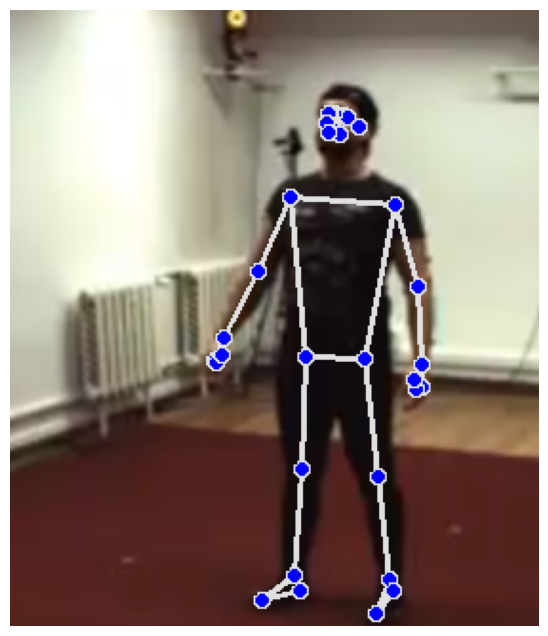

In [8]:

import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

image_path = "/kaggle/input/datasets/jupiter1024/frame0/frame0.png"   # change this to your frame image path

img = cv2.imread(image_path)
if img is None:
    raise FileNotFoundError(f"Could not read {image_path}")

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

mp_pose = mp.solutions.pose
mp_draw = mp.solutions.drawing_utils

with mp_pose.Pose(static_image_mode=True, model_complexity=2) as pose:
    results = pose.process(img_rgb)

if results.pose_landmarks is None:
    print("No pose detected")
else:
    print("Pose detected!")

    vis = img_rgb.copy()
    mp_draw.draw_landmarks(
        vis,
        results.pose_landmarks,
        mp_pose.POSE_CONNECTIONS
    )

    plt.figure(figsize=(8,8))
    plt.imshow(vis)
    plt.axis("off")
    plt.show()

In [ ]:
import json
import cv2
import numpy as np
import mediapipe as mp

# =========================
# 1) Utilities
# =========================
def angle_3d(a, b, c):
    a = np.array(a, dtype=np.float32)
    b = np.array(b, dtype=np.float32)
    c = np.array(c, dtype=np.float32)

    ba = a - b
    bc = c - b

    nba = np.linalg.norm(ba)
    nbc = np.linalg.norm(bc)
    if nba < 1e-8 or nbc < 1e-8:
        return np.nan

    cosang = np.dot(ba, bc) / (nba * nbc)
    cosang = np.clip(cosang, -1.0, 1.0)
    return float(np.degrees(np.arccos(cosang)))


# =========================
# 2) Load Fit3D frame 0
# =========================
json_path = "/kaggle/working/joints3d_25_only/train/s03/joints3d_25/warmup_19.json"   # update if needed

with open(json_path, "r") as f:
    data = json.load(f)

fit = np.array(data["joints3d_25"][0], dtype=np.float32)  # frame 0, shape (25,3)

# Fit3D / ST-GCN candidate joints
# side A: leg 1-2-3, arm 11-12-13
# side B: leg 4-5-6, arm 14-15-16

fit_angles = {
    "A_elbow": angle_3d(fit[11], fit[12], fit[13]),
    "B_elbow": angle_3d(fit[14], fit[15], fit[16]),

    "A_shoulder": angle_3d(fit[12], fit[11], fit[1]),   # elbow-shoulder-hip
    "B_shoulder": angle_3d(fit[15], fit[14], fit[4]),

    "A_hip": angle_3d(fit[11], fit[1], fit[2]),         # shoulder-hip-knee
    "B_hip": angle_3d(fit[14], fit[4], fit[5]),

    "A_knee": angle_3d(fit[1], fit[2], fit[3]),         # hip-knee-ankle
    "B_knee": angle_3d(fit[4], fit[5], fit[6]),
}

print("Fit3D frame0 angles")
for k, v in fit_angles.items():
    print(f"{k:12s}: {v:.2f}")


# =========================
# 3) Run MediaPipe on image
# =========================
image_path = "/kaggle/input/datasets/jupiter1024/frame0/frame0.png"   # your uploaded frame

img = cv2.imread(image_path)
if img is None:
    raise FileNotFoundError(image_path)

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

mp_pose = mp.solutions.pose
with mp_pose.Pose(static_image_mode=True, model_complexity=2) as pose:
    res = pose.process(img_rgb)

if res.pose_landmarks is None:
    raise RuntimeError("MediaPipe failed to detect pose on the image.")

lms = res.pose_landmarks.landmark

def lm(idx):
    p = lms[idx]
    return np.array([p.x, p.y, p.z], dtype=np.float32)

PL = mp_pose.PoseLandmark

# MediaPipe joints
L_SH = lm(PL.LEFT_SHOULDER.value)
R_SH = lm(PL.RIGHT_SHOULDER.value)
L_EL = lm(PL.LEFT_ELBOW.value)
R_EL = lm(PL.RIGHT_ELBOW.value)
L_WR = lm(PL.LEFT_WRIST.value)
R_WR = lm(PL.RIGHT_WRIST.value)

L_HIP = lm(PL.LEFT_HIP.value)
R_HIP = lm(PL.RIGHT_HIP.value)
L_KNEE = lm(PL.LEFT_KNEE.value)
R_KNEE = lm(PL.RIGHT_KNEE.value)
L_ANK = lm(PL.LEFT_ANKLE.value)
R_ANK = lm(PL.RIGHT_ANKLE.value)

mp_angles = {
    "L_elbow": angle_3d(L_SH, L_EL, L_WR),
    "R_elbow": angle_3d(R_SH, R_EL, R_WR),

    "L_shoulder": angle_3d(L_EL, L_SH, L_HIP),
    "R_shoulder": angle_3d(R_EL, R_SH, R_HIP),

    "L_hip": angle_3d(L_SH, L_HIP, L_KNEE),
    "R_hip": angle_3d(R_SH, R_HIP, R_KNEE),

    "L_knee": angle_3d(L_HIP, L_KNEE, L_ANK),
    "R_knee": angle_3d(R_HIP, R_KNEE, R_ANK),
}

print("\nMediaPipe image angles")
for k, v in mp_angles.items():
    print(f"{k:12s}: {v:.2f}")


# =========================
# 4) Compare 2 side hypotheses
# =========================
# Hypothesis H1: Fit A = MP RIGHT, Fit B = MP LEFT
h1_pairs = [
    ("A_elbow", "R_elbow"),
    ("B_elbow", "L_elbow"),
    ("A_shoulder", "R_shoulder"),
    ("B_shoulder", "L_shoulder"),
    ("A_hip", "R_hip"),
    ("B_hip", "L_hip"),
    ("A_knee", "R_knee"),
    ("B_knee", "L_knee"),
]

# Hypothesis H2: Fit A = MP LEFT, Fit B = MP RIGHT
h2_pairs = [
    ("A_elbow", "L_elbow"),
    ("B_elbow", "R_elbow"),
    ("A_shoulder", "L_shoulder"),
    ("B_shoulder", "R_shoulder"),
    ("A_hip", "L_hip"),
    ("B_hip", "R_hip"),
    ("A_knee", "L_knee"),
    ("B_knee", "R_knee"),
]

def score_pairs(pairs, fit_angles, mp_angles):
    diffs = []
    for fk, mk in pairs:
        diffs.append(abs(fit_angles[fk] - mp_angles[mk]))
    return diffs, np.nanmean(diffs)

d1, s1 = score_pairs(h1_pairs, fit_angles, mp_angles)
d2, s2 = score_pairs(h2_pairs, fit_angles, mp_angles)

print("\nHypothesis H1: Fit A = MP RIGHT, Fit B = MP LEFT")
for pair, d in zip(h1_pairs, d1):
    print(f"{pair[0]:12s} vs {pair[1]:12s} -> diff = {d:.2f}")
print("Mean diff:", s1)

print("\nHypothesis H2: Fit A = MP LEFT, Fit B = MP RIGHT")
for pair, d in zip(h2_pairs, d2):
    print(f"{pair[0]:12s} vs {pair[1]:12s} -> diff = {d:.2f}")
print("Mean diff:", s2)

if s1 < s2:
    print("\n>>> Better match: H1 (Fit A = MediaPipe RIGHT)")
else:
    print("\n>>> Better match: H2 (Fit A = MediaPipe LEFT)")

In [30]:
import cv2
import mediapipe as mp
import numpy as np
import json
import os

mp_pose = mp.solutions.pose

# MediaPipe → your 25-joint mapping (approx)
def extract_frame(lms):
    def lm(i):
        p = lms[i]
        return np.array([p.x, p.y, p.z])

    PL = mp.solutions.pose.PoseLandmark

    joints = np.zeros((25, 3), dtype=np.float32)

    # Core mapping
    joints[0]  = (lm(PL.LEFT_HIP.value) + lm(PL.RIGHT_HIP.value)) / 2
    joints[1]  = lm(PL.RIGHT_HIP.value)
    joints[2]  = lm(PL.RIGHT_KNEE.value)
    joints[3]  = lm(PL.RIGHT_ANKLE.value)
    joints[4]  = lm(PL.LEFT_HIP.value)
    joints[5]  = lm(PL.LEFT_KNEE.value)
    joints[6]  = lm(PL.LEFT_ANKLE.value)

    joints[7]  = joints[0]   # spine approx
    joints[8]  = lm(PL.RIGHT_SHOULDER.value) * 0.5 + lm(PL.LEFT_SHOULDER.value) * 0.5
    joints[9]  = joints[8]
    joints[10] = lm(PL.NOSE.value)

    joints[11] = lm(PL.LEFT_SHOULDER.value)
    joints[12] = lm(PL.LEFT_ELBOW.value)
    joints[13] = lm(PL.LEFT_WRIST.value)

    joints[14] = lm(PL.RIGHT_SHOULDER.value)
    joints[15] = lm(PL.RIGHT_ELBOW.value)
    joints[16] = lm(PL.RIGHT_WRIST.value)

    joints[17] = lm(PL.LEFT_FOOT_INDEX.value)
    joints[18] = lm(PL.LEFT_TOE.value) if hasattr(PL, "LEFT_TOE") else joints[17]

    joints[19] = lm(PL.RIGHT_FOOT_INDEX.value)
    joints[20] = lm(PL.RIGHT_TOE.value) if hasattr(PL, "RIGHT_TOE") else joints[19]

    # extras (simple duplication for now)
    joints[21:] = joints[13]  # fill missing fine joints

    return joints


def video_to_json(video_path, out_path):
    cap = cv2.VideoCapture(video_path)
    frames = []

    with mp_pose.Pose(static_image_mode=False, model_complexity=2) as pose:
        while True:
            ret, frame = cap.read()
            if not ret:
                break

            rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            res = pose.process(rgb)

            if res.pose_landmarks is None:
                continue

            lms = res.pose_landmarks.landmark
            joints = extract_frame(lms)
            frames.append(joints.tolist())

    cap.release()

    with open(out_path, "w") as f:
        json.dump({"joints3d_25": frames}, f)

In [31]:
input_root  = "/kaggle/working/fit3d_first_camera"
output_root = "/kaggle/working/joints3d_25_only"

for split in ["train", "test"]:
    split_dir = os.path.join(input_root, split)

    for subject in os.listdir(split_dir):
        video_dir = os.path.join(split_dir, subject, "videos")

        for cam in os.listdir(video_dir):
            cam_path = os.path.join(video_dir, cam)

            for video in os.listdir(cam_path):
                if not video.endswith(".mp4"):
                    continue

                vpath = os.path.join(cam_path, video)

                out_dir = os.path.join(output_root, split, subject, "joints3d_25")
                os.makedirs(out_dir, exist_ok=True)

                out_json = os.path.join(out_dir, video.replace(".mp4", ".json"))

                print("Processing:", vpath)

                video_to_json(vpath, out_json)

Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782197221.910509     744 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782197222.076517     744 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_9.mp4


W0000 00:00:1782197641.305551     758 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782197641.485961     758 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/barbell_row.mp4


W0000 00:00:1782197708.352490     766 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782197708.473008     767 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_12.mp4


W0000 00:00:1782197791.494386     774 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782197791.652611     775 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_5.mp4


W0000 00:00:1782197872.739859     782 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782197872.899079     782 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_19.mp4


W0000 00:00:1782197924.753584     789 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782197924.921688     789 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_8.mp4


W0000 00:00:1782197987.924246     798 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782197988.062823     798 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782198029.648982     805 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198029.814648     805 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782198131.445286     814 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198131.592532     814 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_16.mp4


W0000 00:00:1782198198.771432     822 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198198.941259     822 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/deadlift.mp4


W0000 00:00:1782198377.573783     829 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198377.724578     829 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782198488.045511     837 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198488.219188     837 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_15.mp4


W0000 00:00:1782198588.404466     846 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198588.582755     846 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/pushup.mp4


W0000 00:00:1782198681.017516     853 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198681.162215     853 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_14.mp4


W0000 00:00:1782198758.240598     862 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198758.410355     862 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_6.mp4


W0000 00:00:1782198873.710341     869 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198873.876167     869 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782198972.522821     877 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782198972.658567     877 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/man_maker.mp4


W0000 00:00:1782199047.742386     886 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782199047.860389     886 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782199365.701327     897 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782199365.844153     897 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/w_raise.mp4


W0000 00:00:1782199437.333949     905 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782199437.451625     905 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782199552.094116     912 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782199552.232077     912 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_2.mp4


W0000 00:00:1782199632.145948     921 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782199632.297277     921 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782199714.913575     929 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782199715.047982     929 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/walk_the_box.mp4


W0000 00:00:1782199809.573822     938 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782199809.718972     938 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_1.mp4


W0000 00:00:1782200144.552322     946 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200144.680243     946 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/one_arm_row.mp4


W0000 00:00:1782200263.770793     953 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200263.902203     955 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/drag_curl.mp4


W0000 00:00:1782200349.064912     962 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200349.183077     962 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782200482.615568     969 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200482.720080     969 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_3.mp4


W0000 00:00:1782200562.590140     978 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200562.739416     978 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_4.mp4


W0000 00:00:1782200638.024736     986 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200638.161014     986 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_7.mp4


W0000 00:00:1782200695.209353     994 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200695.342741     994 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_10.mp4


W0000 00:00:1782200726.510705    1001 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200726.659952    1001 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782200788.392342    1009 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200788.506487    1009 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782200856.978389    1018 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200857.126983    1018 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782200925.844579    1026 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782200925.972691    1026 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782201003.437700    1034 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201003.576780    1034 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_17.mp4


W0000 00:00:1782201091.701904    1042 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201091.793172    1042 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_13.mp4


W0000 00:00:1782201134.621202    1049 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201134.752022    1049 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782201246.641183    1058 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201246.793809    1058 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782201354.016107    1066 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201354.115759    1066 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/burpees.mp4


W0000 00:00:1782201418.297520    1074 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201418.427193    1074 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/clean_and_press.mp4


W0000 00:00:1782201566.235757    1081 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201566.374334    1081 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/squat.mp4


W0000 00:00:1782201700.180403    1091 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201700.316914    1091 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_18.mp4


W0000 00:00:1782201800.437254    1099 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201800.555881    1097 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/mule_kick.mp4


W0000 00:00:1782201866.383587    1106 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201866.519427    1106 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782201921.575539    1114 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201921.688769    1114 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s04/videos/50591643/warmup_11.mp4


W0000 00:00:1782201998.125704    1122 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782201998.248563    1121 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782202047.919933    1130 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202048.036496    1130 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_9.mp4


W0000 00:00:1782202413.263179    1137 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202413.409170    1137 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/barbell_row.mp4


W0000 00:00:1782202479.945188    1146 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202480.062605    1146 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_12.mp4


W0000 00:00:1782202565.959642    1153 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202566.073027    1155 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_5.mp4


W0000 00:00:1782202650.862597    1162 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202651.009109    1162 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_19.mp4


W0000 00:00:1782202694.992200    1169 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202695.124842    1169 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_8.mp4


W0000 00:00:1782202757.062162    1178 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202757.178586    1179 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782202800.003956    1186 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202800.132074    1186 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782202856.105396    1194 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202856.236587    1194 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_16.mp4


W0000 00:00:1782202912.813098    1202 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782202912.946400    1202 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/deadlift.mp4


W0000 00:00:1782203045.925876    1210 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203046.055128    1210 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782203125.698161    1218 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203125.848532    1217 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_15.mp4


W0000 00:00:1782203192.058116    1226 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203192.156576    1226 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/pushup.mp4


W0000 00:00:1782203279.648778    1233 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203279.769006    1233 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_14.mp4


W0000 00:00:1782203333.050300    1242 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203333.199346    1242 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_6.mp4


W0000 00:00:1782203489.571123    1250 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203489.704674    1250 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782203581.610255    1257 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203581.728601    1257 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/man_maker.mp4


W0000 00:00:1782203642.199668    1266 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203642.319261    1266 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782203856.518569    1273 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203856.647037    1273 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/w_raise.mp4


W0000 00:00:1782203913.074544    1282 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203913.207655    1282 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782203977.200710    1290 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782203977.329147    1290 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_2.mp4


W0000 00:00:1782204060.156053    1298 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204060.305733    1298 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782204138.197878    1305 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204138.347551    1305 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/walk_the_box.mp4


W0000 00:00:1782204243.498127    1314 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204243.648542    1314 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_1.mp4


W0000 00:00:1782204598.199778    1321 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204598.316243    1321 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/one_arm_row.mp4


W0000 00:00:1782204749.113230    1329 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204749.261956    1329 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/drag_curl.mp4


W0000 00:00:1782204800.472255    1338 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204800.602713    1338 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782204894.933590    1346 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204895.072631    1346 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_3.mp4


W0000 00:00:1782204965.831815    1353 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782204965.942391    1353 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_4.mp4


W0000 00:00:1782205056.653700    1363 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205056.804091    1363 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_7.mp4


W0000 00:00:1782205121.784387    1369 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205121.918199    1369 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_10.mp4


W0000 00:00:1782205159.124619    1378 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205159.237969    1378 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782205233.655004    1386 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205233.767972    1386 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782205288.178799    1394 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205288.327414    1394 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782205342.331571    1402 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205342.461550    1402 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782205405.463207    1410 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205405.595143    1411 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_17.mp4


W0000 00:00:1782205481.703313    1419 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205481.824274    1419 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_13.mp4


W0000 00:00:1782205531.137652    1426 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205531.261757    1426 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782205616.957117    1434 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205617.071746    1434 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782205681.339849    1442 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205681.473901    1442 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/burpees.mp4


W0000 00:00:1782205738.319422    1449 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205738.445941    1449 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/clean_and_press.mp4


W0000 00:00:1782205838.081811    1458 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205838.229482    1458 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/squat.mp4


W0000 00:00:1782205929.204914    1467 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782205929.332128    1467 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_18.mp4


W0000 00:00:1782206022.275249    1474 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206022.394048    1475 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/mule_kick.mp4


W0000 00:00:1782206073.420631    1482 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206073.552903    1482 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782206125.770371    1490 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206125.914020    1490 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s09/videos/50591643/warmup_11.mp4


W0000 00:00:1782206181.084351    1498 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206181.216224    1498 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782206239.714516    1506 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206239.858086    1506 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_9.mp4


W0000 00:00:1782206484.649741    1514 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206484.787420    1514 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/barbell_row.mp4


W0000 00:00:1782206542.402621    1521 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206542.535777    1521 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_12.mp4


W0000 00:00:1782206605.589621    1530 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206605.729415    1530 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_5.mp4


W0000 00:00:1782206694.554502    1537 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206694.708670    1537 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_19.mp4


W0000 00:00:1782206738.012939    1546 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206738.109137    1546 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_8.mp4


W0000 00:00:1782206778.188216    1553 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206778.312510    1553 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782206819.285353    1562 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206819.413918    1562 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782206877.126664    1569 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206877.272111    1569 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_16.mp4


W0000 00:00:1782206931.030296    1578 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782206931.166542    1577 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/deadlift.mp4


W0000 00:00:1782207033.028736    1586 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207033.157138    1586 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782207115.826655    1593 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207115.959857    1593 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_15.mp4


W0000 00:00:1782207187.589218    1602 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207187.711402    1603 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/pushup.mp4


W0000 00:00:1782207267.458224    1610 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207267.578245    1610 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_14.mp4


W0000 00:00:1782207321.810623    1617 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207321.928607    1617 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_6.mp4


W0000 00:00:1782207438.742351    1625 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207438.875459    1625 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782207538.724580    1634 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207538.878883    1634 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/man_maker.mp4


W0000 00:00:1782207604.646637    1642 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207604.778178    1642 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782207774.495533    1650 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207774.624089    1650 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/w_raise.mp4


W0000 00:00:1782207827.240222    1659 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207827.372918    1659 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782207884.621530    1665 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207884.718516    1665 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_2.mp4


W0000 00:00:1782207960.005378    1673 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782207960.132971    1673 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782208036.597352    1681 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208036.749894    1681 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/walk_the_box.mp4


W0000 00:00:1782208112.537428    1690 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208112.662579    1691 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_1.mp4


W0000 00:00:1782208460.032315    1698 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208460.164376    1698 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/one_arm_row.mp4


W0000 00:00:1782208568.340464    1705 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208568.478602    1705 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/drag_curl.mp4


W0000 00:00:1782208616.150938    1714 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208616.297315    1714 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782208695.603663    1722 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208695.752559    1723 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_3.mp4


W0000 00:00:1782208768.322285    1731 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208768.435642    1731 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_4.mp4


W0000 00:00:1782208841.051341    1738 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208841.186080    1738 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_7.mp4


W0000 00:00:1782208902.511952    1745 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208902.637749    1745 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_10.mp4


W0000 00:00:1782208931.527196    1754 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208931.662249    1754 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782208987.617492    1761 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782208987.750128    1761 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782209046.268591    1769 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209046.399350    1769 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782209097.618868    1778 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209097.749573    1778 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782209162.631038    1786 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209162.762204    1786 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_17.mp4


W0000 00:00:1782209235.014758    1794 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209235.162846    1794 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_13.mp4


W0000 00:00:1782209277.025366    1802 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209277.153250    1803 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782209347.635501    1809 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209347.761987    1809 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782209410.866858    1818 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209410.997772    1818 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/burpees.mp4


W0000 00:00:1782209472.280571    1826 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209472.427020    1826 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/clean_and_press.mp4


W0000 00:00:1782209539.781247    1834 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209539.905214    1834 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/squat.mp4


W0000 00:00:1782209617.299944    1842 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209617.449866    1843 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_18.mp4


W0000 00:00:1782209712.700047    1849 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209712.830628    1849 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/mule_kick.mp4


W0000 00:00:1782209759.706285    1857 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209759.853203    1857 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782209811.031305    1866 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209811.156314    1865 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s08/videos/50591643/warmup_11.mp4


W0000 00:00:1782209865.450332    1874 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209865.593440    1874 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782209924.679042    1881 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782209924.794629    1881 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_9.mp4


W0000 00:00:1782210168.324735    1890 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210168.459091    1891 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/barbell_row.mp4


W0000 00:00:1782210233.856811    1898 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210233.988973    1898 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_12.mp4


W0000 00:00:1782210308.283470    1905 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210308.381314    1905 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_5.mp4


W0000 00:00:1782210434.149072    1914 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210434.278760    1914 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_19.mp4


W0000 00:00:1782210483.202158    1921 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210483.347206    1921 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_8.mp4


W0000 00:00:1782210538.211875    1930 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210538.344750    1930 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782210591.269920    1938 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210591.383242    1938 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782210668.926271    1945 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210669.056481    1945 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_16.mp4


W0000 00:00:1782210749.961072    1953 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210750.107403    1953 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/deadlift.mp4


W0000 00:00:1782210920.941946    1962 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782210921.068891    1962 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782211043.172678    1970 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211043.293385    1970 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_15.mp4


W0000 00:00:1782211115.062616    1978 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211115.202697    1980 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/pushup.mp4


W0000 00:00:1782211223.270067    1993 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211223.402377    1993 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_14.mp4


W0000 00:00:1782211297.812412    2000 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211297.934814    2000 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_6.mp4


W0000 00:00:1782211427.336100    2008 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211427.485177    2011 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782211523.051813    2016 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211523.178205    2016 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/man_maker.mp4


W0000 00:00:1782211607.293726    2024 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211607.419640    2024 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782211844.489880    2032 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211844.617088    2032 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/w_raise.mp4


W0000 00:00:1782211899.715563    2041 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211899.858319    2041 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782211967.017854    2048 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782211967.142375    2048 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_2.mp4


W0000 00:00:1782212055.811880    2057 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212055.946373    2057 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782212159.892108    2064 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212160.024767    2064 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/walk_the_box.mp4


W0000 00:00:1782212246.345982    2072 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212246.455288    2072 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_1.mp4


W0000 00:00:1782212545.113441    2080 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212545.260630    2083 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/one_arm_row.mp4


W0000 00:00:1782212696.962051    2088 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212697.069471    2088 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/drag_curl.mp4


W0000 00:00:1782212762.418499    2097 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212762.550237    2097 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782212861.271620    2105 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212861.392621    2106 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_3.mp4


W0000 00:00:1782212944.018382    2112 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782212944.141531    2112 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_4.mp4


W0000 00:00:1782213061.418406    2120 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213061.542278    2120 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_7.mp4


W0000 00:00:1782213139.981451    2128 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213140.127112    2131 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_10.mp4


W0000 00:00:1782213179.096725    2136 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213179.237122    2136 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782213247.713410    2145 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213247.840603    2145 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782213319.078070    2152 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213319.204314    2152 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782213404.103656    2161 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213404.236218    2161 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782213481.400571    2169 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213481.550358    2169 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_17.mp4


W0000 00:00:1782213562.745440    2177 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213562.874324    2177 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_13.mp4


W0000 00:00:1782213615.954283    2184 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213616.066445    2184 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782213723.306937    2192 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213723.463648    2193 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782213819.515461    2201 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213819.662416    2201 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/burpees.mp4


W0000 00:00:1782213875.246686    2209 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213875.405424    2211 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/clean_and_press.mp4


W0000 00:00:1782213941.400487    2216 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782213941.510932    2216 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/squat.mp4


W0000 00:00:1782214054.204676    2225 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214054.337623    2225 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_18.mp4


W0000 00:00:1782214163.350402    2232 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214163.478147    2232 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/mule_kick.mp4


W0000 00:00:1782214226.032681    2242 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214226.162236    2242 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782214284.089946    2249 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214284.220261    2249 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s03/videos/50591643/warmup_11.mp4


W0000 00:00:1782214345.962969    2257 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214346.090330    2257 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782214405.435899    2265 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214405.543210    2265 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_9.mp4


W0000 00:00:1782214673.078143    2273 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214673.203757    2275 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/barbell_row.mp4


W0000 00:00:1782214735.307735    2280 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214735.436608    2280 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_12.mp4


W0000 00:00:1782214831.917995    2288 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214832.057747    2290 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_5.mp4


W0000 00:00:1782214977.506896    2297 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782214977.634986    2297 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_19.mp4


W0000 00:00:1782215031.341327    2304 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215031.461469    2306 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_8.mp4


W0000 00:00:1782215098.212560    2312 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215098.308623    2315 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782215145.580447    2321 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215145.708599    2321 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782215220.113666    2329 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215220.253631    2329 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_16.mp4


W0000 00:00:1782215289.787777    2336 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215289.895530    2336 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/deadlift.mp4


W0000 00:00:1782215437.179146    2345 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215437.307427    2345 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782215570.752726    2353 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215570.886009    2353 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_15.mp4


W0000 00:00:1782215645.551034    2361 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215645.680720    2361 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/pushup.mp4


W0000 00:00:1782215730.040716    2369 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215730.175187    2369 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_14.mp4


W0000 00:00:1782215813.593304    2377 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215813.722810    2377 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_6.mp4


W0000 00:00:1782215953.613942    2385 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782215953.741550    2385 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782216065.518776    2393 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216065.655275    2393 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/man_maker.mp4


W0000 00:00:1782216142.781201    2401 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216142.913240    2401 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782216459.471596    2409 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216459.597214    2409 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/w_raise.mp4


W0000 00:00:1782216543.810776    2417 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216543.940462    2417 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782216626.425845    2425 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216626.556318    2425 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_2.mp4


W0000 00:00:1782216732.529797    2433 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216732.659806    2433 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782216838.406852    2440 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216838.538323    2440 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/walk_the_box.mp4


W0000 00:00:1782216940.044183    2449 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782216940.200412    2451 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_1.mp4


W0000 00:00:1782217160.593730    2463 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217160.727676    2463 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/one_arm_row.mp4


W0000 00:00:1782217370.495931    2472 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217370.642658    2474 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/drag_curl.mp4


W0000 00:00:1782217431.617998    2480 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217431.745920    2480 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782217548.212797    2488 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217548.340326    2488 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_3.mp4


W0000 00:00:1782217659.308360    2496 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217659.432695    2496 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_4.mp4


W0000 00:00:1782217781.065673    2504 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217781.205661    2506 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_7.mp4


W0000 00:00:1782217865.013103    2511 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217865.136827    2511 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_10.mp4


W0000 00:00:1782217908.474204    2521 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217908.605203    2521 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782217986.175046    2527 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782217986.312596    2530 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782218058.962154    2536 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218059.093853    2537 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782218142.863084    2544 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218142.989621    2545 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782218259.523613    2553 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218259.641389    2554 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_17.mp4


W0000 00:00:1782218354.954481    2560 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218355.084845    2560 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_13.mp4


W0000 00:00:1782218426.581838    2568 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218426.712993    2568 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782218524.591688    2578 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218524.727915    2578 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782218616.220935    2586 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218616.352452    2586 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/burpees.mp4


W0000 00:00:1782218712.182065    2593 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218712.319218    2593 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/clean_and_press.mp4


W0000 00:00:1782218814.838695    2603 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218814.963363    2603 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/squat.mp4


W0000 00:00:1782218971.871699    2610 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782218971.998369    2610 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_18.mp4


W0000 00:00:1782219123.075497    2618 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219123.215977    2620 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/mule_kick.mp4


W0000 00:00:1782219197.618037    2626 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219197.745949    2626 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782219272.599140    2633 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219272.736738    2633 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s11/videos/50591643/warmup_11.mp4


W0000 00:00:1782219342.616142    2641 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219342.741161    2643 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782219402.049644    2650 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219402.159102    2650 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_9.mp4


W0000 00:00:1782219640.916623    2657 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219641.049403    2657 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/barbell_row.mp4


W0000 00:00:1782219704.611308    2665 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219704.741316    2665 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_12.mp4


W0000 00:00:1782219788.061618    2673 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219788.197628    2673 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_5.mp4


W0000 00:00:1782219903.757902    2682 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219903.882140    2683 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_19.mp4


W0000 00:00:1782219956.091831    2690 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782219956.225994    2690 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_8.mp4


W0000 00:00:1782220004.273963    2697 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220004.373311    2697 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782220047.151573    2706 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220047.281657    2706 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782220093.680448    2714 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220093.816122    2714 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_16.mp4


W0000 00:00:1782220153.633091    2722 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220153.768483    2722 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/deadlift.mp4


W0000 00:00:1782220282.211707    2730 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220282.354531    2731 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782220368.350997    2738 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220368.485506    2738 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_15.mp4


W0000 00:00:1782220443.782028    2746 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220443.932856    2748 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/pushup.mp4


W0000 00:00:1782220526.490700    2754 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220526.641754    2756 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_14.mp4


W0000 00:00:1782220590.057420    2761 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220590.170358    2761 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_6.mp4


W0000 00:00:1782220723.749783    2770 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220723.884185    2770 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782220838.147977    2778 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220838.287089    2778 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/man_maker.mp4


W0000 00:00:1782220898.701892    2786 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782220898.830899    2786 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782221131.299515    2794 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221131.443588    2794 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/w_raise.mp4


W0000 00:00:1782221186.317642    2803 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221186.442683    2803 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782221244.265945    2810 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221244.394707    2810 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_2.mp4


W0000 00:00:1782221309.636094    2818 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221309.762037    2818 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782221432.615557    2826 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221432.745290    2826 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/walk_the_box.mp4


W0000 00:00:1782221511.012556    2834 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221511.105890    2834 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_1.mp4


W0000 00:00:1782221783.360831    2841 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221783.519874    2844 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/one_arm_row.mp4


W0000 00:00:1782221918.359280    2849 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221918.516291    2850 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/drag_curl.mp4


W0000 00:00:1782221973.640383    2858 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782221973.764532    2858 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782222058.990240    2866 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222059.120864    2866 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_3.mp4


W0000 00:00:1782222129.766935    2873 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222129.912164    2874 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_4.mp4


W0000 00:00:1782222236.332778    2882 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222236.464871    2882 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_7.mp4


W0000 00:00:1782222305.173046    2890 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222305.305072    2890 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_10.mp4


W0000 00:00:1782222340.708315    2898 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222340.836876    2898 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782222400.559519    2905 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222400.695189    2906 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782222448.450012    2914 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222448.583967    2914 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782222506.066022    2921 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222506.207518    2921 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782222603.628023    2930 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222603.744675    2929 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_17.mp4


W0000 00:00:1782222691.721799    2938 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222691.858422    2938 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_13.mp4


W0000 00:00:1782222737.169336    2946 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222737.295897    2946 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782222814.966239    2955 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222815.100446    2955 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782222895.213363    2962 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222895.344587    2962 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/burpees.mp4


W0000 00:00:1782222963.037374    2969 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782222963.167808    2969 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/clean_and_press.mp4


W0000 00:00:1782223041.028226    2978 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223041.152349    2978 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/squat.mp4


W0000 00:00:1782223122.639323    2986 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223122.781026    2986 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_18.mp4


W0000 00:00:1782223221.354748    2994 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223221.501936    2994 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/mule_kick.mp4


W0000 00:00:1782223271.608449    3002 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223271.702467    3002 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782223318.799531    3010 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223318.929994    3010 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s05/videos/50591643/warmup_11.mp4


W0000 00:00:1782223372.831029    3018 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223372.926797    3019 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782223439.460393    3026 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223439.600306    3027 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_9.mp4


W0000 00:00:1782223839.594395    3033 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223839.731018    3033 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/barbell_row.mp4


W0000 00:00:1782223923.063090    3042 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782223923.195704    3042 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_12.mp4


W0000 00:00:1782224013.227645    3050 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224013.362532    3050 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_5.mp4


W0000 00:00:1782224110.606612    3058 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224110.738142    3058 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_19.mp4


W0000 00:00:1782224166.645777    3066 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224166.773203    3066 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_8.mp4


W0000 00:00:1782224261.761942    3073 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224261.896341    3073 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782224317.269759    3082 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224317.407511    3082 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782224376.876388    3089 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224376.965785    3089 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_16.mp4


W0000 00:00:1782224457.899710    3098 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224458.046710    3100 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/deadlift.mp4


W0000 00:00:1782224614.055789    3105 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224614.189247    3105 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782224706.261544    3114 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224706.389641    3114 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_15.mp4


W0000 00:00:1782224775.204716    3123 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224775.335646    3123 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/pushup.mp4


W0000 00:00:1782224872.816044    3129 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224872.952607    3129 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_14.mp4


W0000 00:00:1782224957.458044    3137 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782224957.611379    3138 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_6.mp4


W0000 00:00:1782225105.116622    3145 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225105.281925    3148 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782225203.608456    3154 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225203.749674    3154 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/man_maker.mp4


W0000 00:00:1782225300.281684    3162 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225300.419907    3162 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782225628.252227    3170 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225628.387094    3170 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/w_raise.mp4


W0000 00:00:1782225695.554461    3178 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225695.684192    3178 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782225763.871732    3186 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225764.000419    3186 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_2.mp4


W0000 00:00:1782225829.698527    3193 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225829.832938    3193 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782225921.608887    3203 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782225921.736180    3203 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/walk_the_box.mp4


W0000 00:00:1782226007.764226    3210 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226007.899905    3210 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_1.mp4


W0000 00:00:1782226255.943370    3218 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226256.078279    3218 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/one_arm_row.mp4


W0000 00:00:1782226476.218024    3225 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226476.347732    3225 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/drag_curl.mp4


W0000 00:00:1782226539.095563    3234 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226539.217585    3234 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782226652.190329    3242 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226652.336020    3242 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_3.mp4


W0000 00:00:1782226740.192157    3250 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226740.321273    3250 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_4.mp4


W0000 00:00:1782226816.058205    3259 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226816.189298    3259 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_7.mp4


W0000 00:00:1782226888.586998    3266 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226888.735136    3268 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_10.mp4


W0000 00:00:1782226931.560788    3274 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782226931.688913    3274 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782227004.535127    3284 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227004.672117    3283 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782227072.859653    3290 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227072.986368    3290 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782227137.770547    3298 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227137.894578    3298 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782227223.704653    3306 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227223.841109    3307 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_17.mp4


W0000 00:00:1782227316.274407    3314 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227316.412466    3316 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_13.mp4


W0000 00:00:1782227397.081102    3321 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227397.212136    3321 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782227488.964816    3329 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227489.095941    3329 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782227567.732621    3337 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227567.871725    3337 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/burpees.mp4


W0000 00:00:1782227649.519506    3346 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227649.649463    3346 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/clean_and_press.mp4


W0000 00:00:1782227781.604325    3354 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227781.743762    3354 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/squat.mp4


W0000 00:00:1782227897.516362    3362 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782227897.653403    3362 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_18.mp4


W0000 00:00:1782228020.706522    3370 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228020.857760    3370 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/mule_kick.mp4


W0000 00:00:1782228123.665220    3378 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228123.797761    3378 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782228205.155668    3386 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228205.316087    3386 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_11.mp4


W0000 00:00:1782228290.246430    3393 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228290.377154    3393 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/dumbbell_curl_trifecta.mp4


W0000 00:00:1782228349.802088    3401 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228349.892250    3401 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_9.mp4


W0000 00:00:1782228605.062243    3410 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228605.189652    3410 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/barbell_row.mp4


W0000 00:00:1782228671.809184    3417 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228671.944519    3417 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_12.mp4


W0000 00:00:1782228729.685298    3426 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228729.812706    3426 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_5.mp4


W0000 00:00:1782228844.972110    3433 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228845.134148    3434 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_19.mp4


W0000 00:00:1782228891.355097    3442 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228891.487854    3442 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_8.mp4


W0000 00:00:1782228941.874146    3449 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228942.006328    3449 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/side_lateral_raise.mp4


W0000 00:00:1782228994.878984    3460 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782228995.007357    3460 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/diamond_pushup.mp4


W0000 00:00:1782229048.993293    3465 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229049.130923    3467 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_16.mp4


W0000 00:00:1782229108.293631    3474 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229108.422986    3474 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/deadlift.mp4


W0000 00:00:1782229213.924142    3481 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229214.049613    3481 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/dumbbell_high_pulls.mp4


W0000 00:00:1782229309.953314    3490 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229310.091866    3490 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_15.mp4


W0000 00:00:1782229365.469803    3497 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229365.621759    3497 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/pushup.mp4


W0000 00:00:1782229479.001211    3506 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229479.138373    3506 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_14.mp4


W0000 00:00:1782229543.269283    3514 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229543.399103    3514 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_6.mp4


W0000 00:00:1782229705.429792    3522 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229705.562523    3522 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/dumbbell_scaptions.mp4


W0000 00:00:1782229802.447638    3529 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229802.585722    3529 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/man_maker.mp4


W0000 00:00:1782229860.629334    3539 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782229860.766307    3540 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/dumbbell_biceps_curls.mp4


W0000 00:00:1782230111.731895    3545 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230111.863815    3545 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/w_raise.mp4


W0000 00:00:1782230172.503350    3553 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230172.628227    3556 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/barbell_shrug.mp4


W0000 00:00:1782230242.342149    3562 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230242.493624    3562 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_2.mp4


W0000 00:00:1782230306.647458    3569 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230306.781049    3569 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/standing_ab_twists.mp4


W0000 00:00:1782230370.696549    3578 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230370.827972    3578 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/walk_the_box.mp4


W0000 00:00:1782230457.914762    3585 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230458.041149    3585 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_1.mp4


W0000 00:00:1782230741.270934    3594 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230741.410751    3596 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/one_arm_row.mp4


W0000 00:00:1782230881.516942    3601 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230881.663854    3602 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/drag_curl.mp4


W0000 00:00:1782230933.611226    3610 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782230933.767679    3612 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/barbell_dead_row.mp4


W0000 00:00:1782231033.609646    3618 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231033.744617    3618 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_3.mp4


W0000 00:00:1782231095.914760    3626 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231096.051924    3626 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_4.mp4


W0000 00:00:1782231172.606510    3635 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231172.739012    3635 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_7.mp4


W0000 00:00:1782231244.909283    3642 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231245.045315    3642 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_10.mp4


W0000 00:00:1782231290.989484    3650 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231291.134393    3649 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/dumbbell_overhead_shoulder_press.mp4


W0000 00:00:1782231355.478806    3659 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231355.609800    3659 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/neutral_overhead_shoulder_press.mp4


W0000 00:00:1782231415.839289    3665 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231415.965753    3665 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/overhead_extension_thruster.mp4


W0000 00:00:1782231465.547913    3674 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231465.670911    3674 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/dumbbell_reverse_lunge.mp4


W0000 00:00:1782231544.414868    3682 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231544.542091    3682 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_17.mp4


W0000 00:00:1782231611.443812    3691 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231611.573112    3691 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_13.mp4


W0000 00:00:1782231659.218578    3699 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231659.343841    3699 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/overhead_trap_raises.mp4


W0000 00:00:1782231741.959958    3707 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231742.109852    3709 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/band_pull_apart.mp4


W0000 00:00:1782231820.329936    3714 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231820.454033    3714 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/burpees.mp4


W0000 00:00:1782231887.409615    3723 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782231887.548263    3723 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/clean_and_press.mp4


W0000 00:00:1782232015.115819    3731 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782232015.240829    3731 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/squat.mp4


W0000 00:00:1782232140.163556    3738 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782232140.290219    3738 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_18.mp4


W0000 00:00:1782232216.899623    3747 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782232217.028357    3747 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/mule_kick.mp4


W0000 00:00:1782232265.583141    3756 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782232265.678678    3754 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/dumbbell_hammer_curls.mp4


W0000 00:00:1782232320.053446    3763 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782232320.180194    3763 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Processing: /kaggle/working/fit3d_first_camera/train/s07/videos/50591643/warmup_11.mp4


W0000 00:00:1782232378.529404    3770 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782232378.663874    3770 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/fit3d_first_camera/test'

In [32]:
import shutil
import os

output_root = "/kaggle/working/joints3d_25_only"
zip_base = "/kaggle/working/joints3d_25_only_backup"   # will create .zip

if not os.path.exists(output_root):
    raise FileNotFoundError(f"{output_root} does not exist")

shutil.make_archive(zip_base, "zip", output_root)
print("Created zip:", zip_base + ".zip")

Created zip: /kaggle/working/joints3d_25_only_backup.zip


In [33]:
import os

zip_file = "/kaggle/working/joints3d_25_only_backup.zip"

print("Exists:", os.path.exists(zip_file))
print("Size (MB):", os.path.getsize(zip_file) / 1024 / 1024)

Exists: True
Size (MB): 543.2858629226685


In [34]:
from IPython.display import FileLink, display

zip_file = "/kaggle/working/joints3d_25_only_backup.zip"

display(FileLink(zip_file))

/kaggle/working/joints3d_25_only_backup.zip

In [38]:
import os

os.system(
    'rclone copy "/kaggle/working/joints3d_25_only_backup.zip" '
    'gdrive:/Fitness_AI_Project/'
)

0

In [31]:
"""
fit3d ST-GCN Preprocessor
============================
Input : train/
          s11/joints3d_25/*.json
          s05/joints3d_25/*.json
          ...

Output: gcn_dataset.pt
        A single torch-serialised dict containing:
          {
            "train": list[ClipSample],
            "test" : list[ClipSample],
          }
"""

import os, json
import numpy as np
import torch
from typing import List, Dict, Any

# ── Joint indices ─────────────────────────────────────────────────────────────
J = {
    "hips":0,"r_hip":1,"r_knee":2,"r_ankle":3,
    "l_hip":4,"l_knee":5,"l_ankle":6,
    "spine":7,"spine1":8,"neck":9,"head":10,
    "l_shoulder":11,"l_elbow":12,"l_wrist":13,
    "r_shoulder":14,"r_elbow":15,"r_wrist":16,
    "l_foot":17,"l_toe":18,"r_foot":19,"r_toe":20,
    "l_thumb":21,"l_tip":22,"r_thumb":23,"r_tip":24,
}

# ── Bone edges (undirected; each pair listed once) ────────────────────────────
EDGES = [
    # spine
    (0,7),(7,8),(8,9),(9,10),
    # right leg
    (0,1),(1,2),(2,3),(3,17),(17,18),
    # left leg
    (0,4),(4,5),(5,6),(6,19),(19,20),
    # right arm
    (8,14),(14,15),(15,16),(16,23),(23,24),
    # left arm
    (8,11),(11,12),(12,13),(13,21),(21,22),
    # shoulder / hip cross-links (symmetry aids GCN)
    (11,14),   # L-shoulder to R-shoulder
    (1,4),     # R-hip to L-hip
]

N_JOINTS = 25


# ── Build adjacency matrix ────────────────────────────────────────────────────

def build_adj(add_self_loops: bool = True) -> torch.Tensor:
    """Return D^{-1/2} A D^{-1/2} normalised adjacency, shape (N, N)."""
    A = np.zeros((N_JOINTS, N_JOINTS), dtype=np.float32)
    for i, j in EDGES:
        A[i, j] = 1.0
        A[j, i] = 1.0
    if add_self_loops:
        A += np.eye(N_JOINTS, dtype=np.float32)
    D = A.sum(axis=1)
    D_inv_sqrt = np.where(D > 0, 1.0 / np.sqrt(D), 0.0)
    A_norm = D_inv_sqrt[:, None] * A * D_inv_sqrt[None, :]
    return torch.tensor(A_norm, dtype=torch.float32)


# ── Per-clip feature extraction ───────────────────────────────────────────────

def torso_normalise_seq(joints_seq: np.ndarray) -> np.ndarray:
    """
    joints_seq: (T, 25, 3)
    Returns (T, 25, 3) with hips at origin, torso-height = 1.
    We use the *mean* torso length over the clip for stability.
    """
    hips  = joints_seq[:, J["hips"], :]    # (T, 3)
    neck  = joints_seq[:, J["neck"], :]    # (T, 3)
    translated = joints_seq - hips[:, None, :]
    torso_len  = np.linalg.norm(neck - hips, axis=1).mean()
    if torso_len < 1e-6:
        torso_len = 1.0
    return translated / torso_len


def bone_length_ratios(joints_seq: np.ndarray) -> np.ndarray:
    """
    For each joint, compute the length of the bone connecting it to its
    parent (first EDGE that references it).  Return (25,) ratio vector,
    where ratio = bone_length / torso_length.
    We use mean over the sequence for robustness.
    """
    hips  = joints_seq[:, J["hips"], :]
    neck  = joints_seq[:, J["neck"], :]
    torso = np.linalg.norm(neck - hips, axis=1).mean() + 1e-8

    # Build parent mapping from EDGES (first occurrence of a joint = its parent)
    parent = {0: 0}   # root is its own parent
    for (i, j) in EDGES:
        if j not in parent:
            parent[j] = i
        if i not in parent:
            parent[i] = j

    ratios = np.zeros(N_JOINTS, dtype=np.float32)
    for jdx in range(N_JOINTS):
        p = parent.get(jdx, jdx)
        bone_len = np.linalg.norm(
            joints_seq[:, jdx, :] - joints_seq[:, p, :], axis=1
        ).mean()
        ratios[jdx] = bone_len / torso
    return ratios


def extract_node_features(joints_seq: np.ndarray) -> np.ndarray:
    """
    joints_seq : (T, 25, 3) raw coordinates

    Returns     : (T, 25, 10)
      channels  : [x, y, z, vx, vy, vz, ax, ay, az, bone_ratio]
    """
    T = joints_seq.shape[0]

    # Torso-normalised positions
    pos  = torso_normalise_seq(joints_seq)      # (T, 25, 3)

    # Velocity (central diff where possible)
    vel  = np.zeros_like(pos)
    vel[1:]   = pos[1:] - pos[:-1]
    vel[0]    = vel[1]                          # repeat first frame

    # Acceleration
    acc  = np.zeros_like(vel)
    acc[1:]   = vel[1:] - vel[:-1]
    acc[0]    = acc[1]
    acc[1]    = acc[2] if T > 2 else acc[1]

    # Bone-length ratio — static per joint, broadcast to (T, 25, 1)
    br = bone_length_ratios(joints_seq)         # (25,)
    br_expanded = np.tile(br[None, :, None], (T, 1, 1))  # (T, 25, 1)

    feat = np.concatenate([pos, vel, acc, br_expanded], axis=-1)  # (T, 25, 10)
    return feat.astype(np.float32)


# ── Dataset builder ───────────────────────────────────────────────────────────

def build_dataset(root: str, output_pt: str):
    """
    root       : path to train/ (contains subject folders)
    output_pt  : where to save gcn_dataset.pt
    """
    adj = build_adj()

    dataset: Dict[str, List[Dict[str, Any]]] = {"train": [], "test": []}

    # Since your data only has train/ folder, we'll use it for training
    # If you have a test/ folder, you can add it here
    for split in ["train"]:  # Changed from ["train", "test"] to just ["train"]
        split_dir = os.path.join(root, split)
        if not os.path.isdir(split_dir):
            print(f"  [skip] {split_dir} not found")
            continue

        subjects = sorted(os.listdir(split_dir))
        print(f"Found subjects: {subjects}")
        
        for subject in subjects:
            jdir = os.path.join(split_dir, subject, "joints3d_25")
            if not os.path.isdir(jdir):
                print(f"  [skip] {jdir} not found")
                continue

            json_files = sorted(f for f in os.listdir(jdir) if f.endswith(".json"))
            print(f"  {split}/{subject}: {len(json_files)} exercises")

            for jf in json_files:
                exercise = os.path.splitext(jf)[0]
                path     = os.path.join(jdir, jf)
                try:
                    with open(path) as f:
                        data = json.load(f)
                    
                    # Check if data has the expected format
                    if "joints3d_25" in data:
                        frames_raw = data["joints3d_25"]
                    else:
                        # Try alternative format if needed
                        print(f"    Warning: No 'joints3d_25' key in {jf}, trying first key")
                        frames_raw = list(data.values())[0] if data else []
                    
                    joints_seq = np.array(frames_raw, dtype=np.float32)  # (T,25,3)
                    
                    # Validate shape
                    if len(joints_seq.shape) != 3 or joints_seq.shape[1] != 25:
                        print(f"    Warning: Unexpected shape in {jf}: {joints_seq.shape}")
                        continue
                    
                    node_feats = extract_node_features(joints_seq)       # (T,25,10)

                    dataset[split].append({
                        "x"       : torch.tensor(node_feats),
                        "subject" : subject,
                        "exercise": exercise,
                        "split"   : split,
                    })
                except Exception as e:
                    print(f"    ERROR {jf}: {e}")

    out = {"adj": adj, "train": dataset["train"], "test": dataset["test"]}
    torch.save(out, output_pt)
    
    n_tr = len(dataset["train"])
    n_te = len(dataset["test"])
    print(f"\n✓ Saved {n_tr} train + {n_te} test clips  →  {output_pt}")
    print(f"  Node features : (T, {N_JOINTS}, 10)  per clip")
    print(f"  Adjacency     : {adj.shape}  (pre-normalised)")
    return out


# ── Entry point ───────────────────────────────────────────────────────────────
# FIXED: Correct root path
ROOT = "/kaggle/working/"  # This contains the train/ folder
OUTPUT_PT = os.path.join(ROOT, "gcn_dataset.pt")

print(f"Root  : {ROOT}")
print(f"Output: {OUTPUT_PT}\n")

# Check if train/ exists
train_dir = os.path.join(ROOT, "train")
if not os.path.exists(train_dir):
    print(f"⚠️ Warning: {train_dir} not found!")
    print("Looking for alternative locations...")
    
    # Try alternative paths
    alternatives = [
        "/kaggle/working/train/",
        "/kaggle/input/",  # If data is in a dataset
        "./train/"
    ]
    
    for alt in alternatives:
        if os.path.exists(alt):
            print(f"✅ Found: {alt}")
            ROOT = alt
            break
    else:
        print("❌ Could not find train/ directory. Please check your data location.")

data = build_dataset(ROOT, OUTPUT_PT)

# Quick sanity check
sample = data["train"][0] if data["train"] else None
if sample:
    print(f"\nSample clip: {sample['subject']} / {sample['exercise']}")
    print(f"  x shape : {sample['x'].shape}")
    print(f"  adj     : {data['adj'].shape}  min={data['adj'].min():.4f}  max={data['adj'].max():.4f}")
    
    # Print summary of dataset
    print(f"\n📊 Dataset Summary:")
    print(f"  Total training clips: {len(data['train'])}")
    subjects = set([c['subject'] for c in data['train']])
    exercises = set([c['exercise'] for c in data['train']])
    print(f"  Subjects: {sorted(subjects)}")
    print(f"  Exercises: {sorted(exercises)}")
    print(f"  Total exercise classes: {len(exercises)}")
else:
    print("\n⚠️ No data loaded! Please check:")
    print("  1. Your file structure is correct")
    print("  2. JSON files contain 'joints3d_25' key")
    print("  3. JSON files have the expected format")

Root  : /kaggle/working/
Output: /kaggle/working/gcn_dataset.pt

Found subjects: ['gcn_dataset12.pt', 's03', 's04', 's05', 's07', 's08', 's09', 's10', 's11']
  [skip] /kaggle/working/train/gcn_dataset12.pt/joints3d_25 not found
  train/s03: 47 exercises
  train/s04: 47 exercises
  train/s05: 47 exercises
  train/s07: 47 exercises
  train/s08: 47 exercises
  train/s09: 47 exercises
  train/s10: 47 exercises
  train/s11: 47 exercises

✓ Saved 376 train + 0 test clips  →  /kaggle/working/gcn_dataset.pt
  Node features : (T, 25, 10)  per clip
  Adjacency     : torch.Size([25, 25])  (pre-normalised)

Sample clip: s03 / band_pull_apart
  x shape : torch.Size([707, 25, 10])
  adj     : torch.Size([25, 25])  min=0.0000  max=0.5000

📊 Dataset Summary:
  Total training clips: 376
  Subjects: ['s03', 's04', 's05', 's07', 's08', 's09', 's10', 's11']
  Exercises: ['band_pull_apart', 'barbell_dead_row', 'barbell_row', 'barbell_shrug', 'burpees', 'clean_and_press', 'deadlift', 'diamond_pushup', 'drag

In [35]:
"""
Exercise Classification  —  Spatial-Temporal GCN  (ST-GCN)
===========================================================
Input  : gcn_dataset.pt  produced by  preprocessing_gcn.py

Architecture  (Yan et al. 2018, "Spatial Temporal Graph Convolutional
Networks for Skeleton-Based Action Recognition"):

  Each clip is a graph sequence  x ∈ (T, N, C_in)
  where T = #frames, N = 25 joints, C_in = 10 node features.

  The model stacks 6 ST-GCN blocks (memory-efficient variant):
    block 1     : 64  channels, stride=1
    block 2     : 64  channels, stride=2  ← T halved here
    block 3     : 128 channels, stride=1
    block 4     : 128 channels, stride=2  ← T halved again
    block 5     : 256 channels, stride=1
    block 6     : 256 channels, stride=1

  Each ST-GCN block:
    ┌─ Spatial GCN : memory-efficient — weight W maps C_in→k*C_out,
    │                then split and matmul against A_k partitions
    │                (avoids materialising the full (B,k,C,T,N) tensor)
    └─ Temporal Conv: kernel=9 along T
    + residual connection + BN + ReLU + Dropout

  Memory budget controls (set in Config):
    T_MAX       = 150  frames (longer clips are uniform-subsampled)
    BATCH_SIZE  = 8

  After all blocks:
    Global average pool over T and N  →  (B, 256)
    FC(256, num_classes)

Split: 6 train / 1 val / 1 test  (leave-one-subject-out compatible)
       Change VAL_SUBJECT / TEST_SUBJECT as needed.
"""

import os, pickle
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ── Config ────────────────────────────────────────────────────────────────────
PT_PATH      = "/kaggle/working/gcn_dataset.pt"
OUT_DIR      = "/kaggle/working/stgcn_output"
VAL_SUBJECT  = "s11"
TEST_SUBJECT = "s10"
BATCH_SIZE   = 8     # reduced to fit 15 GB GPU
T_MAX        = 150   # uniform-subsample clips longer than this
EPOCHS       = 100
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 20
SEED         = 42
N_JOINTS     = 25
C_IN         = 10    # node feature channels

os.makedirs(OUT_DIR, exist_ok=True)
torch.manual_seed(SEED); np.random.seed(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")


# ── Load data ─────────────────────────────────────────────────────────────────
raw = torch.load(PT_PATH)
adj: torch.Tensor = raw["adj"].to(device)   # (25, 25)

all_clips = raw["train"] + raw["test"]
print(f"Total clips: {len(all_clips)}")
print(f"Subjects: {sorted({c['subject'] for c in all_clips})}")

# Label encoding
le = LabelEncoder()
le.fit([c["exercise"] for c in all_clips])
num_classes = len(le.classes_)
print(f"Classes ({num_classes}): {list(le.classes_)}")

for c in all_clips:
    c["label"] = int(le.transform([c["exercise"]])[0])

# Splits
train_clips = [c for c in all_clips
               if c["subject"] != VAL_SUBJECT and c["subject"] != TEST_SUBJECT]
val_clips   = [c for c in all_clips if c["subject"] == VAL_SUBJECT]
test_clips  = [c for c in all_clips if c["subject"] == TEST_SUBJECT]

print(f"Train: {len(train_clips)}  Val: {len(val_clips)}  Test: {len(test_clips)}")


# ── Dataset + collate (handles variable T) ────────────────────────────────────
class SkeletonDataset(Dataset):
    def __init__(self, clips):
        self.clips = clips
    def __len__(self):
        return len(self.clips)
    def __getitem__(self, idx):
        c = self.clips[idx]
        return c["x"], c["label"]   # x: (T, 25, 10)


def pad_collate(batch):
    """
    Subsample clips longer than T_MAX (uniform striding), then pad the
    batch to the longest remaining clip.  This keeps peak GPU memory
    proportional to T_MAX rather than the longest raw clip.
    """
    xs, ys = zip(*batch)

    # Uniform subsample
    def subsample(x):
        T = x.shape[0]
        if T <= T_MAX:
            return x
        idx = torch.linspace(0, T - 1, T_MAX).long()
        return x[idx]

    xs = [subsample(x) for x in xs]

    T_max  = max(x.shape[0] for x in xs)
    N      = xs[0].shape[1]
    C      = xs[0].shape[2]
    padded = torch.zeros(len(xs), T_max, N, C)
    mask   = torch.zeros(len(xs), T_max, dtype=torch.bool)
    for i, x in enumerate(xs):
        T = x.shape[0]
        padded[i, :T] = x
        mask[i, :T]   = True
    return padded, torch.tensor(ys, dtype=torch.long), mask


train_loader = DataLoader(SkeletonDataset(train_clips), batch_size=BATCH_SIZE,
                          shuffle=True,  collate_fn=pad_collate, num_workers=0)
val_loader   = DataLoader(SkeletonDataset(val_clips),   batch_size=BATCH_SIZE,
                          shuffle=False, collate_fn=pad_collate, num_workers=0)
test_loader  = DataLoader(SkeletonDataset(test_clips),  batch_size=BATCH_SIZE,
                          shuffle=False, collate_fn=pad_collate, num_workers=0)


# ── ST-GCN components ─────────────────────────────────────────────────────────

class SpatialGraphConv(nn.Module):
    """
    Memory-efficient spatial graph convolution with K=3 attention partitions.

    Instead of materialising (B, K, C_out, T, N) in one shot, we:
      1. Project X to K*C_out features: W applied jointly
      2. Split into K slices of C_out each
      3. For each partition k: out_k = A_hat_k @ X_k  (batched matmul)
      4. Sum across K partitions

    Peak extra allocation: one (B, C_out, T, N) tensor per partition step
    instead of K copies simultaneously.

    Input : (B, C_in, T, N)
    Output: (B, C_out, T, N)
    """
    def __init__(self, c_in: int, c_out: int, k: int = 3):
        super().__init__()
        self.k     = k
        self.c_out = c_out
        self.W  = nn.Conv2d(c_in, c_out * k, kernel_size=1, bias=False)
        # Learnable per-partition adjacency mask  (k, N, N)
        self.M  = nn.Parameter(torch.ones(k, N_JOINTS, N_JOINTS) / (k * N_JOINTS))
        self.bn = nn.BatchNorm2d(c_out)

    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        """x: (B,C,T,N)  A: (N,N)"""
        B, C, T, N = x.shape
        y = self.W(x)                          # (B, k*C_out, T, N)

        A_hat = A.unsqueeze(0) * self.M        # (k, N, N)  — stays on GPU, tiny

        out = torch.zeros(B, self.c_out, T, N, device=x.device, dtype=x.dtype)
        for ki in range(self.k):
            # Slice one partition: (B, C_out, T, N)
            xk = y[:, ki * self.c_out:(ki + 1) * self.c_out, :, :]
            # Graph conv: matmul over joint dim
            # xk: (B, C_out, T, N) → reshape to (B*C_out*T, N)
            # A_hat[ki]: (N, N)
            xk_r = xk.permute(0, 2, 1, 3).reshape(B * T, self.c_out, N)
            # batched matmul: (B*T, C_out, N) @ (N, N).T → (B*T, C_out, N)
            out_k = torch.bmm(xk_r, A_hat[ki].t().unsqueeze(0).expand(B * T, -1, -1))
            out  += out_k.reshape(B, T, self.c_out, N).permute(0, 2, 1, 3)

        return F.relu(self.bn(out))


class STGCNBlock(nn.Module):
    """
    One ST-GCN block:
      Spatial GCN → BN/ReLU → Temporal Conv1D → BN → Residual + ReLU

    temporal_stride: 1 (default) or 2 (halves T at designated blocks)
    """
    def __init__(self, c_in: int, c_out: int,
                 temporal_stride: int = 1, dropout: float = 0.3):
        super().__init__()
        self.gcn = SpatialGraphConv(c_in, c_out)

        # Temporal convolution along T  (kernel=9, padding=4 keeps T same when stride=1)
        pad = 4
        self.tcn = nn.Sequential(
            nn.Conv2d(c_out, c_out,
                      kernel_size=(9, 1), stride=(temporal_stride, 1),
                      padding=(pad, 0)),
            nn.BatchNorm2d(c_out),
        )
        self.dropout = nn.Dropout(dropout)

        # Residual projection if needed
        if c_in != c_out or temporal_stride != 1:
            self.residual = nn.Sequential(
                nn.Conv2d(c_in, c_out, kernel_size=1,
                          stride=(temporal_stride, 1)),
                nn.BatchNorm2d(c_out),
            )
        else:
            self.residual = nn.Identity()

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        """x: (B, C, T, N)"""
        res = self.residual(x)
        x   = self.gcn(x, A)           # spatial
        x   = self.tcn(x)              # temporal
        x   = self.dropout(x)
        x   = self.relu(x + res)
        return x


class STGCN(nn.Module):
    """
    Memory-efficient ST-GCN with 6 blocks:
      block 1: 64  ch, stride=1
      block 2: 64  ch, stride=2   ← T/2
      block 3: 128 ch, stride=1
      block 4: 128 ch, stride=2   ← T/4
      block 5: 256 ch, stride=1
      block 6: 256 ch, stride=1
    """
    def __init__(self, c_in: int, num_classes: int, dropout: float = 0.3):
        super().__init__()

        # Input batch normalisation
        self.bn_in = nn.BatchNorm1d(c_in * N_JOINTS)

        # 6 ST-GCN blocks
        self.blocks = nn.ModuleList([
            STGCNBlock(c_in, 64,  temporal_stride=1, dropout=dropout),
            STGCNBlock(64,   64,  temporal_stride=2, dropout=dropout),
            STGCNBlock(64,   128, temporal_stride=1, dropout=dropout),
            STGCNBlock(128,  128, temporal_stride=2, dropout=dropout),
            STGCNBlock(128,  256, temporal_stride=1, dropout=dropout),
            STGCNBlock(256,  256, temporal_stride=1, dropout=dropout),
        ])

        self.dropout_head = nn.Dropout(dropout)
        self.fc           = nn.Linear(256, num_classes)

    def forward(self, x: torch.Tensor, A: torch.Tensor,
                mask: torch.Tensor = None) -> torch.Tensor:
        """
        x    : (B, T, N, C_in)
        A    : (N, N)  pre-normalised adjacency
        mask : (B, T)  bool, True = valid frame (optional, for avg pool)
        """
        B, T, N, C = x.shape

        # Input BN: normalise over joints×channels, then reshape to (B,C,T,N)
        x = x.view(B * T, N * C)
        x = self.bn_in(x)
        x = x.view(B, T, N, C).permute(0, 3, 1, 2)  # (B, C, T, N)

        # ST-GCN blocks — checkpoint first 2 to save activation memory
        from torch.utils.checkpoint import checkpoint as ckpt
        for i, block in enumerate(self.blocks):
            if i < 2:
                x = ckpt(block, x, A, use_reentrant=False)
            else:
                x = block(x, A)   # (B, C', T', N)

        # Masked global average pooling over T and N
        # x: (B, C', T', N)
        if mask is not None:
            # Downsample mask to match T' (temporal strides of 2, twice = /4)
            T_prime = x.shape[2]
            # Bilinear-free: average-pool the float mask
            m = mask.float().unsqueeze(1)   # (B, 1, T)
            m = F.adaptive_avg_pool1d(m, T_prime).squeeze(1)  # (B, T')
            # Expand to (B, 1, T', 1) and use as weight
            m = m.unsqueeze(1).unsqueeze(-1)   # (B, 1, T', 1)
            x = (x * m).sum(dim=(2, 3)) / (m.sum(dim=(2, 3)) + 1e-8)
        else:
            x = x.mean(dim=(2, 3))   # (B, C')

        x = self.dropout_head(x)
        return self.fc(x)


# ── Instantiate ───────────────────────────────────────────────────────────────
model      = STGCN(c_in=C_IN, num_classes=num_classes).to(device)
total_pars = sum(p.numel() for p in model.parameters())
print(f"\nST-GCN parameters: {total_pars:,}")


# ── Training loop ─────────────────────────────────────────────────────────────
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-5)

history = {"train_loss":[],"val_loss":[],"train_acc":[],"val_acc":[]}
best_val_acc     = 0.0
patience_counter = 0


def run_epoch(loader, train=True):
    model.train() if train else model.eval()
    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for x_b, y_b, mask_b in loader:
            x_b    = x_b.to(device)       # (B, T, N, C)
            y_b    = y_b.to(device)
            mask_b = mask_b.to(device)    # (B, T)

            if train:
                optimizer.zero_grad()
            logits = model(x_b, adj, mask_b)
            loss   = criterion(logits, y_b)
            if train:
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
            total_loss += loss.item() * len(y_b)
            correct    += (logits.argmax(1) == y_b).sum().item()
            total      += len(y_b)
    return total_loss / total, correct / total


print(f"\n{'Ep':>4}  {'TrLoss':>8}  {'TrAcc':>7}  {'VlLoss':>8}  {'VlAcc':>7}  {'LR':>9}")
print("-" * 56)

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(train_loader, train=True)
    vl_loss, vl_acc = run_epoch(val_loader,   train=False)
    scheduler.step()

    history["train_loss"].append(tr_loss)
    history["val_loss"].append(vl_loss)
    history["train_acc"].append(tr_acc)
    history["val_acc"].append(vl_acc)

    lr_now = scheduler.get_last_lr()[0]
    marker = " *" if vl_acc > best_val_acc else ""
    print(f"{epoch:>4}  {tr_loss:>8.4f}  {tr_acc:>7.3%}  {vl_loss:>8.4f}  {vl_acc:>7.3%}  {lr_now:>9.6f}{marker}")

    if vl_acc > best_val_acc:
        best_val_acc     = vl_acc
        patience_counter = 0
        torch.save(model.state_dict(), os.path.join(OUT_DIR, "best_stgcn_v2.pt"))
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print(f"\nEarly stopping at epoch {epoch}  (best val acc: {best_val_acc:.3%})")
            break

print(f"\nBest val accuracy: {best_val_acc:.3%}")


# ── Evaluation ────────────────────────────────────────────────────────────────
model.load_state_dict(torch.load(os.path.join(OUT_DIR, "best_stgcn_v2.pt"),
                                 map_location=device))
model.eval()


def evaluate(loader, split_name):
    preds, labels = [], []
    with torch.no_grad():
        for x_b, y_b, mask_b in loader:
            logits = model(x_b.to(device), adj, mask_b.to(device))
            preds.extend(logits.argmax(1).cpu().numpy())
            labels.extend(y_b.numpy())
    preds  = np.array(preds)
    labels = np.array(labels)
    acc    = (preds == labels).mean()
    print(f"\n── {split_name} (acc: {acc:.3%}) ──")
    print(classification_report(labels, preds,
                                 target_names=le.classes_, digits=3))
    return preds, labels, acc


_, _, _    = evaluate(val_loader,  "Validation set")
te_preds, te_labels, te_acc = evaluate(test_loader, f"Test set ({TEST_SUBJECT})")


# ── Plots ─────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(history["train_loss"], label="Train")
axes[0].plot(history["val_loss"],   label="Val")
axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].legend()
axes[1].plot([a*100 for a in history["train_acc"]], label="Train")
axes[1].plot([a*100 for a in history["val_acc"]],   label="Val")
axes[1].set_title("Accuracy (%)"); axes[1].set_xlabel("Epoch"); axes[1].legend()
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "training_curves.png"), dpi=130)
plt.close()

cm = confusion_matrix(te_labels, te_preds)
fig, ax = plt.subplots(figsize=(22, 20))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_, yticklabels=le.classes_,
            linewidths=0.3, ax=ax)
ax.set_xlabel("Predicted", fontsize=11)
ax.set_ylabel("True",      fontsize=11)
ax.set_title(f"ST-GCN v2 Confusion Matrix — test: {TEST_SUBJECT}  (acc: {te_acc:.1%})",
             fontsize=13)
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(rotation=0,  fontsize=8)
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "confusion_matrix_test.png"), dpi=130)
plt.close()

# Save artefacts
with open(os.path.join(OUT_DIR, "label_encoder.pkl"), "wb") as f: pickle.dump(le, f)
print(f"\nSaved all artefacts → {OUT_DIR}")
print("Done.")

Device: cuda
Total clips: 376
Subjects: ['s03', 's04', 's05', 's07', 's08', 's09', 's10', 's11']
Classes (47): ['band_pull_apart', 'barbell_dead_row', 'barbell_row', 'barbell_shrug', 'burpees', 'clean_and_press', 'deadlift', 'diamond_pushup', 'drag_curl', 'dumbbell_biceps_curls', 'dumbbell_curl_trifecta', 'dumbbell_hammer_curls', 'dumbbell_high_pulls', 'dumbbell_overhead_shoulder_press', 'dumbbell_reverse_lunge', 'dumbbell_scaptions', 'man_maker', 'mule_kick', 'neutral_overhead_shoulder_press', 'one_arm_row', 'overhead_extension_thruster', 'overhead_trap_raises', 'pushup', 'side_lateral_raise', 'squat', 'standing_ab_twists', 'w_raise', 'walk_the_box', 'warmup_1', 'warmup_10', 'warmup_11', 'warmup_12', 'warmup_13', 'warmup_14', 'warmup_15', 'warmup_16', 'warmup_17', 'warmup_18', 'warmup_19', 'warmup_2', 'warmup_3', 'warmup_4', 'warmup_5', 'warmup_6', 'warmup_7', 'warmup_8', 'warmup_9']
Train: 282  Val: 47  Test: 47

ST-GCN parameters: 2,023,445

  Ep    TrLoss    TrAcc    VlLoss    VlAc

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m


── Test set (s10) (acc: 78.723%) ──
                                  precision    recall  f1-score   support

                 band_pull_apart      1.000     1.000     1.000         1
                barbell_dead_row      0.000     0.000     0.000         1
                     barbell_row      0.500     1.000     0.667         1
                   barbell_shrug      1.000     1.000     1.000         1
                         burpees      1.000     1.000     1.000         1
                 clean_and_press      1.000     1.000     1.000         1
                        deadlift      0.500     1.000     0.667         1
                  diamond_pushup      1.000     1.000     1.000         1
                       drag_curl      0.000     0.000     0.000         1
           dumbbell_biceps_curls      0.000     0.000     0.000         1
          dumbbell_curl_trifecta      1.000     1.000     1.000         1
           dumbbell_hammer_curls      0.500     1.000     0.667         1


In [44]:
import pickle
import os

folder = "/kaggle/working/stgcn_output"

data = {}

for root, dirs, files in os.walk(folder):
    for file in files:
        path = os.path.join(root, file)

        with open(path, "rb") as f:
            data[os.path.relpath(path, folder)] = f.read()

pickle_file = "/kaggle/working/stgcn_output.pkl"

with open(pickle_file, "wb") as f:
    pickle.dump(data, f)

print("Saved:", pickle_file)
print("Size (MB):", os.path.getsize(pickle_file) / 1024 / 1024)

Saved: /kaggle/working/stgcn_output.pkl
Size (MB): 8.178165435791016


In [46]:
import os

os.system(
    'rclone copy "/kaggle/working/stgcn_output.pkl" '
    'gdrive:/Fitness_AI_Project/ -P'
)

Transferred:   	          0 B / 8.178 MiB, 0%, 0 B/s, ETA -
Transferred:            0 / 1, 0%
Elapsed time:         0.3s
Transferring:
 *                              stgcn_output.pkl:  0% / 8.178 MiB, 0 B/s, -Transferred:   	        8 MiB / 8.178 MiB, 98%, 0 B/s, ETA -
Transferred:            0 / 1, 0%
Elapsed time:         0.8s
Transferring:
 *                              stgcn_output.pkl: 97% / 8.178 MiB, 0 B/s, -Transferred:   	    8.178 MiB / 8.178 MiB, 100%, 8.177 MiB/s, ETA 0s
Transferred:            0 / 1, 0%
Elapsed time:         1.3s
Transferring:
 *                              stgcn_output.pkl:100% / 8.178 MiB, 8.178 MiB/s, Transferred:   	    8.178 MiB / 8.178 MiB, 100%, 8.177 MiB/s, ETA 0s
Transferred:            1 / 1, 100%
Elapsed time:         1.7s


0

In [54]:
import os

root = "/kaggle/working/fit3d_first_camera/train"

for current_root, dirs, files in os.walk(root):
    level = current_root.replace(root, "").count(os.sep)
    indent = "    " * level

    print(f"{indent}{os.path.basename(current_root)}/")

    for f in files:
        print(f"{indent}    {f}")

train/
    s04/
        videos/
            50591643/
                dumbbell_curl_trifecta.mp4
                warmup_9.mp4
                barbell_row.mp4
                warmup_12.mp4
                warmup_5.mp4
                warmup_19.mp4
                warmup_8.mp4
                side_lateral_raise.mp4
                diamond_pushup.mp4
                warmup_16.mp4
                deadlift.mp4
                dumbbell_high_pulls.mp4
                warmup_15.mp4
                pushup.mp4
                warmup_14.mp4
                warmup_6.mp4
                dumbbell_scaptions.mp4
                man_maker.mp4
                dumbbell_biceps_curls.mp4
                w_raise.mp4
                barbell_shrug.mp4
                warmup_2.mp4
                standing_ab_twists.mp4
                walk_the_box.mp4
                warmup_1.mp4
                one_arm_row.mp4
                drag_curl.mp4
                barbell_dead_row.mp4
                warmup_3.mp4
    

In [12]:
import os

os.system(
    'rclone copy "gdrive:/Fitness_AI_Project/joints3d_25_only_backup.zip" '
    '/kaggle/working/ -P'
)

Transferred:   	          0 B / 543.286 MiB, 0%, 0 B/s, ETA -
Transferred:            0 / 1, 0%
Elapsed time:         0.3s
Transferring:
 *                   joints3d_25_only_backup.zip:  0% / 543.286 MiB, 0 B/s, -Transferred:   	          0 B / 543.286 MiB, 0%, 0 B/s, ETA -
Transferred:            0 / 1, 0%
Elapsed time:         0.8s
Transferring:
 *                   joints3d_25_only_backup.zip:  0% / 543.286 MiB, 0 B/s, -Transferred:   	  155.250 MiB / 543.286 MiB, 29%, 28.246 MiB/s, ETA 13s
Transferred:            0 / 1, 0%
Elapsed time:         1.3s
Transferring:
 *                   joints3d_25_only_backup.zip: 28% / 543.286 MiB, 28.372 MiB/Transferred:   	      236 MiB / 543.286 MiB, 43%, 28.246 MiB/s, ETA 10s
Transferred:            0 / 1, 0%
Elapsed time:         1.8s
Transferring:
 *                   joints3d_25_only_backup.zip: 43% / 543.286 MiB, 28.372 MiB/Transferred:   	      260 MiB / 543.286 MiB, 48%, 124.123 MiB/s, ETA 2s
Transferred:            0 / 1, 0%
Elapsed time

0

In [13]:
import zipfile
import os

zip_path = "/kaggle/working/joints3d_25_only_backup.zip"
extract_to = "/kaggle/working/"

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_to)

print("✅ Extracted successfully")

✅ Extracted successfully


In [29]:
import os

for root, dirs, files in os.walk("."):
    level = root.count(os.sep)
    indent = "  " * level
    print(f"{indent}{os.path.basename(root)}/")

    for f in files[:5]:
        print(f"{indent}  {f}")

    if level > 3:
        continue

./
  gcn_dataset.pt
  joints3d_25_only_backup.zip
  fit3d_first_camera/
    train/
      s11/
        videos/
          50591643/
            warmup_10.mp4
            dumbbell_high_pulls.mp4
            warmup_5.mp4
            warmup_15.mp4
            overhead_trap_raises.mp4
      s05/
        videos/
          50591643/
            warmup_10.mp4
            dumbbell_high_pulls.mp4
            warmup_5.mp4
            warmup_15.mp4
            overhead_trap_raises.mp4
      s09/
        videos/
          50591643/
            warmup_10.mp4
            dumbbell_high_pulls.mp4
            warmup_5.mp4
            warmup_15.mp4
            overhead_trap_raises.mp4
      s04/
        videos/
          50591643/
            warmup_10.mp4
            dumbbell_high_pulls.mp4
            warmup_5.mp4
            warmup_15.mp4
            overhead_trap_raises.mp4
      s08/
        videos/
          50591643/
            warmup_10.mp4
            dumbbell_high_pulls.mp4
            warmup_5

In [51]:
"""
Video Prediction Pipeline for ST-GCN Exercise Classification
============================================================
This notebook allows you to:
1. Specify a video file path
2. Extract MediaPipe pose landmarks (33 joints)
3. Convert to 25-joint Human3.6M format
4. Preprocess features (torso normalization, velocity, acceleration, bone ratios)
5. Run inference using the trained ST-GCN model
6. Display predicted exercise class with confidence scores
"""

import os
import json
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import cv2
import mediapipe as mp
import pickle
from IPython.display import Video, display, HTML
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

# ── GPU configuration ─────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# ── Load trained model and label encoder ─────────────────────────────────────
MODEL_PATH = "/kaggle/working/stgcn_output.pkl"
ENCODER_PATH = "/kaggle/working/stgcn_output/label_encoder.pkl"
DATASET_PATH = "/kaggle/working/joints3d_25_only/gcn_dataset12.pt"

# Check if files exist
if not os.path.exists(MODEL_PATH):
    print(f"⚠️ Model not found at {MODEL_PATH}")
    print("Please train the model first or update the path.")
    
if not os.path.exists(ENCODER_PATH):
    print(f"⚠️ Label encoder not found at {ENCODER_PATH}")
    print("Please train the model first or update the path.")

# ── Joint indices mapping (MediaPipe 33 → Human3.6M 25) ─────────────────────
MP_TO_H36M = {
    11: 11, 12: 14, 13: 12, 14: 15, 15: 13, 16: 16,
    23: 0, 24: 0, 25: 4, 26: 1, 27: 6, 28: 3,
    29: 18, 30: 20, 31: 17, 32: 19,
    0: 9, 9: 10,
}

def mediapipe_to_h36m(landmarks):
    """
    Convert MediaPipe 33 landmarks to Human3.6M 25-joint format.
    
    Args:
        landmarks: List of 33 MediaPipe landmarks (x, y, z, visibility)
        
    Returns:
        np.array: (25, 3) joints in Human3.6M format
    """
    h36m_joints = np.zeros((25, 3))
    
    # Map direct correspondences
    for mp_idx, h36m_idx in MP_TO_H36M.items():
        if mp_idx < len(landmarks):
            h36m_joints[h36m_idx] += np.array([landmarks[mp_idx].x, 
                                               landmarks[mp_idx].y, 
                                               landmarks[mp_idx].z])
    
    # Special handling for hips (average of left and right hip)
    l_hip = np.array([landmarks[23].x, landmarks[23].y, landmarks[23].z]) if 23 < len(landmarks) else np.zeros(3)
    r_hip = np.array([landmarks[24].x, landmarks[24].y, landmarks[24].z]) if 24 < len(landmarks) else np.zeros(3)
    h36m_joints[0] = (l_hip + r_hip) / 2
    
    # Approximate spine (midpoint of shoulders and hips)
    l_shoulder = np.array([landmarks[11].x, landmarks[11].y, landmarks[11].z]) if 11 < len(landmarks) else np.zeros(3)
    r_shoulder = np.array([landmarks[12].x, landmarks[12].y, landmarks[12].z]) if 12 < len(landmarks) else np.zeros(3)
    shoulder_center = (l_shoulder + r_shoulder) / 2
    hip_center = h36m_joints[0]
    
    h36m_joints[7] = (shoulder_center + hip_center) / 2
    h36m_joints[8] = shoulder_center * 0.7 + hip_center * 0.3
    h36m_joints[9] = shoulder_center
    
    # Head (approximate from nose)
    if 0 < len(landmarks):
        h36m_joints[10] = np.array([landmarks[0].x, landmarks[0].y + 0.1, landmarks[0].z])
    
    # Thumb and hand tips (approximate from wrist)
    if 15 < len(landmarks):
        l_wrist = np.array([landmarks[15].x, landmarks[15].y, landmarks[15].z])
        h36m_joints[21] = l_wrist + np.array([0.05, -0.05, 0])
        h36m_joints[22] = l_wrist + np.array([0.1, -0.1, 0])
    if 16 < len(landmarks):
        r_wrist = np.array([landmarks[16].x, landmarks[16].y, landmarks[16].z])
        h36m_joints[23] = r_wrist + np.array([-0.05, -0.05, 0])
        h36m_joints[24] = r_wrist + np.array([-0.1, -0.1, 0])
    
    return h36m_joints

# ── ST-GCN Model (same architecture as training) ─────────────────────────────
N_JOINTS = 25
C_IN = 10

class SpatialGraphConv(nn.Module):
    def __init__(self, c_in: int, c_out: int, k: int = 3):
        super().__init__()
        self.k = k
        self.c_out = c_out
        self.W = nn.Conv2d(c_in, c_out * k, kernel_size=1, bias=False)
        self.M = nn.Parameter(torch.ones(k, N_JOINTS, N_JOINTS) / (k * N_JOINTS))
        self.bn = nn.BatchNorm2d(c_out)
        
    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        B, C, T, N = x.shape
        y = self.W(x)
        A_hat = A.unsqueeze(0) * self.M
        
        out = torch.zeros(B, self.c_out, T, N, device=x.device, dtype=x.dtype)
        for ki in range(self.k):
            xk = y[:, ki * self.c_out:(ki + 1) * self.c_out, :, :]
            xk_r = xk.permute(0, 2, 1, 3).reshape(B * T, self.c_out, N)
            out_k = torch.bmm(xk_r, A_hat[ki].t().unsqueeze(0).expand(B * T, -1, -1))
            out += out_k.reshape(B, T, self.c_out, N).permute(0, 2, 1, 3)
        return F.relu(self.bn(out))

class STGCNBlock(nn.Module):
    def __init__(self, c_in: int, c_out: int, temporal_stride: int = 1, dropout: float = 0.3):
        super().__init__()
        self.gcn = SpatialGraphConv(c_in, c_out)
        pad = 4
        self.tcn = nn.Sequential(
            nn.Conv2d(c_out, c_out, kernel_size=(9, 1), stride=(temporal_stride, 1), padding=(pad, 0)),
            nn.BatchNorm2d(c_out),
        )
        self.dropout = nn.Dropout(dropout)
        
        if c_in != c_out or temporal_stride != 1:
            self.residual = nn.Sequential(
                nn.Conv2d(c_in, c_out, kernel_size=1, stride=(temporal_stride, 1)),
                nn.BatchNorm2d(c_out),
            )
        else:
            self.residual = nn.Identity()
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        res = self.residual(x)
        x = self.gcn(x, A)
        x = self.tcn(x)
        x = self.dropout(x)
        return self.relu(x + res)

class STGCN(nn.Module):
    def __init__(self, c_in: int, num_classes: int, dropout: float = 0.3):
        super().__init__()
        self.bn_in = nn.BatchNorm1d(c_in * N_JOINTS)
        
        self.blocks = nn.ModuleList([
            STGCNBlock(c_in, 64, temporal_stride=1, dropout=dropout),
            STGCNBlock(64, 64, temporal_stride=2, dropout=dropout),
            STGCNBlock(64, 128, temporal_stride=1, dropout=dropout),
            STGCNBlock(128, 128, temporal_stride=2, dropout=dropout),
            STGCNBlock(128, 256, temporal_stride=1, dropout=dropout),
            STGCNBlock(256, 256, temporal_stride=1, dropout=dropout),
        ])
        self.dropout_head = nn.Dropout(dropout)
        self.fc = nn.Linear(256, num_classes)
        
    def forward(self, x: torch.Tensor, A: torch.Tensor, mask: torch.Tensor = None) -> torch.Tensor:
        B, T, N, C = x.shape
        x = x.view(B * T, N * C)
        x = self.bn_in(x)
        x = x.view(B, T, N, C).permute(0, 3, 1, 2)
        
        for block in self.blocks:
            x = block(x, A)
        
        if mask is not None:
            T_prime = x.shape[2]
            m = mask.float().unsqueeze(1)
            m = F.adaptive_avg_pool1d(m, T_prime).squeeze(1)
            m = m.unsqueeze(1).unsqueeze(-1)
            x = (x * m).sum(dim=(2, 3)) / (m.sum(dim=(2, 3)) + 1e-8)
        else:
            x = x.mean(dim=(2, 3))
        
        x = self.dropout_head(x)
        return self.fc(x)

# ── Preprocessing functions ──────────────────────────────────────────────────
def build_adj(add_self_loops: bool = True) -> torch.Tensor:
    """Build adjacency matrix for 25-joint skeleton."""
    EDGES = [
        (0,7), (7,8), (8,9), (9,10),
        (0,1), (1,2), (2,3), (3,17), (17,18),
        (0,4), (4,5), (5,6), (6,19), (19,20),
        (8,14), (14,15), (15,16), (16,23), (23,24),
        (8,11), (11,12), (12,13), (13,21), (21,22),
        (11,14), (1,4),
    ]
    
    A = np.zeros((N_JOINTS, N_JOINTS), dtype=np.float32)
    for i, j in EDGES:
        A[i, j] = 1.0
        A[j, i] = 1.0
    if add_self_loops:
        A += np.eye(N_JOINTS, dtype=np.float32)
    D = A.sum(axis=1)
    D_inv_sqrt = np.where(D > 0, 1.0 / np.sqrt(D), 0.0)
    A_norm = D_inv_sqrt[:, None] * A * D_inv_sqrt[None, :]
    return torch.tensor(A_norm, dtype=torch.float32)

def torso_normalise_seq(joints_seq: np.ndarray) -> np.ndarray:
    """Normalize by torso height and center at hips."""
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    translated = joints_seq - hips[:, None, :]
    torso_len = np.linalg.norm(neck - hips, axis=1).mean()
    if torso_len < 1e-6:
        torso_len = 1.0
    return translated / torso_len

def bone_length_ratios(joints_seq: np.ndarray) -> np.ndarray:
    """Compute bone length ratios relative to torso."""
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    torso = np.linalg.norm(neck - hips, axis=1).mean() + 1e-8
    
    EDGES = [
        (0,7), (7,8), (8,9), (9,10),
        (0,1), (1,2), (2,3), (3,17), (17,18),
        (0,4), (4,5), (5,6), (6,19), (19,20),
        (8,14), (14,15), (15,16), (16,23), (23,24),
        (8,11), (11,12), (12,13), (13,21), (21,22),
    ]
    
    parent = {0: 0}
    for i, j in EDGES:
        if j not in parent:
            parent[j] = i
        if i not in parent:
            parent[i] = j
    
    ratios = np.zeros(N_JOINTS, dtype=np.float32)
    for jdx in range(N_JOINTS):
        p = parent.get(jdx, jdx)
        bone_len = np.linalg.norm(
            joints_seq[:, jdx, :] - joints_seq[:, p, :], axis=1
        ).mean()
        ratios[jdx] = bone_len / torso
    return ratios

def extract_node_features(joints_seq: np.ndarray) -> np.ndarray:
    """
    Extract node features: [x, y, z, vx, vy, vz, ax, ay, az, bone_ratio]
    """
    T = joints_seq.shape[0]
    
    pos = torso_normalise_seq(joints_seq)
    
    vel = np.zeros_like(pos)
    vel[1:] = pos[1:] - pos[:-1]
    vel[0] = vel[1]
    
    acc = np.zeros_like(vel)
    acc[1:] = vel[1:] - vel[:-1]
    acc[0] = acc[1]
    acc[1] = acc[2] if T > 2 else acc[1]
    
    br = bone_length_ratios(joints_seq)
    br_expanded = np.tile(br[None, :, None], (T, 1, 1))
    
    feat = np.concatenate([pos, vel, acc, br_expanded], axis=-1)
    return feat.astype(np.float32)

# ── Video processing function ────────────────────────────────────────────────
def process_video(video_path, max_frames=300):
    """
    Process video and extract skeleton joints using MediaPipe.
    
    Args:
        video_path: Path to video file
        max_frames: Maximum number of frames to extract
        
    Returns:
        np.array: (T, 25, 3) joint positions
    """
    # Check if video exists
    if not os.path.exists(video_path):
        print(f"❌ Video file not found: {video_path}")
        return None
    
    mp_pose = mp.solutions.pose
    pose = mp_pose.Pose(
        static_image_mode=False,
        model_complexity=2,
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5
    )
    
    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"📹 Video: {total_frames} frames at {fps:.1f} fps")
    
    # Sample frames uniformly
    if total_frames > max_frames:
        frame_indices = np.linspace(0, total_frames - 1, max_frames, dtype=int)
    else:
        frame_indices = range(total_frames)
    
    joints_sequence = []
    success_frames = 0
    
    for frame_idx in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            continue
        
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(rgb_frame)
        
        if results.pose_landmarks:
            landmarks = results.pose_landmarks.landmark
            h36m_joints = mediapipe_to_h36m(landmarks)
            joints_sequence.append(h36m_joints)
            success_frames += 1
    
    cap.release()
    pose.close()
    
    print(f"✅ Extracted {success_frames} frames with detected pose")
    
    if success_frames < 10:
        print("⚠️ Not enough frames with detected pose! Please check the video.")
        return None
    
    return np.array(joints_sequence)

# ── Prediction function ──────────────────────────────────────────────────────
def predict_video(video_path, model, adj, label_encoder, max_frames=300):
    """
    Complete prediction pipeline for a video.
    """
    print(f"\n{'='*60}")
    print(f"🎬 Processing: {os.path.basename(video_path)}")
    print(f"{'='*60}")
    
    # Extract joints
    joints_seq = process_video(video_path, max_frames)
    if joints_seq is None:
        return None
    
    # Extract features
    features = extract_node_features(joints_seq)
    
    # Prepare for model
    x = torch.tensor(features).unsqueeze(0).to(device)
    mask = torch.ones(1, x.shape[1], dtype=torch.bool).to(device)
    
    # Run inference
    model.eval()
    with torch.no_grad():
        logits = model(x, adj, mask)
        probs = F.softmax(logits, dim=1)
        pred_class = logits.argmax(1).cpu().numpy()[0]
        confidence = probs.max().cpu().numpy()
    
    # Get class name
    class_name = label_encoder.classes_[pred_class]
    
    # Get top-5 predictions
    top5_probs, top5_indices = torch.topk(probs, k=min(5, len(label_encoder.classes_)), dim=1)
    top5_probs = top5_probs.cpu().numpy()[0]
    top5_indices = top5_indices.cpu().numpy()[0]
    top5_classes = [label_encoder.classes_[idx] for idx in top5_indices]
    
    return {
        'predicted_class': class_name,
        'confidence': confidence,
        'top5_classes': top5_classes,
        'top5_probs': top5_probs,
        'joints_sequence': joints_seq,
        'features': features
    }

# ── Visualization ────────────────────────────────────────────────────────────
def visualize_prediction(result, video_path):
    """Display prediction results with video."""
    if result is None:
        print("❌ No prediction available.")
        return
    
    print("\n" + "="*60)
    print(f"🎯 PREDICTED EXERCISE: {result['predicted_class']}")
    print(f"📊 Confidence: {result['confidence']:.2%}")
    print("="*60)
    
    print("\n🏆 Top-5 Predictions:")
    for i, (cls, prob) in enumerate(zip(result['top5_classes'], result['top5_probs'])):
        bar = "█" * int(prob * 40)
        print(f"  {i+1}. {cls:20} {bar} {prob:.2%}")
    
    # Show video
    print("\n📹 Video:")
    display(Video(video_path, embed=True, width=400))
    
    # Plot skeleton
    if result['joints_sequence'] is not None:
        fig, ax = plt.subplots(figsize=(10, 8))
        joints = result['joints_sequence'][-1]  # Last frame
        
        # Plot joints
        ax.scatter(joints[:, 0], -joints[:, 1], c='blue', s=50, alpha=0.7)
        
        # Plot skeleton connections
        EDGES = [
            (0,7), (7,8), (8,9), (9,10),
            (0,1), (1,2), (2,3), (3,17), (17,18),
            (0,4), (4,5), (5,6), (6,19), (19,20),
            (8,14), (14,15), (15,16), (16,23), (23,24),
            (8,11), (11,12), (12,13), (13,21), (21,22),
        ]
        for i, j in EDGES:
            ax.plot([joints[i, 0], joints[j, 0]], 
                   [-joints[i, 1], -joints[j, 1]], 
                   'gray', linewidth=1.5, alpha=0.7)
        
        ax.set_title(f"Pose Skeleton - Predicted: {result['predicted_class']} ({result['confidence']:.1%})",
                    fontsize=14, fontweight='bold')
        ax.axis('equal')
        ax.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

# ── Main execution ──────────────────────────────────────────────────────────

print("="*60)
print("🏋️ ST-GCN Exercise Classification - Video Predictor")
print("="*60)

# Load model
model = None
label_encoder = None
adj = None

if os.path.exists(MODEL_PATH) and os.path.exists(ENCODER_PATH):
    try:
        # Load label encoder
        with open(ENCODER_PATH, 'rb') as f:
            label_encoder = pickle.load(f)
        num_classes = len(label_encoder.classes_)
        
        # Load adjacency
        if os.path.exists(DATASET_PATH):
            data = torch.load(DATASET_PATH, map_location='cpu')
            adj = data['adj'].to(device)
            print(f"✅ Loaded adjacency matrix: {adj.shape}")
        else:
            print("⚠️ Dataset not found, building adjacency from scratch...")
            adj = build_adj().to(device)
        
        # Initialize and load model
        model = STGCN(c_in=C_IN, num_classes=num_classes).to(device)
        model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
        model.eval()
        
        print(f"✅ Loaded model: {num_classes} classes")
        print(f"   Classes: {list(label_encoder.classes_)}")
        
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        model = None
else:
    print("❌ Model or encoder not found. Please train the model first.")
    print(f"   Expected: {MODEL_PATH}")
    print(f"   Expected: {ENCODER_PATH}")

# ── Process video from path ──────────────────────────────────────────────────

if model is not None:
    print("\n" + "="*60)
    print("📁 Video Path Input")
    print("="*60)
    
    # ── SET YOUR VIDEO PATH HERE ────────────────────────────────────────────
    VIDEO_PATH = "/kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmip_10.mp4"  # ← CHANGE THIS TO YOUR VIDEO PATH
    
    # Alternative: You can also use a path from Kaggle dataset
    # VIDEO_PATH = "/kaggle/input/exercise-videos/squat.mp4"
    # ────────────────────────────────────────────────────────────────────────
    
    print(f"📂 Video path: {VIDEO_PATH}")
    
    # Check if video exists
    if not os.path.exists(VIDEO_PATH):
        print(f"\n❌ Video file not found at: {VIDEO_PATH}")
        print("\n📌 Please update the VIDEO_PATH variable with the correct path.")
        print("\n💡 Tips for Kaggle:")
        print("   - If video is in a dataset: /kaggle/input/dataset-name/video.mp4")
        print("   - If video is in working directory: /kaggle/working/video.mp4")
        print("   - If video is uploaded: /kaggle/working/uploaded-video.mp4")
        
        # List available video files in common locations
        print("\n📁 Checking for video files in common locations:")
        
        # Check /kaggle/working/
        if os.path.exists("/kaggle/working/"):
            video_files = [f for f in os.listdir("/kaggle/working/") if f.endswith(('.mp4', '.avi', '.mov', '.mkv'))]
            if video_files:
                print(f"   ✅ Found in /kaggle/working/: {video_files}")
            else:
                print("   ❌ No video files found in /kaggle/working/")
        
        # Check /kaggle/input/
        if os.path.exists("/kaggle/input/"):
            for dataset in os.listdir("/kaggle/input/"):
                dataset_path = os.path.join("/kaggle/input/", dataset)
                if os.path.isdir(dataset_path):
                    video_files = [f for f in os.listdir(dataset_path) if f.endswith(('.mp4', '.avi', '.mov', '.mkv'))]
                    if video_files:
                        print(f"   ✅ Found in /kaggle/input/{dataset}/: {video_files}")
    else:
        # Run prediction
        result = predict_video(VIDEO_PATH, model, adj, label_encoder)
        
        if result:
            visualize_prediction(result, VIDEO_PATH)
            
            # Save results
            result_path = VIDEO_PATH.replace('.mp4', '_result.json')
            if result_path == VIDEO_PATH:  # If not .mp4
                result_path = VIDEO_PATH + '_result.json'
            
            with open(result_path, 'w') as f:
                json.dump({
                    'predicted_class': result['predicted_class'],
                    'confidence': float(result['confidence']),
                    'top5_classes': [str(c) for c in result['top5_classes']],
                    'top5_probs': [float(p) for p in result['top5_probs']],
                    'video_path': VIDEO_PATH
                }, f, indent=2)
            print(f"\n💾 Results saved to: {result_path}")
        else:
            print("❌ Failed to process video. Please check the video quality.")
else:
    print("\n❌ Cannot process video - model not loaded!")

Using device: cuda
🏋️ ST-GCN Exercise Classification - Video Predictor
⚠️ Dataset not found, building adjacency from scratch...
❌ Error loading model: Weights only load failed. In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
Please file an issue with the following so that we can make `weights_only=True` compatible with your use case: WeightsUnpickler error: 

Unsupported operand 149

Check the documentation of torch.load to learn more about types accepted by default with weights_only https://pytorch.org/docs/stable/generated/torch.load.html.

❌ Cannot process video - model not loaded!


Using device: cuda
🏋️ ST-GCN Exercise Classification - Video Predictor
📊 Model trained on 47 exercise classes
Loading model...
✅ Found 47 exercise classes
   First 10 classes: ['band_pull_apart', 'barbell_dead_row', 'barbell_row', 'barbell_shrug', 'burpees', 'clean_and_press', 'deadlift', 'diamond_pushup', 'drag_curl', 'dumbbell_biceps_curls']...
✅ Built adjacency matrix
✅ Model loaded successfully!

📂 Video path: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_10.mp4

🎬 Processing: warmup_10.mp4


W0000 00:00:1782286889.728233     911 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782286889.912263     910 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


   Extracted 300 frames with pose detection

🎯 PREDICTED EXERCISE: warmup_3
📊 Confidence: 100.00%

🏆 Top-5 Predictions:
  1. warmup_3                       ████████████████████████████████████████ 100.00%
  2. barbell_row                     0.00%
  3. band_pull_apart                 0.00%
  4. barbell_shrug                   0.00%
  5. barbell_dead_row                0.00%

📹 Video:


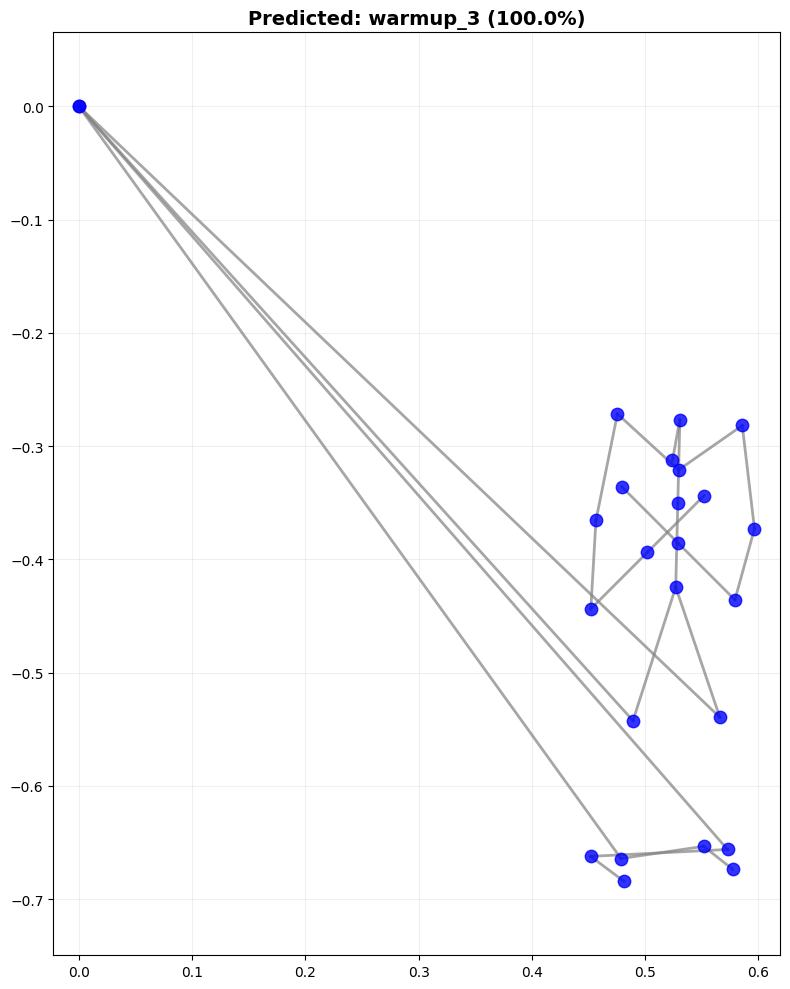


💾 Results saved to: /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_10_result.json

✅ Prediction complete!


In [46]:
"""
Video Prediction Pipeline for ST-GCN Exercise Classification
============================================================
Uses your trained model with 47 exercise classes.
"""

import os
import json
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import cv2
import mediapipe as mp
import pickle
from IPython.display import Video, display
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# ── GPU configuration ─────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# ── Model paths (FIXED) ──────────────────────────────────────────────────────
# Your model is saved as best_stgcn_v2.pt, not stgcn_output.pkl
MODEL_PATH = "/kaggle/working/stgcn_output/best_stgcn_v2.pt"
ENCODER_PATH = "/kaggle/working/stgcn_output/label_encoder.pkl"

# ── Video path (SET YOUR VIDEO PATH HERE) ──────────────────────────────────
VIDEO_PATH = "/kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_10.mp4"  # ← CHANGE THIS

# ── ST-GCN Model Architecture ──────────────────────────────────────────────
N_JOINTS = 25
C_IN = 10

class SpatialGraphConv(nn.Module):
    def __init__(self, c_in: int, c_out: int, k: int = 3):
        super().__init__()
        self.k = k
        self.c_out = c_out
        self.W = nn.Conv2d(c_in, c_out * k, kernel_size=1, bias=False)
        self.M = nn.Parameter(torch.ones(k, N_JOINTS, N_JOINTS) / (k * N_JOINTS))
        self.bn = nn.BatchNorm2d(c_out)
        
    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        B, C, T, N = x.shape
        y = self.W(x)
        A_hat = A.unsqueeze(0) * self.M
        
        out = torch.zeros(B, self.c_out, T, N, device=x.device, dtype=x.dtype)
        for ki in range(self.k):
            xk = y[:, ki * self.c_out:(ki + 1) * self.c_out, :, :]
            xk_r = xk.permute(0, 2, 1, 3).reshape(B * T, self.c_out, N)
            out_k = torch.bmm(xk_r, A_hat[ki].t().unsqueeze(0).expand(B * T, -1, -1))
            out += out_k.reshape(B, T, self.c_out, N).permute(0, 2, 1, 3)
        return F.relu(self.bn(out))

class STGCNBlock(nn.Module):
    def __init__(self, c_in: int, c_out: int, temporal_stride: int = 1, dropout: float = 0.3):
        super().__init__()
        self.gcn = SpatialGraphConv(c_in, c_out)
        pad = 4
        self.tcn = nn.Sequential(
            nn.Conv2d(c_out, c_out, kernel_size=(9, 1), stride=(temporal_stride, 1), padding=(pad, 0)),
            nn.BatchNorm2d(c_out),
        )
        self.dropout = nn.Dropout(dropout)
        
        if c_in != c_out or temporal_stride != 1:
            self.residual = nn.Sequential(
                nn.Conv2d(c_in, c_out, kernel_size=1, stride=(temporal_stride, 1)),
                nn.BatchNorm2d(c_out),
            )
        else:
            self.residual = nn.Identity()
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x: torch.Tensor, A: torch.Tensor) -> torch.Tensor:
        res = self.residual(x)
        x = self.gcn(x, A)
        x = self.tcn(x)
        x = self.dropout(x)
        return self.relu(x + res)

class STGCN(nn.Module):
    def __init__(self, c_in: int, num_classes: int, dropout: float = 0.3):
        super().__init__()
        self.bn_in = nn.BatchNorm1d(c_in * N_JOINTS)
        
        self.blocks = nn.ModuleList([
            STGCNBlock(c_in, 64, temporal_stride=1, dropout=dropout),
            STGCNBlock(64, 64, temporal_stride=2, dropout=dropout),
            STGCNBlock(64, 128, temporal_stride=1, dropout=dropout),
            STGCNBlock(128, 128, temporal_stride=2, dropout=dropout),
            STGCNBlock(128, 256, temporal_stride=1, dropout=dropout),
            STGCNBlock(256, 256, temporal_stride=1, dropout=dropout),
        ])
        self.dropout_head = nn.Dropout(dropout)
        self.fc = nn.Linear(256, num_classes)
        
    def forward(self, x: torch.Tensor, A: torch.Tensor, mask: torch.Tensor = None) -> torch.Tensor:
        B, T, N, C = x.shape
        x = x.view(B * T, N * C)
        x = self.bn_in(x)
        x = x.view(B, T, N, C).permute(0, 3, 1, 2)
        
        for block in self.blocks:
            x = block(x, A)
        
        if mask is not None:
            T_prime = x.shape[2]
            m = mask.float().unsqueeze(1)
            m = F.adaptive_avg_pool1d(m, T_prime).squeeze(1)
            m = m.unsqueeze(1).unsqueeze(-1)
            x = (x * m).sum(dim=(2, 3)) / (m.sum(dim=(2, 3)) + 1e-8)
        else:
            x = x.mean(dim=(2, 3))
        
        x = self.dropout_head(x)
        return self.fc(x)

# ── Build adjacency matrix ──────────────────────────────────────────────────
def build_adj(add_self_loops: bool = True) -> torch.Tensor:
    EDGES = [
        (0,7), (7,8), (8,9), (9,10),
        (0,1), (1,2), (2,3), (3,17), (17,18),
        (0,4), (4,5), (5,6), (6,19), (19,20),
        (8,14), (14,15), (15,16), (16,23), (23,24),
        (8,11), (11,12), (12,13), (13,21), (21,22),
        (11,14), (1,4),
    ]
    
    A = np.zeros((N_JOINTS, N_JOINTS), dtype=np.float32)
    for i, j in EDGES:
        A[i, j] = 1.0
        A[j, i] = 1.0
    if add_self_loops:
        A += np.eye(N_JOINTS, dtype=np.float32)
    D = A.sum(axis=1)
    D_inv_sqrt = np.where(D > 0, 1.0 / np.sqrt(D), 0.0)
    A_norm = D_inv_sqrt[:, None] * A * D_inv_sqrt[None, :]
    return torch.tensor(A_norm, dtype=torch.float32)

# ── MediaPipe to Human3.6M conversion ──────────────────────────────────────
MP_TO_H36M = {
    11: 11, 12: 14, 13: 12, 14: 15, 15: 13, 16: 16,
    23: 0, 24: 0, 25: 4, 26: 1, 27: 6, 28: 3,
    29: 18, 30: 20, 31: 17, 32: 19,
    0: 9, 9: 10,
}

def mediapipe_to_h36m(landmarks):
    h36m_joints = np.zeros((25, 3))
    
    for mp_idx, h36m_idx in MP_TO_H36M.items():
        if mp_idx < len(landmarks):
            h36m_joints[h36m_idx] += np.array([landmarks[mp_idx].x, 
                                               landmarks[mp_idx].y, 
                                               landmarks[mp_idx].z])
    
    l_hip = np.array([landmarks[23].x, landmarks[23].y, landmarks[23].z]) if 23 < len(landmarks) else np.zeros(3)
    r_hip = np.array([landmarks[24].x, landmarks[24].y, landmarks[24].z]) if 24 < len(landmarks) else np.zeros(3)
    h36m_joints[0] = (l_hip + r_hip) / 2
    
    l_shoulder = np.array([landmarks[11].x, landmarks[11].y, landmarks[11].z]) if 11 < len(landmarks) else np.zeros(3)
    r_shoulder = np.array([landmarks[12].x, landmarks[12].y, landmarks[12].z]) if 12 < len(landmarks) else np.zeros(3)
    shoulder_center = (l_shoulder + r_shoulder) / 2
    hip_center = h36m_joints[0]
    
    h36m_joints[7] = (shoulder_center + hip_center) / 2
    h36m_joints[8] = shoulder_center * 0.7 + hip_center * 0.3
    h36m_joints[9] = shoulder_center
    
    if 0 < len(landmarks):
        h36m_joints[10] = np.array([landmarks[0].x, landmarks[0].y + 0.1, landmarks[0].z])
    
    if 15 < len(landmarks):
        l_wrist = np.array([landmarks[15].x, landmarks[15].y, landmarks[15].z])
        h36m_joints[21] = l_wrist + np.array([0.05, -0.05, 0])
        h36m_joints[22] = l_wrist + np.array([0.1, -0.1, 0])
    if 16 < len(landmarks):
        r_wrist = np.array([landmarks[16].x, landmarks[16].y, landmarks[16].z])
        h36m_joints[23] = r_wrist + np.array([-0.05, -0.05, 0])
        h36m_joints[24] = r_wrist + np.array([-0.1, -0.1, 0])
    
    return h36m_joints

# ── Feature extraction ──────────────────────────────────────────────────
def torso_normalise_seq(joints_seq: np.ndarray) -> np.ndarray:
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    translated = joints_seq - hips[:, None, :]
    torso_len = np.linalg.norm(neck - hips, axis=1).mean()
    if torso_len < 1e-6:
        torso_len = 1.0
    return translated / torso_len

def bone_length_ratios(joints_seq: np.ndarray) -> np.ndarray:
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    torso = np.linalg.norm(neck - hips, axis=1).mean() + 1e-8
    
    EDGES = [
        (0,7), (7,8), (8,9), (9,10),
        (0,1), (1,2), (2,3), (3,17), (17,18),
        (0,4), (4,5), (5,6), (6,19), (19,20),
        (8,14), (14,15), (15,16), (16,23), (23,24),
        (8,11), (11,12), (12,13), (13,21), (21,22),
    ]
    
    parent = {0: 0}
    for i, j in EDGES:
        if j not in parent:
            parent[j] = i
        if i not in parent:
            parent[i] = j
    
    ratios = np.zeros(N_JOINTS, dtype=np.float32)
    for jdx in range(N_JOINTS):
        p = parent.get(jdx, jdx)
        bone_len = np.linalg.norm(
            joints_seq[:, jdx, :] - joints_seq[:, p, :], axis=1
        ).mean()
        ratios[jdx] = bone_len / torso
    return ratios

def extract_node_features(joints_seq: np.ndarray) -> np.ndarray:
    T = joints_seq.shape[0]
    
    pos = torso_normalise_seq(joints_seq)
    
    vel = np.zeros_like(pos)
    vel[1:] = pos[1:] - pos[:-1]
    vel[0] = vel[1]
    
    acc = np.zeros_like(vel)
    acc[1:] = vel[1:] - vel[:-1]
    acc[0] = acc[1]
    acc[1] = acc[2] if T > 2 else acc[1]
    
    br = bone_length_ratios(joints_seq)
    br_expanded = np.tile(br[None, :, None], (T, 1, 1))
    
    feat = np.concatenate([pos, vel, acc, br_expanded], axis=-1)
    return feat.astype(np.float32)

# ── Video processing ──────────────────────────────────────────────────────
def process_video(video_path, max_frames=300):
    mp_pose = mp.solutions.pose
    pose = mp_pose.Pose(
        static_image_mode=False,
        model_complexity=2,
        min_detection_confidence=0.5,
        min_tracking_confidence=0.5
    )
    
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    if total_frames > max_frames:
        frame_indices = np.linspace(0, total_frames - 1, max_frames, dtype=int)
    else:
        frame_indices = range(total_frames)
    
    joints_sequence = []
    success_frames = 0
    
    for frame_idx in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if not ret:
            continue
        
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(rgb_frame)
        
        if results.pose_landmarks:
            landmarks = results.pose_landmarks.landmark
            h36m_joints = mediapipe_to_h36m(landmarks)
            joints_sequence.append(h36m_joints)
            success_frames += 1
    
    cap.release()
    pose.close()
    
    print(f"   Extracted {success_frames} frames with pose detection")
    
    if success_frames < 10:
        print("   ⚠️ Not enough frames with detected pose!")
        return None
    
    return np.array(joints_sequence)

# ── Prediction function ──────────────────────────────────────────────────
def predict_video(video_path, model, adj, label_encoder, max_frames=300):
    print(f"\n🎬 Processing: {os.path.basename(video_path)}")
    
    joints_seq = process_video(video_path, max_frames)
    if joints_seq is None:
        return None
    
    features = extract_node_features(joints_seq)
    
    x = torch.tensor(features).unsqueeze(0).to(device)
    mask = torch.ones(1, x.shape[1], dtype=torch.bool).to(device)
    
    model.eval()
    with torch.no_grad():
        logits = model(x, adj, mask)
        probs = F.softmax(logits, dim=1)
        pred_class = logits.argmax(1).cpu().numpy()[0]
        confidence = probs.max().cpu().numpy()
    
    class_name = label_encoder.classes_[pred_class]
    
    top5_probs, top5_indices = torch.topk(probs, k=min(5, len(label_encoder.classes_)), dim=1)
    top5_probs = top5_probs.cpu().numpy()[0]
    top5_indices = top5_indices.cpu().numpy()[0]
    top5_classes = [label_encoder.classes_[idx] for idx in top5_indices]
    
    return {
        'predicted_class': class_name,
        'confidence': confidence,
        'top5_classes': top5_classes,
        'top5_probs': top5_probs,
        'joints_sequence': joints_seq,
    }

# ── Visualization ──────────────────────────────────────────────────────
def visualize_prediction(result, video_path):
    if result is None:
        print("❌ No prediction available.")
        return
    
    print("\n" + "="*60)
    print(f"🎯 PREDICTED EXERCISE: {result['predicted_class']}")
    print(f"📊 Confidence: {result['confidence']:.2%}")
    print("="*60)
    
    print("\n🏆 Top-5 Predictions:")
    for i, (cls, prob) in enumerate(zip(result['top5_classes'], result['top5_probs'])):
        bar = "█" * int(prob * 40)
        print(f"  {i+1}. {cls:30} {bar} {prob:.2%}")
    
    print("\n📹 Video:")
    display(Video(video_path, embed=True, width=400))
    
    if result['joints_sequence'] is not None:
        joints = result['joints_sequence'][-1]
        
        fig, ax = plt.subplots(figsize=(8, 10))
        
        EDGES = [
            (0,7), (7,8), (8,9), (9,10),
            (0,1), (1,2), (2,3), (3,17), (17,18),
            (0,4), (4,5), (5,6), (6,19), (19,20),
            (8,14), (14,15), (15,16), (16,23), (23,24),
            (8,11), (11,12), (12,13), (13,21), (21,22),
        ]
        
        for i, j in EDGES:
            ax.plot([joints[i, 0], joints[j, 0]], 
                   [-joints[i, 1], -joints[j, 1]], 
                   'gray', linewidth=2, alpha=0.7)
        
        ax.scatter(joints[:, 0], -joints[:, 1], c='blue', s=80, alpha=0.8, zorder=5)
        
        ax.set_title(f"Predicted: {result['predicted_class']} ({result['confidence']:.1%})",
                    fontsize=14, fontweight='bold')
        ax.axis('equal')
        ax.grid(True, alpha=0.2)
        plt.tight_layout()
        plt.show()

# ── MAIN EXECUTION ──────────────────────────────────────────────────────────

print("="*60)
print("🏋️ ST-GCN Exercise Classification - Video Predictor")
print(f"📊 Model trained on 47 exercise classes")
print("="*60)

# ── Load model ──────────────────────────────────────────────────────────────

model = None
label_encoder = None
adj = None

# Check if model files exist
if os.path.exists(MODEL_PATH) and os.path.exists(ENCODER_PATH):
    try:
        print("Loading model...")
        
        # Load label encoder
        with open(ENCODER_PATH, 'rb') as f:
            label_encoder = pickle.load(f)
        num_classes = len(label_encoder.classes_)
        print(f"✅ Found {num_classes} exercise classes")
        print(f"   First 10 classes: {list(label_encoder.classes_)[:10]}...")
        
        # Build adjacency
        adj = build_adj().to(device)
        print("✅ Built adjacency matrix")
        
        # Initialize and load model
        model = STGCN(c_in=C_IN, num_classes=num_classes).to(device)
        model.load_state_dict(torch.load(MODEL_PATH, map_location=device, weights_only=False))
        model.eval()
        
        print(f"✅ Model loaded successfully!")
        
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        import traceback
        traceback.print_exc()
        model = None
else:
    print("❌ Model or encoder not found!")
    print(f"   Expected model: {MODEL_PATH}")
    print(f"   Expected encoder: {ENCODER_PATH}")
    print("\nPlease check your model paths.")

# ── Process video ──────────────────────────────────────────────────────────

if model is not None:
    # ── SET YOUR VIDEO PATH HERE ────────────────────────────────────────────
    VIDEO_PATH = "/kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_10.mp4"  # ← CHANGE THIS
    
    print(f"\n📂 Video path: {VIDEO_PATH}")
    
    # Check if video exists
    if os.path.exists(VIDEO_PATH):
        # Run prediction
        result = predict_video(VIDEO_PATH, model, adj, label_encoder)
        
        if result:
            visualize_prediction(result, VIDEO_PATH)
            
            # Save results
            result_path = VIDEO_PATH.replace('.mp4', '_result.json')
            with open(result_path, 'w') as f:
                json.dump({
                    'predicted_class': result['predicted_class'],
                    'confidence': float(result['confidence']),
                    'top5_classes': [str(c) for c in result['top5_classes']],
                    'top5_probs': [float(p) for p in result['top5_probs']],
                    'video_path': VIDEO_PATH
                }, f, indent=2)
            print(f"\n💾 Results saved to: {result_path}")
        else:
            print("❌ Failed to process video.")
    else:
        print(f"\n❌ Video file not found: {VIDEO_PATH}")
        print("\n📌 Please update the VIDEO_PATH variable.")
        
        # List available video files in common locations
        print("\n📁 Available video files in /kaggle/working/:")
        if os.path.exists("/kaggle/working/"):
            for root, dirs, files in os.walk("/kaggle/working/"):
                for file in files:
                    if file.endswith(('.mp4', '.avi', '.mov', '.mkv')):
                        full_path = os.path.join(root, file)
                        # Show relative path from /kaggle/working/
                        rel_path = full_path.replace("/kaggle/working/", "")
                        print(f"   - {rel_path}")
        
        # Also check /kaggle/input/
        print("\n📁 Available video files in /kaggle/input/:")
        if os.path.exists("/kaggle/input/"):
            for root, dirs, files in os.walk("/kaggle/input/"):
                for file in files:
                    if file.endswith(('.mp4', '.avi', '.mov', '.mkv')):
                        full_path = os.path.join(root, file)
                        rel_path = full_path.replace("/kaggle/input/", "")
                        print(f"   - /kaggle/input/{rel_path}")
else:
    print("\n❌ Cannot process video - model not loaded!")

print("\n" + "="*60)
print("✅ Prediction complete!")
print("="*60)

In [47]:
# Take ONE training clip's joints3d_25 JSON (ground truth)
import json, numpy as np
with open("/kaggle/working/train/s11/joints3d_25/squat.json") as f:
    gt = np.array(json.load(f)["joints3d_25"])  # (T,25,3)

# Compare bone-length ratio sanity
hips, neck = gt[:, 0, :], gt[:, 9, :]
torso = np.linalg.norm(neck - hips, axis=1).mean()
print("GT torso length:", torso)
print("GT joint7 (spine) std dev from hips:", np.linalg.norm(gt[:,7,:] - hips, axis=1).std())

# Now run your MediaPipe extractor on the corresponding raw video
# and print the same stats for the output — if joint7's distance from hips
# is ~0 throughout (because you set joints[7]=joints[0]), that's your smoking gun.

GT torso length: 0.16956596162590878
GT joint7 (spine) std dev from hips: 0.0


In [49]:
import cv2, mediapipe as mp, numpy as np
mp_pose = mp.solutions.pose

cap = cv2.VideoCapture("/kaggle/working/fit3d_first_camera/train/s10/videos/50591643/warmup_10.mp4")
ret, frame = cap.read()
rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
with mp_pose.Pose(static_image_mode=True, model_complexity=2) as pose:
    res = pose.process(rgb)
lms = res.pose_landmarks.landmark
PL = mp_pose.PoseLandmark

l_hip = np.array([lms[PL.LEFT_HIP.value].x, lms[PL.LEFT_HIP.value].y, lms[PL.LEFT_HIP.value].z])
r_hip = np.array([lms[PL.RIGHT_HIP.value].x, lms[PL.RIGHT_HIP.value].y, lms[PL.RIGHT_HIP.value].z])
l_sh  = np.array([lms[PL.LEFT_SHOULDER.value].x, lms[PL.LEFT_SHOULDER.value].y, lms[PL.LEFT_SHOULDER.value].z])
r_sh  = np.array([lms[PL.RIGHT_SHOULDER.value].x, lms[PL.RIGHT_SHOULDER.value].y, lms[PL.RIGHT_SHOULDER.value].z])

hip_mid = (l_hip + r_hip) / 2
sh_mid  = (l_sh + r_sh) / 2
print("torso length (hip_mid to shoulder_mid):", np.linalg.norm(sh_mid - hip_mid))
print("raw hip coords:", hip_mid)
print("raw shoulder coords:", sh_mid)

W0000 00:00:1782287309.576329     943 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782287309.758733     942 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


torso length (hip_mid to shoulder_mid): 0.1638007575951172
raw hip coords: [ 5.28202161e-01  4.27371472e-01 -7.41994008e-05]
raw shoulder coords: [ 0.53222872  0.27632764 -0.06332162]


In [52]:
"""
Diagnostic: compare a TRAINING clip's features/prediction against an
INFERENCE-time (video_to_json) clip's features/prediction, using the
exact same feature extraction + model the real pipeline uses.

Run this in your Kaggle/Colab environment (needs torch, numpy, pickle,
and your saved model files). Fill in the paths below.
"""
import json, pickle
import numpy as np
import torch
import torch.nn.functional as F

# ---- EDIT THESE ----
TRAIN_JSON   = "/kaggle/working/train/s05/joints3d_25/squat.json"   # any training clip
INFER_JSON   = "/kaggle/working/train/s10/joints3d_25/squat.json"  # same/similar exercise, generated by your video_to_json
MODEL_PATH   = "/kaggle/working/stgcn_output/best_stgcn_v2.pt"
ENCODER_PATH = "/kaggle/working/stgcn_output/label_encoder.pkl"
# ---------------------

N_JOINTS = 25
EDGES = [
    (0,7),(7,8),(8,9),(9,10),
    (0,1),(1,2),(2,3),(3,17),(17,18),
    (0,4),(4,5),(5,6),(6,19),(19,20),
    (8,14),(14,15),(15,16),(16,23),(23,24),
    (8,11),(11,12),(12,13),(13,21),(21,22),
    (11,14),(1,4),
]

def build_adj(add_self_loops=True):
    A = np.zeros((N_JOINTS, N_JOINTS), dtype=np.float32)
    for i, j in EDGES:
        A[i, j] = 1.0; A[j, i] = 1.0
    if add_self_loops:
        A += np.eye(N_JOINTS, dtype=np.float32)
    D = A.sum(axis=1)
    D_inv_sqrt = np.where(D > 0, 1.0 / np.sqrt(D), 0.0)
    A_norm = D_inv_sqrt[:, None] * A * D_inv_sqrt[None, :]
    return torch.tensor(A_norm, dtype=torch.float32)

def torso_normalise_seq(joints_seq):
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    translated = joints_seq - hips[:, None, :]
    torso_len = np.linalg.norm(neck - hips, axis=1).mean()
    if torso_len < 1e-6:
        torso_len = 1.0
    return translated / torso_len

def bone_length_ratios(joints_seq):
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    torso = np.linalg.norm(neck - hips, axis=1).mean() + 1e-8
    parent = {0: 0}
    for i, j in EDGES:
        if j not in parent: parent[j] = i
        if i not in parent: parent[i] = j
    ratios = np.zeros(N_JOINTS, dtype=np.float32)
    for jdx in range(N_JOINTS):
        p = parent.get(jdx, jdx)
        bone_len = np.linalg.norm(joints_seq[:, jdx, :] - joints_seq[:, p, :], axis=1).mean()
        ratios[jdx] = bone_len / torso
    return ratios

def extract_node_features(joints_seq):
    T = joints_seq.shape[0]
    pos = torso_normalise_seq(joints_seq)
    vel = np.zeros_like(pos); vel[1:] = pos[1:] - pos[:-1]; vel[0] = vel[1]
    acc = np.zeros_like(vel); acc[1:] = vel[1:] - vel[:-1]; acc[0] = acc[1]
    if T > 2: acc[1] = acc[2]
    br = bone_length_ratios(joints_seq)
    br_expanded = np.tile(br[None, :, None], (T, 1, 1))
    feat = np.concatenate([pos, vel, acc, br_expanded], axis=-1)
    return feat.astype(np.float32)

def load_json(path):
    with open(path) as f:
        data = json.load(f)
    arr = np.array(data["joints3d_25"], dtype=np.float32)
    return arr

def describe(name, joints_seq):
    print(f"\n=== {name} ===")
    print("shape:", joints_seq.shape)
    print("frame0 hip coord:", joints_seq[0, 0])
    print("value range x:", joints_seq[:,:,0].min(), joints_seq[:,:,0].max())
    print("value range y:", joints_seq[:,:,1].min(), joints_seq[:,:,1].max())
    print("value range z:", joints_seq[:,:,2].min(), joints_seq[:,:,2].max())
    hips, neck = joints_seq[:,0,:], joints_seq[:,9,:]
    torso = np.linalg.norm(neck-hips, axis=1)
    print("torso length mean/std:", torso.mean(), torso.std())
    feat = extract_node_features(joints_seq)
    print("feature tensor shape:", feat.shape)
    print("feature mean/std per channel:", feat.reshape(-1, feat.shape[-1]).mean(0).round(4),
          feat.reshape(-1, feat.shape[-1]).std(0).round(4))
    return feat

train_seq = load_json(TRAIN_JSON)
infer_seq = load_json(INFER_JSON)

train_feat = describe("TRAINING json", train_seq)
infer_feat = describe("INFERENCE json", infer_seq)

# ---- Run both through the actual trained model ----
import importlib, sys

# Minimal model def matching your training script
import torch.nn as nn

class SpatialGraphConv(nn.Module):
    def __init__(self, c_in, c_out, k=3):
        super().__init__()
        self.k = k; self.c_out = c_out
        self.W = nn.Conv2d(c_in, c_out*k, kernel_size=1, bias=False)
        self.M = nn.Parameter(torch.ones(k, N_JOINTS, N_JOINTS) / (k*N_JOINTS))
        self.bn = nn.BatchNorm2d(c_out)
    def forward(self, x, A):
        B,C,T,N = x.shape
        y = self.W(x)
        A_hat = A.unsqueeze(0) * self.M
        out = torch.zeros(B, self.c_out, T, N, device=x.device, dtype=x.dtype)
        for ki in range(self.k):
            xk = y[:, ki*self.c_out:(ki+1)*self.c_out, :, :]
            xk_r = xk.permute(0,2,1,3).reshape(B*T, self.c_out, N)
            out_k = torch.bmm(xk_r, A_hat[ki].t().unsqueeze(0).expand(B*T,-1,-1))
            out += out_k.reshape(B,T,self.c_out,N).permute(0,2,1,3)
        return F.relu(self.bn(out))

class STGCNBlock(nn.Module):
    def __init__(self, c_in, c_out, temporal_stride=1, dropout=0.3):
        super().__init__()
        self.gcn = SpatialGraphConv(c_in, c_out)
        self.tcn = nn.Sequential(
            nn.Conv2d(c_out, c_out, kernel_size=(9,1), stride=(temporal_stride,1), padding=(4,0)),
            nn.BatchNorm2d(c_out))
        self.dropout = nn.Dropout(dropout)
        if c_in != c_out or temporal_stride != 1:
            self.residual = nn.Sequential(
                nn.Conv2d(c_in, c_out, kernel_size=1, stride=(temporal_stride,1)),
                nn.BatchNorm2d(c_out))
        else:
            self.residual = nn.Identity()
        self.relu = nn.ReLU(inplace=True)
    def forward(self, x, A):
        res = self.residual(x)
        x = self.gcn(x, A); x = self.tcn(x); x = self.dropout(x)
        return self.relu(x + res)

class STGCN(nn.Module):
    def __init__(self, c_in, num_classes, dropout=0.3):
        super().__init__()
        self.bn_in = nn.BatchNorm1d(c_in*N_JOINTS)
        self.blocks = nn.ModuleList([
            STGCNBlock(c_in, 64, 1, dropout), STGCNBlock(64,64,2,dropout),
            STGCNBlock(64,128,1,dropout),     STGCNBlock(128,128,2,dropout),
            STGCNBlock(128,256,1,dropout),    STGCNBlock(256,256,1,dropout),
        ])
        self.dropout_head = nn.Dropout(dropout)
        self.fc = nn.Linear(256, num_classes)
    def forward(self, x, A, mask=None):
        B,T,N,C = x.shape
        x = x.view(B*T, N*C); x = self.bn_in(x)
        x = x.view(B,T,N,C).permute(0,3,1,2)
        for block in self.blocks:
            x = block(x, A)
        if mask is not None:
            T_prime = x.shape[2]
            m = mask.float().unsqueeze(1)
            m = F.adaptive_avg_pool1d(m, T_prime).squeeze(1)
            m = m.unsqueeze(1).unsqueeze(-1)
            x = (x*m).sum(dim=(2,3)) / (m.sum(dim=(2,3)) + 1e-8)
        else:
            x = x.mean(dim=(2,3))
        x = self.dropout_head(x)
        return self.fc(x)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
with open(ENCODER_PATH, "rb") as f:
    le = pickle.load(f)
num_classes = len(le.classes_)
adj = build_adj().to(device)
model = STGCN(c_in=10, num_classes=num_classes).to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval()

def run_predict(feat, name):
    x = torch.tensor(feat).unsqueeze(0).to(device)
    mask = torch.ones(1, x.shape[1], dtype=torch.bool).to(device)
    with torch.no_grad():
        logits = model(x, adj, mask)
        probs = F.softmax(logits, dim=1)
        top5p, top5i = torch.topk(probs, 5, dim=1)
    print(f"\n--- {name} prediction ---")
    for p, i in zip(top5p[0].cpu().numpy(), top5i[0].cpu().numpy()):
        print(f"  {le.classes_[i]:35s} {p:.4f}")

run_predict(train_feat, "TRAINING clip (sanity check - should be near 100% correct class)")
run_predict(infer_feat, "INFERENCE clip (from video_to_json)")


=== TRAINING json ===
shape: (1271, 25, 3)
frame0 hip coord: [ 5.4638278e-01  4.4605607e-01 -7.4514188e-05]
value range x: 0.4276826 0.6512489
value range y: 0.17630643 0.6886172
value range z: -0.4601621 0.5146702
torso length mean/std: 0.16109973 0.036169406
feature tensor shape: (1271, 25, 10)
feature mean/std per channel: [-0.1714 -0.0272  0.3996  0.     -0.      0.     -0.      0.     -0.
  0.5128] [0.364  0.909  0.7721 0.0112 0.0176 0.169  0.0157 0.0213 0.2552 0.4384]

=== INFERENCE json ===
shape: (1481, 25, 3)
frame0 hip coord: [ 5.650152e-01  4.414762e-01 -9.276997e-05]
value range x: 0.37788787 0.68643034
value range y: 0.1257409 0.6918605
value range z: -0.44451383 0.6785953
torso length mean/std: 0.18829161 0.043400444
feature tensor shape: (1481, 25, 10)
feature mean/std per channel: [-1.923e-01  4.300e-03  4.931e-01 -0.000e+00  0.000e+00  0.000e+00
  0.000e+00  0.000e+00 -1.000e-04  5.020e-01] [0.337  0.8008 0.7837 0.011  0.0175 0.1957 0.0152 0.022  0.294  0.4388]

--- T

In [54]:
"""
ST-GCN Exercise Classification — corrected end-to-end inference
=================================================================
video.mp4  -->  MediaPipe joints (native fps, no pre-subsampling)
            -->  extract_node_features  (pos/vel/acc/bone_ratio)
                 computed on the FULL sequence, exactly like training
            -->  subsample to T_MAX=150 AFTER features are computed
                 (matches pad_collate in the training script exactly)
            -->  STGCN model -> predicted class

Run this as the single source of truth for inference. Don't mix it
with the old mediapipe_to_h36m / process_video(max_frames=300) path —
that subsampled RAW joints before computing velocity/acceleration,
which corrupts 6 of the 10 input channels relative to what the model
was trained on.
"""

import os, json, pickle
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import cv2
import mediapipe as mp
import warnings
warnings.filterwarnings("ignore")

# ── Paths (EDIT THESE) ───────────────────────────────────────────────────────
MODEL_PATH   = "/kaggle/working/stgcn_output/best_stgcn_v2.pt"
ENCODER_PATH = "/kaggle/working/stgcn_output/label_encoder.pkl"
VIDEO_PATH   = "/kaggle/working/fit3d_first_camera/train/s10/videos/50591643/squat.mp4"

# ── Constants (must match training exactly) ──────────────────────────────────
N_JOINTS = 25
C_IN     = 10
T_MAX    = 150   # same as training Config.T_MAX

EDGES = [
    (0,7),(7,8),(8,9),(9,10),
    (0,1),(1,2),(2,3),(3,17),(17,18),
    (0,4),(4,5),(5,6),(6,19),(19,20),
    (8,14),(14,15),(15,16),(16,23),(23,24),
    (8,11),(11,12),(12,13),(13,21),(21,22),
    (11,14),(1,4),
]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")


# ── Adjacency (identical to training) ────────────────────────────────────────
def build_adj(add_self_loops: bool = True) -> torch.Tensor:
    A = np.zeros((N_JOINTS, N_JOINTS), dtype=np.float32)
    for i, j in EDGES:
        A[i, j] = 1.0
        A[j, i] = 1.0
    if add_self_loops:
        A += np.eye(N_JOINTS, dtype=np.float32)
    D = A.sum(axis=1)
    D_inv_sqrt = np.where(D > 0, 1.0 / np.sqrt(D), 0.0)
    A_norm = D_inv_sqrt[:, None] * A * D_inv_sqrt[None, :]
    return torch.tensor(A_norm, dtype=torch.float32)


# ── Joint extraction — SAME mapping used to build the training set ──────────
def extract_frame(lms) -> np.ndarray:
    def lm(i):
        p = lms[i]
        return np.array([p.x, p.y, p.z])

    PL = mp.solutions.pose.PoseLandmark
    joints = np.zeros((25, 3), dtype=np.float32)

    joints[0]  = (lm(PL.LEFT_HIP.value) + lm(PL.RIGHT_HIP.value)) / 2
    joints[1]  = lm(PL.RIGHT_HIP.value)
    joints[2]  = lm(PL.RIGHT_KNEE.value)
    joints[3]  = lm(PL.RIGHT_ANKLE.value)
    joints[4]  = lm(PL.LEFT_HIP.value)
    joints[5]  = lm(PL.LEFT_KNEE.value)
    joints[6]  = lm(PL.LEFT_ANKLE.value)
    joints[7]  = joints[0]                       # spine == hips (confirmed in real data)
    joints[8]  = lm(PL.RIGHT_SHOULDER.value) * 0.5 + lm(PL.LEFT_SHOULDER.value) * 0.5
    joints[9]  = joints[8]                       # neck == joint 8 (confirmed)
    joints[10] = lm(PL.NOSE.value)
    joints[11] = lm(PL.LEFT_SHOULDER.value)
    joints[12] = lm(PL.LEFT_ELBOW.value)
    joints[13] = lm(PL.LEFT_WRIST.value)
    joints[14] = lm(PL.RIGHT_SHOULDER.value)
    joints[15] = lm(PL.RIGHT_ELBOW.value)
    joints[16] = lm(PL.RIGHT_WRIST.value)
    joints[17] = lm(PL.LEFT_FOOT_INDEX.value)
    joints[18] = joints[17]                      # toe == foot (confirmed)
    joints[19] = lm(PL.RIGHT_FOOT_INDEX.value)
    joints[20] = joints[19]                      # toe == foot (confirmed)
    joints[21] = joints[13]                      # fingertip placeholders == wrist (confirmed)
    joints[22] = joints[13]
    joints[23] = joints[13]
    joints[24] = joints[13]
    return joints


def video_to_joints(video_path: str) -> np.ndarray:
    """
    Extract joints at the video's NATIVE frame rate — no subsampling here.
    Subsampling (if needed) happens later, on the computed FEATURE tensor,
    exactly mirroring pad_collate() in the training script.
    """
    mp_pose = mp.solutions.pose
    cap = cv2.VideoCapture(video_path)
    frames = []
    dropped = 0

    with mp_pose.Pose(static_image_mode=False, model_complexity=2,
                       min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            res = pose.process(rgb)
            if res.pose_landmarks is None:
                dropped += 1
                continue
            joints = extract_frame(res.pose_landmarks.landmark)
            frames.append(joints)

    cap.release()
    print(f"  Extracted {len(frames)} frames ({dropped} dropped, no pose detected)")
    if len(frames) < 10:
        raise RuntimeError("Too few frames with detected pose — check video/lighting/framing.")
    return np.array(frames, dtype=np.float32)   # (T, 25, 3)


# ── Feature extraction — IDENTICAL to preprocessing_gcn.py ──────────────────
def torso_normalise_seq(joints_seq: np.ndarray) -> np.ndarray:
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    translated = joints_seq - hips[:, None, :]
    torso_len = np.linalg.norm(neck - hips, axis=1).mean()
    if torso_len < 1e-6:
        torso_len = 1.0
    return translated / torso_len


def bone_length_ratios(joints_seq: np.ndarray) -> np.ndarray:
    hips = joints_seq[:, 0, :]
    neck = joints_seq[:, 9, :]
    torso = np.linalg.norm(neck - hips, axis=1).mean() + 1e-8
    parent = {0: 0}
    for (i, j) in EDGES:
        if j not in parent:
            parent[j] = i
        if i not in parent:
            parent[i] = j
    ratios = np.zeros(N_JOINTS, dtype=np.float32)
    for jdx in range(N_JOINTS):
        p = parent.get(jdx, jdx)
        bone_len = np.linalg.norm(joints_seq[:, jdx, :] - joints_seq[:, p, :], axis=1).mean()
        ratios[jdx] = bone_len / torso
    return ratios


def extract_node_features(joints_seq: np.ndarray) -> np.ndarray:
    """joints_seq: (T,25,3) raw, FULL native-framerate sequence -> (T,25,10)"""
    T = joints_seq.shape[0]
    pos = torso_normalise_seq(joints_seq)

    vel = np.zeros_like(pos)
    vel[1:] = pos[1:] - pos[:-1]
    vel[0] = vel[1]

    acc = np.zeros_like(vel)
    acc[1:] = vel[1:] - vel[:-1]
    acc[0] = acc[1]
    if T > 2:
        acc[1] = acc[2]

    br = bone_length_ratios(joints_seq)
    br_expanded = np.tile(br[None, :, None], (T, 1, 1))

    feat = np.concatenate([pos, vel, acc, br_expanded], axis=-1)
    return feat.astype(np.float32)


def subsample_features(feat: np.ndarray, t_max: int = T_MAX) -> np.ndarray:
    """Mirrors pad_collate's subsample(): uniform stride AFTER features
    are already computed, never before."""
    T = feat.shape[0]
    if T <= t_max:
        return feat
    idx = np.linspace(0, T - 1, t_max).astype(int)
    return feat[idx]


# ── Model (identical architecture) ───────────────────────────────────────────
class SpatialGraphConv(nn.Module):
    def __init__(self, c_in, c_out, k=3):
        super().__init__()
        self.k, self.c_out = k, c_out
        self.W = nn.Conv2d(c_in, c_out * k, kernel_size=1, bias=False)
        self.M = nn.Parameter(torch.ones(k, N_JOINTS, N_JOINTS) / (k * N_JOINTS))
        self.bn = nn.BatchNorm2d(c_out)

    def forward(self, x, A):
        B, C, T, N = x.shape
        y = self.W(x)
        A_hat = A.unsqueeze(0) * self.M
        out = torch.zeros(B, self.c_out, T, N, device=x.device, dtype=x.dtype)
        for ki in range(self.k):
            xk = y[:, ki * self.c_out:(ki + 1) * self.c_out, :, :]
            xk_r = xk.permute(0, 2, 1, 3).reshape(B * T, self.c_out, N)
            out_k = torch.bmm(xk_r, A_hat[ki].t().unsqueeze(0).expand(B * T, -1, -1))
            out += out_k.reshape(B, T, self.c_out, N).permute(0, 2, 1, 3)
        return F.relu(self.bn(out))


class STGCNBlock(nn.Module):
    def __init__(self, c_in, c_out, temporal_stride=1, dropout=0.3):
        super().__init__()
        self.gcn = SpatialGraphConv(c_in, c_out)
        self.tcn = nn.Sequential(
            nn.Conv2d(c_out, c_out, kernel_size=(9, 1), stride=(temporal_stride, 1), padding=(4, 0)),
            nn.BatchNorm2d(c_out),
        )
        self.dropout = nn.Dropout(dropout)
        if c_in != c_out or temporal_stride != 1:
            self.residual = nn.Sequential(
                nn.Conv2d(c_in, c_out, kernel_size=1, stride=(temporal_stride, 1)),
                nn.BatchNorm2d(c_out),
            )
        else:
            self.residual = nn.Identity()
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x, A):
        res = self.residual(x)
        x = self.gcn(x, A)
        x = self.tcn(x)
        x = self.dropout(x)
        return self.relu(x + res)


class STGCN(nn.Module):
    def __init__(self, c_in, num_classes, dropout=0.3):
        super().__init__()
        self.bn_in = nn.BatchNorm1d(c_in * N_JOINTS)
        self.blocks = nn.ModuleList([
            STGCNBlock(c_in, 64, 1, dropout), STGCNBlock(64, 64, 2, dropout),
            STGCNBlock(64, 128, 1, dropout),  STGCNBlock(128, 128, 2, dropout),
            STGCNBlock(128, 256, 1, dropout), STGCNBlock(256, 256, 1, dropout),
        ])
        self.dropout_head = nn.Dropout(dropout)
        self.fc = nn.Linear(256, num_classes)

    def forward(self, x, A, mask=None):
        B, T, N, C = x.shape
        x = x.view(B * T, N * C)
        x = self.bn_in(x)
        x = x.view(B, T, N, C).permute(0, 3, 1, 2)
        for block in self.blocks:
            x = block(x, A)
        if mask is not None:
            T_prime = x.shape[2]
            m = mask.float().unsqueeze(1)
            m = F.adaptive_avg_pool1d(m, T_prime).squeeze(1)
            m = m.unsqueeze(1).unsqueeze(-1)
            x = (x * m).sum(dim=(2, 3)) / (m.sum(dim=(2, 3)) + 1e-8)
        else:
            x = x.mean(dim=(2, 3))
        x = self.dropout_head(x)
        return self.fc(x)


# ── Predict ───────────────────────────────────────────────────────────────────
def predict_video(video_path: str, model, adj, label_encoder):
    print(f"\nProcessing: {os.path.basename(video_path)}")
    joints_seq = video_to_joints(video_path)              # (T_raw, 25, 3) native fps
    feat       = extract_node_features(joints_seq)        # (T_raw, 25, 10) full-res features
    feat       = subsample_features(feat, T_MAX)           # (<=150, 25, 10) post-hoc subsample

    x    = torch.tensor(feat).unsqueeze(0).to(device)      # (1, T, 25, 10)
    mask = torch.ones(1, x.shape[1], dtype=torch.bool).to(device)

    model.eval()
    with torch.no_grad():
        logits = model(x, adj, mask)
        probs  = F.softmax(logits, dim=1)
        top5p, top5i = torch.topk(probs, min(5, probs.shape[1]), dim=1)

    top5p = top5p.cpu().numpy()[0]
    top5i = top5i.cpu().numpy()[0]
    top5_classes = [label_encoder.classes_[i] for i in top5i]

    print(f"\nPredicted: {top5_classes[0]}  (confidence: {top5p[0]:.2%})")
    print("Top-5:")
    for cls, p in zip(top5_classes, top5p):
        print(f"  {cls:35s} {p:.2%}")

    return {"predicted_class": top5_classes[0], "confidence": float(top5p[0]),
            "top5_classes": top5_classes, "top5_probs": top5p.tolist()}


# ── Main ──────────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    with open(ENCODER_PATH, "rb") as f:
        label_encoder = pickle.load(f)
    num_classes = len(label_encoder.classes_)
    print(f"Loaded label encoder: {num_classes} classes")

    adj = build_adj().to(device)
    model = STGCN(c_in=C_IN, num_classes=num_classes).to(device)
    model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
    model.eval()
    print("Model loaded.")

    if not os.path.exists(VIDEO_PATH):
        raise FileNotFoundError(f"Video not found: {VIDEO_PATH}")

    result = predict_video(VIDEO_PATH, model, adj, label_encoder)

    out_path = VIDEO_PATH.rsplit(".", 1)[0] + "_result.json"
    with open(out_path, "w") as f:
        json.dump(result, f, indent=2)
    print(f"\nSaved result -> {out_path}")

Device: cuda
Loaded label encoder: 47 classes
Model loaded.

Processing: squat.mp4


W0000 00:00:1782288076.386139     988 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1782288076.571312     988 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


  Extracted 1481 frames (0 dropped, no pose detected)

Predicted: squat  (confidence: 94.39%)
Top-5:
  squat                               94.39%
  walk_the_box                        1.85%
  overhead_extension_thruster         0.57%
  clean_and_press                     0.39%
  one_arm_row                         0.35%

Saved result -> /kaggle/working/fit3d_first_camera/train/s10/videos/50591643/squat_result.json


In [55]:
import os

# Make sure rclone has your gdrive remote configured already (rclone config)
os.system(
    'rclone copy "/kaggle/working/stgcn_output/best_stgcn_v2.pt" '
    'gdrive:/Fitness_AI_Project/ -P'
)
os.system(
    'rclone copy "/kaggle/working/stgcn_output/label_encoder.pkl" '
    'gdrive:/Fitness_AI_Project/ -P'
)
os.system(
    'rclone copy "/kaggle/working/stgcn_output/training_curves.png" '
    'gdrive:/Fitness_AI_Project/ -P'
)
os.system(
    'rclone copy "/kaggle/working/stgcn_output/confusion_matrix_test.png" '
    'gdrive:/Fitness_AI_Project/ -P'
)

2026/06/24 08:06:23 CRITICAL: Failed to create file system for "gdrive:/Fitness_AI_Project/": couldn't find root directory ID: googleapi: Error 401: Request had invalid authentication credentials. Expected OAuth 2 access token, login cookie or other valid authentication credential. See https://developers.google.com/identity/sign-in/web/devconsole-project.
More details:
Reason: authError, Message: Invalid Credentials
2026/06/24 08:06:23 CRITICAL: Failed to create file system for "gdrive:/Fitness_AI_Project/": couldn't find root directory ID: googleapi: Error 401: Request had invalid authentication credentials. Expected OAuth 2 access token, login cookie or other valid authentication credential. See https://developers.google.com/identity/sign-in/web/devconsole-project.
More details:
Reason: authError, Message: Invalid Credentials
2026/06/24 08:06:23 CRITICAL: Failed to create file system for "gdrive:/Fitness_AI_Project/": couldn't find root directory ID: googleapi: Error 401: Request had

256